In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
#import uproot
import uproot3
from scipy import optimize as op

*Bin Conversions*
Available Functions:
Note: All functions return new arrays rather than altering the previous array
	New_Merged_Size(array_,merge_size_) returns what the size of the new merged array will be
	Merge_Bin_Edges(edges_,merge_size) merges the bin edges 
	Merge_Bins(array_,merge_size_) adds together every <merge_size_> values in an array
	Merge_Vals(yarray_,merge_size_) adds together every <merge_size_> ybin together in an array
	Merge_Bins(xarray_,merge_size_) averages every <merge_size_> xbins together in an array
	Count_Non_Zero(array_) counts the number of nonzero values in an array
	Count_Zero(array_) counts the number of zeros in an array
	Remove_Zeros(array_) remove zeros from an array
	Remove_Zeros_Y(yarray_) removes zero values from yarray
	Remove_Zeros_X(xarray_,yarray_) removes xbins where the corresponding y value was zero
	Count_InBounds(yarray_,low_,high_) counts the number of values that fall between bounds (or equal to)
	Count_OutBounds(yarray_,low_,high_) co

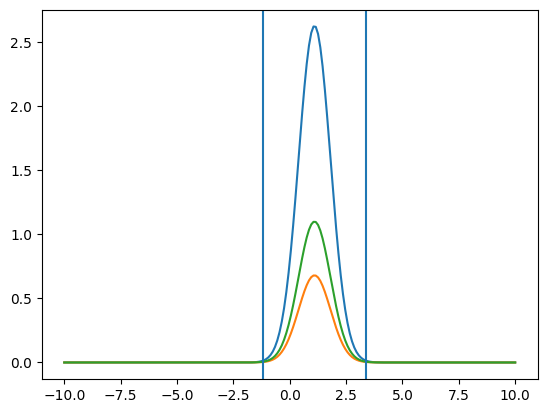

*Extracting Pieces for TH1*
Available Functions:
	Num_Xbins(TH1_) returns number of X bins for a TH1
	XEdges_1d(TH1_) returns edges of x bins for a TH1
	Center_Xbins(TH1_) returns center values for x bins for a TH1
	Values_1d(TH1_) returns the y values for a TH1
	Errors_1d(TH1_) returns the error values for TH1
	Errors2_1d(TH1_) returns the squared error values for TH1
Enjoy using TH1s

You have access to information regarding all bin numbers, bin maxes, bin mins
Each goes _VAR_max_ min, bins, res, etc. 
All the names of them as well as edges.
Q2_Bin_Name[ 5 ]
W_Bin_Name[ 29 ]
MM1_Bin_Name[ 14 ]
MM2_Bin_Name[ 14 ]
theta_Bin_Name[ 10 ]
alpha_Bin_Name[ 10 ]
phi_Bin_Name[ 10 ]
_var_set_name_ [i]
_Xij_name_[i][j]
Also _mm1_name_ etc. for all Xijs
def Q2_Corr(Q2bin_) corrects the cross section for simulation so far as Q2 is concerned


In [2]:
#Gain access to functions used to change some of the aspects regarding arrays and the things in them
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Bin\ Conversions.ipynb

#Gain Access to functions used to work with momentum binning
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Momentum\ Bins.ipynb

#Gain Access to functions used to work with Fitting Functions
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Fitting\ Functions.ipynb

#Gain Access to functions used for TH2s 
#uproot or uproo4
#%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH2\ Functions.ipynb
#uproot3
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH1\ Functions-uproot3.ipynb

#Gain Access to the proper binning for the the various variables
%run /Users/cmc/analysis_phd/fitting/single_diff/Friend\ Binning\ Values.ipynb

In [3]:
#date="06-13-2022"
date="07-15-2024"
par="pip"
SLURM_ID="13866486"
top="m"+par
dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_e16/"+date
#root_file=dir+"/exp_mm_"+par+"_e16_"+date+"_"+SLURM_ID+".root"
root_file=dir+"/exp_e16_clas6_mm_"+par+"_"+date+".root"
file=uproot3.open(root_file)


color_order = ['b','g','r']
cut_names=['tight','mid','loose']
cut_sig = [2.5,3,3.5]
sign2 = [-1,1]

In [4]:
Particle=''
if par == "pro":
    Particle = "Proton"
elif par == "pip":
    Particle = "\u03C0+"
elif par == "pim":
    Particle = "\u03C0-"

In [5]:
#The Various layers of TDirectories to get to the histograms
layer0='MM'
layer1='MM_'+top
layer2=layer1+"_no-cut"
layer3=[layer2+"_sec"+str(i+1) for i in range(6)]
layer4=[layer3[i]+"_clean" for i in range(6)]
layer51=[layer4[i]+"_W_dep" for i in range(6)]
layer52=[layer4[i]+"_W_Range" for i in range(6)]
dir_loc=[([layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer51[i]],[layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer52[i]]) for i in range(6)]
names1=[["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:"+W_Bin_Name[j] for j in range(_W_bins_)] for i in range(6)]
names2=["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:in_range" for i in range(6)]
#Histogram Names
hist_name=[[[file[dir_loc[i][0][0]][names1[i][j]] for j in range(_W_bins_)],file[dir_loc[i][1][0]][names2[i]]] for i in range(6)]
           

In [6]:
def fit_function(x_, bkgd_, n_, pars_):
    if bkgd_:
        gaus_pars = np.zeros(3)
        for i in range(3):
            gaus_pars[i] = pars_[i]
        poly_pars = np.zeros(n_+1)
        for i in range(n_+1):
            poly_pars[i] = pars_[i+3]
        return Gaus(x,*gaus_pars)+Poly(x,*poly_pars)
    else:
        return Gaus(x,*pars_)

In [7]:
x_tmp = Center_Xbins(hist_name[0][1])
print(x_tmp[50])
print(x_tmp[90])


0.025500001320615417
0.06550000266171993


Value Error1.1
	Just skip it for now


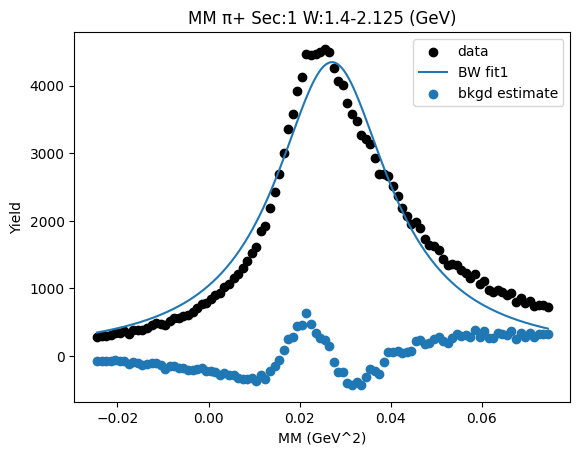

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.00777856 0.00525992 0.00323244]
 [0.05997808 0.06789935 0.07631176]]
Cut Bounds Err [[2.68616166e-06 2.64585928e-06 2.41720243e-06]
 [7.45897051e-06 9.50626426e-06 1.17447516e-05]]


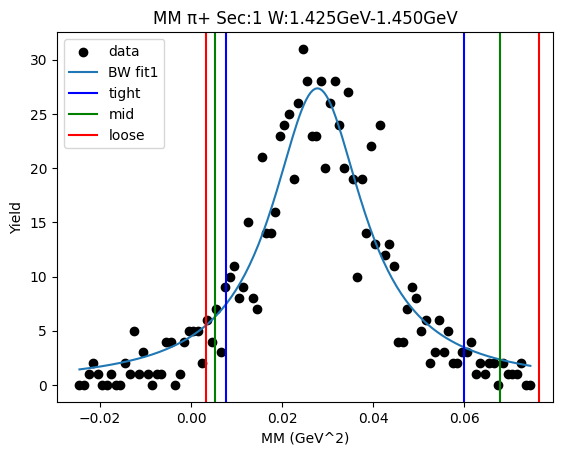

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.00791888 0.00539884 0.00336   ]
 [0.05958536 0.06739862 0.07569307]]
Cut Bounds Err [[2.29502295e-06 2.26984950e-06 2.08682356e-06]
 [6.29542314e-06 8.01996338e-06 9.90476836e-06]]


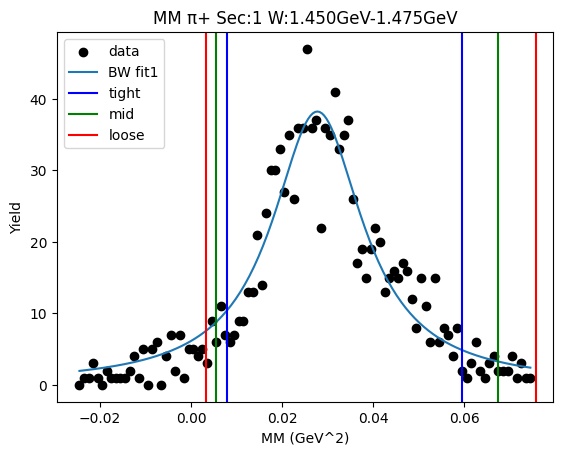

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.00773164 0.00520461 0.00317602]
 [0.06041638 0.0684263  0.07693467]]
Cut Bounds Err [[2.17762446e-06 2.14011900e-06 1.94830949e-06]
 [6.08729899e-06 7.75988960e-06 9.58909061e-06]]


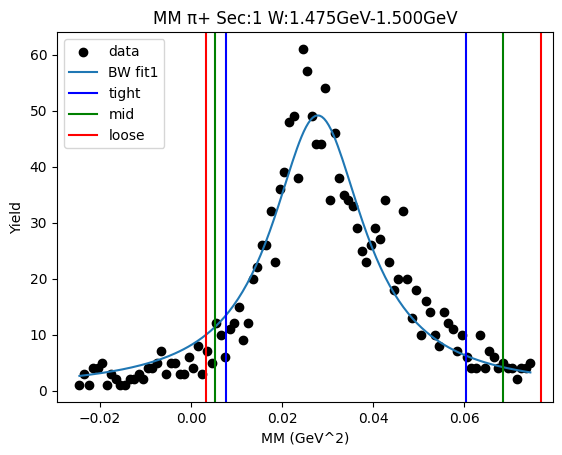

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.00722248 0.00466548 0.00266499]
 [0.0633999  0.07207839 0.08131338]]
Cut Bounds Err [[2.16321632e-06 2.08266444e-06 1.83443181e-06]
 [6.40915969e-06 8.18603276e-06 1.01329261e-05]]


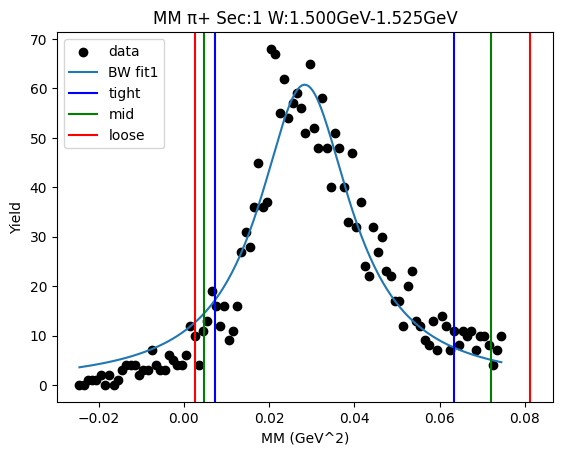

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.00736705 0.00484615 0.00285124]
 [0.06150607 0.06981297 0.07864586]]
Cut Bounds Err [[2.49292231e-06 2.42194587e-06 2.16501068e-06]
 [7.20312280e-06 9.19251093e-06 1.13705377e-05]]


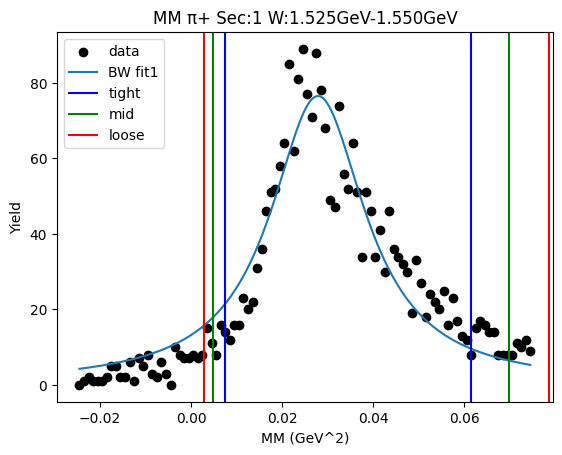

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.00678664 0.00429468 0.00237038]
 [0.06292762 0.07166385 0.08096775]]
Cut Bounds Err [[2.67612004e-06 2.55010884e-06 2.20793218e-06]
 [8.14889806e-06 1.04170213e-05 1.29042601e-05]]


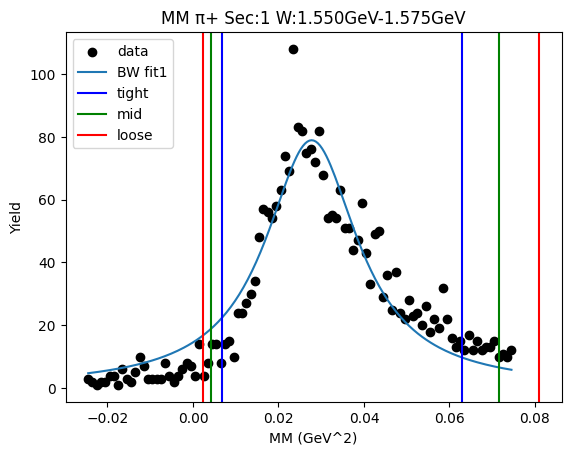

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.00743265 0.00482556 0.00277937]
 [0.06435278 0.07312971 0.08246754]]
Cut Bounds Err [[2.48211812e-06 2.39575098e-06 2.11897311e-06]
 [7.30355240e-06 9.32641224e-06 1.15423430e-05]]


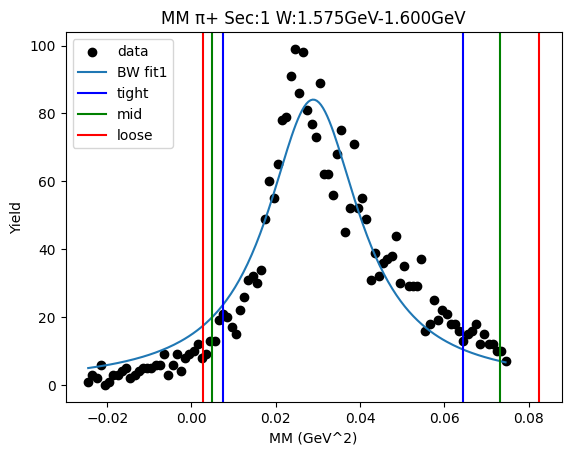

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.0070781  0.00450646 0.0025129 ]
 [0.06458939 0.07352    0.08302871]]
Cut Bounds Err [[2.28100807e-06 2.18025361e-06 1.89742335e-06]
 [6.89047217e-06 8.80627134e-06 1.09066274e-05]]


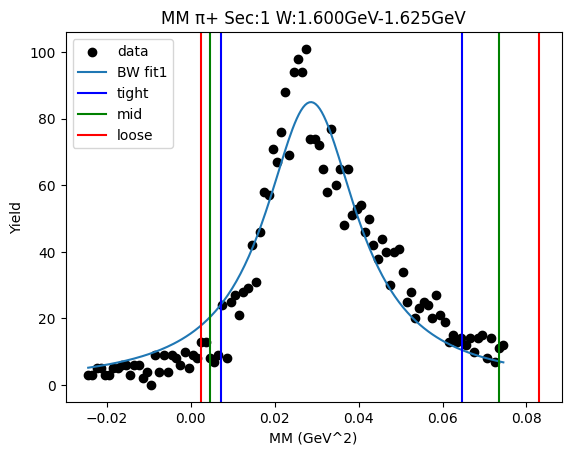

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.00682443 0.00434456 0.00242226]
 [0.06228938 0.0709025  0.08007319]]
Cut Bounds Err [[1.94669565e-06 1.86058616e-06 1.61908186e-06]
 [5.88127960e-06 7.51636017e-06 9.30897787e-06]]


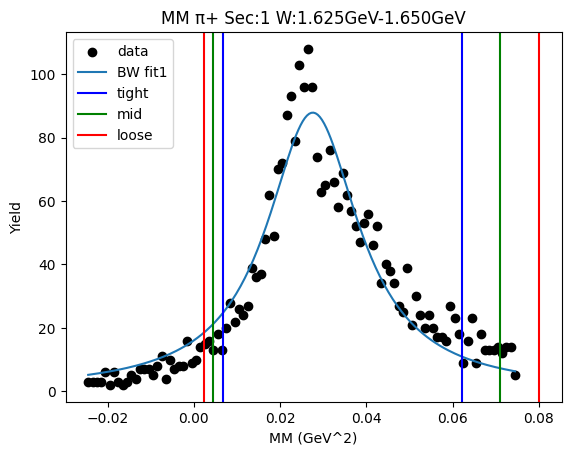

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.00652466 0.00411223 0.00225416]
 [0.06113847 0.06964881 0.0787135 ]]
Cut Bounds Err [[1.72568049e-06 1.64107928e-06 1.41600047e-06]
 [5.28249103e-06 6.75378922e-06 8.36748994e-06]]


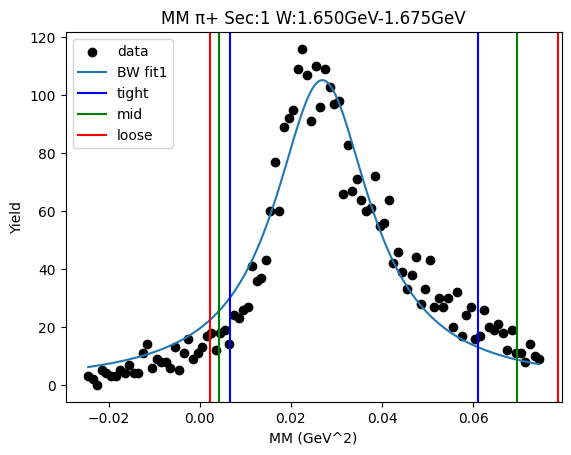

W bin: 11 1.675GeV-1.700GeV
Cut Bounds [[0.00649267 0.0040507  0.00218212]
 [0.06244846 0.07119765 0.08052023]]
Cut Bounds Err [[1.60020905e-06 1.51406854e-06 1.29509942e-06]
 [4.96279174e-06 6.34765614e-06 7.86713745e-06]]


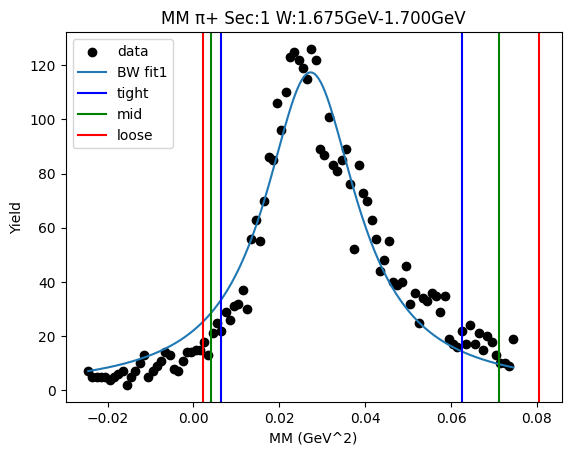

W bin: 12 1.700GeV-1.725GeV
Cut Bounds [[0.00759141 0.00512181 0.00313655]
 [0.05892635 0.06672374 0.07500547]]
Cut Bounds Err [[1.22690304e-06 1.20712423e-06 1.10086895e-06]
 [3.41824988e-06 4.35692889e-06 5.38338959e-06]]


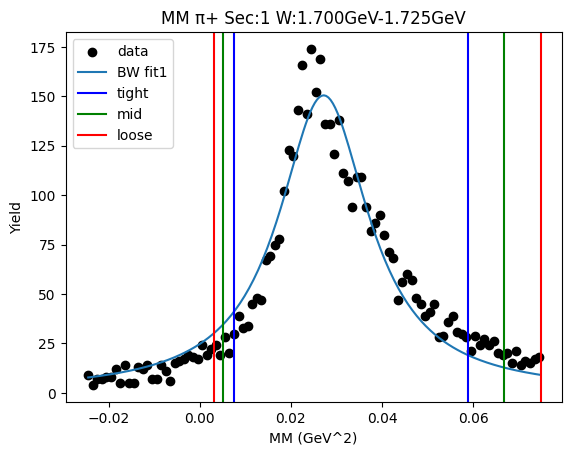

W bin: 13 1.725GeV-1.750GeV
Cut Bounds [[0.00738634 0.00492084 0.00295432]
 [0.05948469 0.06743886 0.075892  ]]
Cut Bounds Err [[1.71271997e-06 1.67450564e-06 1.51205209e-06]
 [4.86042565e-06 6.19900495e-06 7.66366138e-06]]


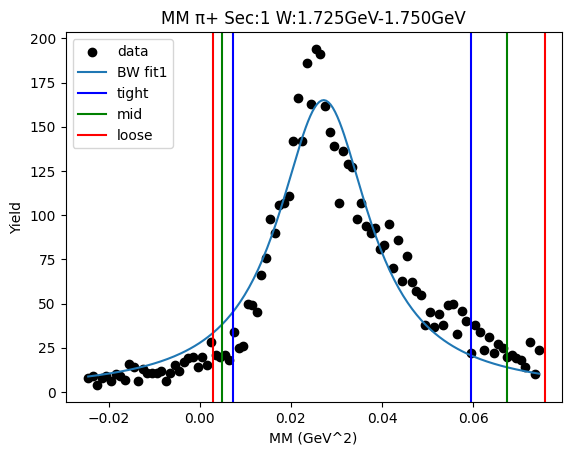

W bin: 14 1.750GeV-1.775GeV
Cut Bounds [[0.00721387 0.00467451 0.00268389]
 [0.06278822 0.07136373 0.08048798]]
Cut Bounds Err [[1.55094491e-06 1.49551747e-06 1.32064735e-06]
 [4.57563484e-06 5.84335622e-06 7.23219840e-06]]


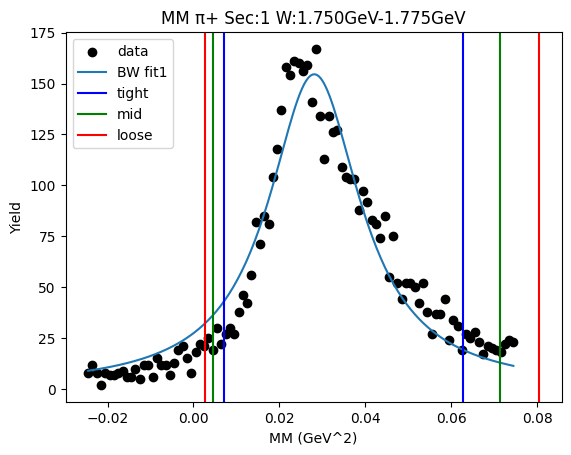

W bin: 15 1.775GeV-1.800GeV
Cut Bounds [[0.00630893 0.00378874 0.00190765]
 [0.06666192 0.07621232 0.08640183]]
Cut Bounds Err [[1.93979250e-06 1.80078352e-06 1.48922448e-06]
 [6.30545187e-06 8.07656998e-06 1.00224217e-05]]


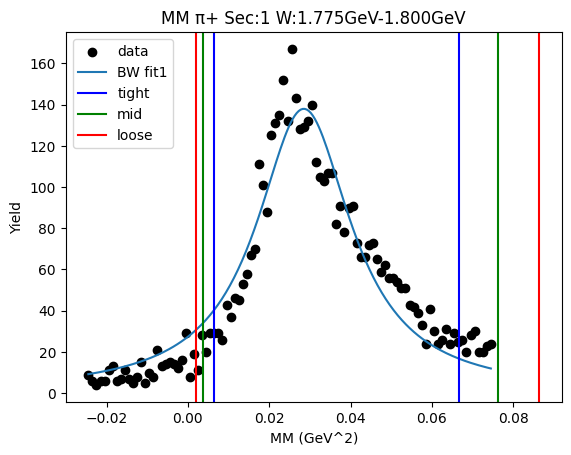

W bin: 16 1.800GeV-1.825GeV
Cut Bounds [[0.00641333 0.00389475 0.00200101]
 [0.06596514 0.07535692 0.08537354]]
Cut Bounds Err [[2.06412072e-06 1.92692947e-06 1.60969750e-06]
 [6.61988422e-06 8.47593245e-06 1.05143343e-05]]


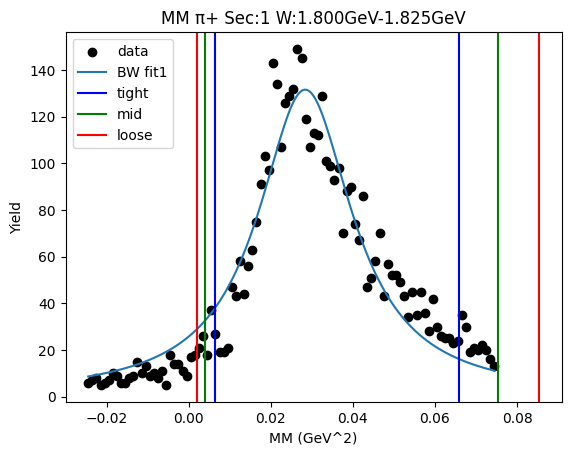

W bin: 17 1.825GeV-1.850GeV
Cut Bounds [[0.00640309 0.00387691 0.00198118]
 [0.06633891 0.07579991 0.08589134]]
Cut Bounds Err [[2.15252197e-06 2.00646104e-06 1.67164907e-06]
 [6.92846614e-06 8.87200878e-06 1.10067149e-05]]


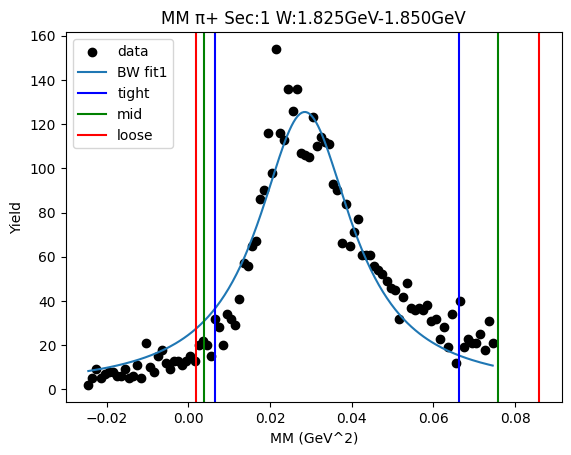

W bin: 18 1.850GeV-1.875GeV
Cut Bounds [[0.00577172 0.00334493 0.00157601]
 [0.06622185 0.07588509 0.08620619]]
Cut Bounds Err [[1.70743170e-06 1.55712664e-06 1.24568369e-06]
 [5.78350872e-06 7.41665978e-06 9.21292641e-06]]


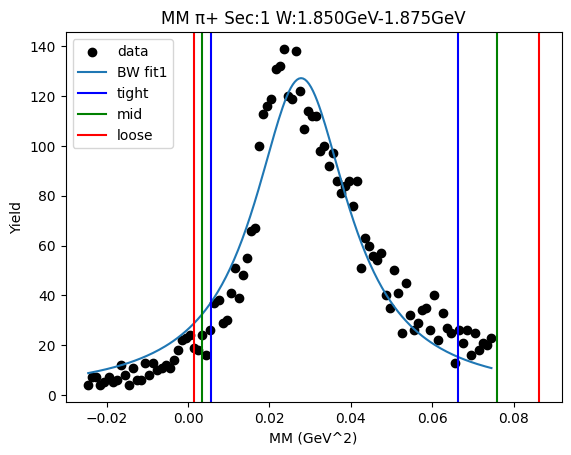

W bin: 19 1.875GeV-1.900GeV
Cut Bounds [[0.00505508 0.00270501 0.00108375]
 [0.0686402  0.07900716 0.09010292]]
Cut Bounds Err [[1.64673278e-06 1.44311690e-06 1.06461106e-06]
 [6.06803885e-06 7.79920194e-06 9.70724143e-06]]


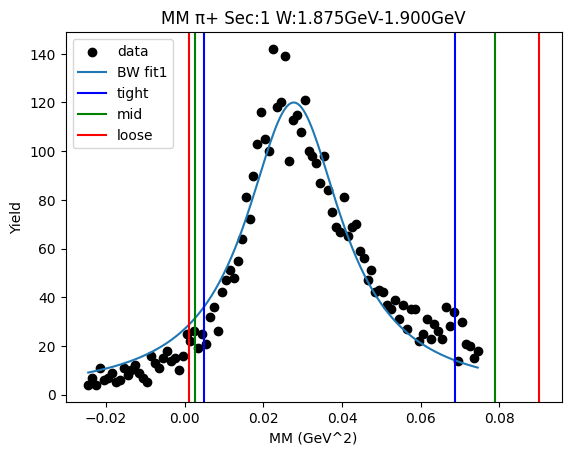

W bin: 20 1.900GeV-1.925GeV
background fit [2.13276718e+01 4.19561162e+01 8.92600715e-01 1.10284971e+01
 5.78827889e-02 9.18763353e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.010905876507965836 0.037230414166256255
Breit-Wigner Peak [11.09243464  0.15513912  0.06623762]
Gaus2 [ 93.17865994 105.10013531   0.39609577]
Gaus3 [3.65502227e+01 4.30131709e-02 1.75753467e-02]
Cut Bounds [[0.00716961 0.0049816  0.00319082]
 [0.05089747 0.05745503 0.06440982]]
Cut Bounds Err [[7.13371207e-06 7.13367636e-06 6.65969715e-06]
 [1.90071001e-05 2.42266311e-05 2.99212299e-05]]


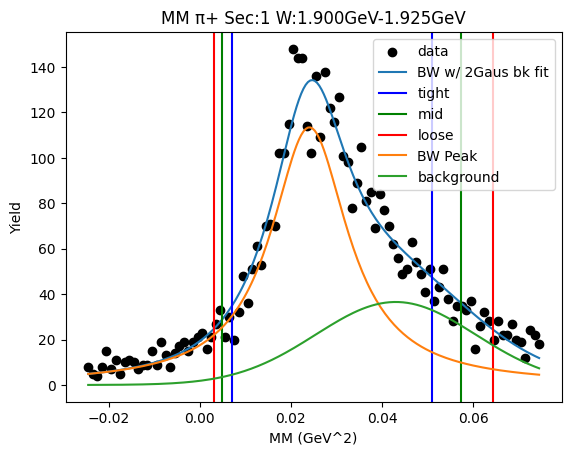

W bin: 21 1.925GeV-1.950GeV
background fit [6.82396299e+01 4.70458159e+02 5.04329523e+01 9.98724172e+00
 6.30947565e-02 1.04523442e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.009520784173927765 0.03973311102987059
Breit-Wigner Peak [11.48745237  0.15692975  0.07096047]
Gaus2 [509.64207661 286.86057982  46.98917509]
Gaus3 [3.05902096e+01 4.36175810e-02 1.89634610e-02]
Cut Bounds [[0.00663246 0.00440125 0.00262594]
 [0.05401888 0.06126495 0.06896693]]
Cut Bounds Err [[3.38215359e-05 3.30613953e-05 2.97933928e-05]
 [9.65225726e-05 1.23350005e-04 1.52685498e-04]]


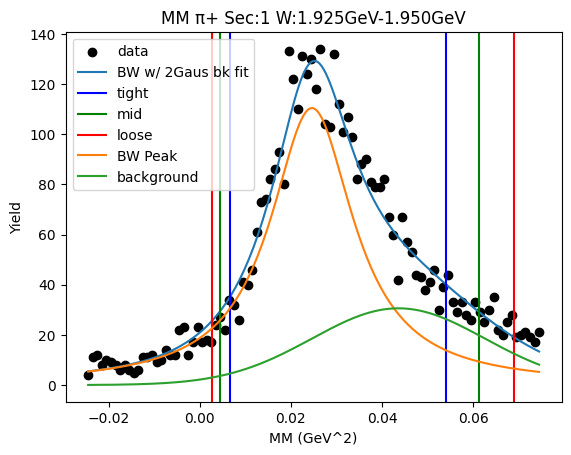

W bin: 22 1.950GeV-1.975GeV
background fit [3.02808652e+02 4.06054016e+02 2.16529519e+01 1.04086276e+01
 5.59050027e-02 8.16390668e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.01246411517338986 0.03706885653033108
Breit-Wigner Peak [10.28851781  0.15737371  0.06403741]
Gaus2 [  2.57896552  81.94623831 162.41372994]
Gaus3 [3.04580014e+01 4.26009913e-02 1.87712730e-02]
Cut Bounds [[0.00796535 0.00571896 0.00384386]
 [0.05084963 0.0571801  0.06388185]]
Cut Bounds Err [[1.80927410e-05 1.83964403e-05 1.75954625e-05]
 [4.57136437e-05 5.81698038e-05 7.17308252e-05]]


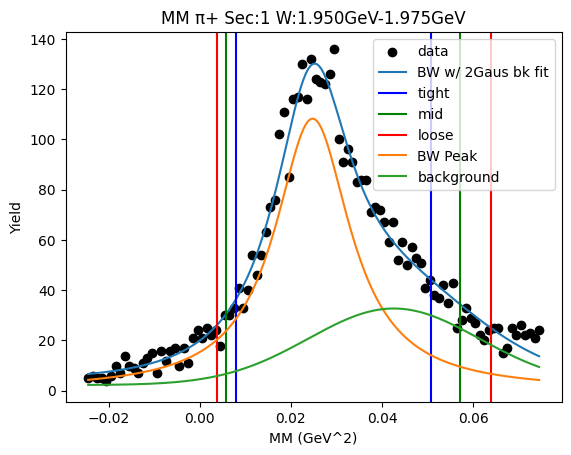

W bin: 23 1.975GeV-2.000GeV
background fit [3.31426803e-01 6.10791264e+02 1.25585364e+02 1.21020538e+01
 5.71575155e-02 9.39315073e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.012847668692152488 0.0345198728093392
Breit-Wigner Peak [9.99443056 0.15389532 0.0601002 ]
Gaus2 [ 604.69953847 1223.90186361  103.88919073]
Gaus3 [3.41879393e+01 4.19069412e-02 1.86676502e-02]
Cut Bounds [[0.00809261 0.00595547 0.00414535]
 [0.04745065 0.05318512 0.05924661]]
Cut Bounds Err [[8.03855434e-06 8.27479325e-06 8.05410432e-06]
 [1.94650136e-05 2.47283043e-05 3.04486766e-05]]


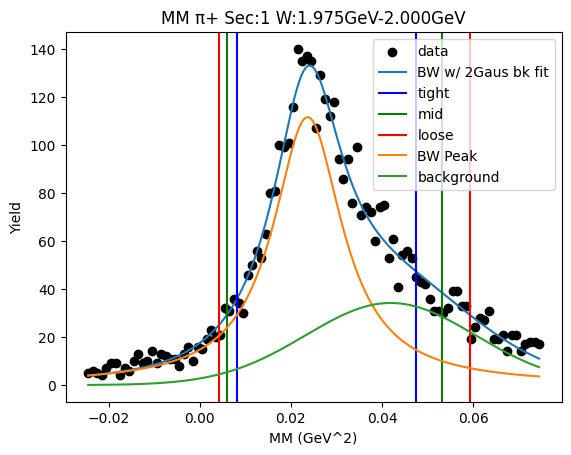

W bin: 24 2.000GeV-2.025GeV
background fit [3.51891875e+02 7.20444666e+02 1.23929694e+02 9.36128515e+00
 6.06183651e-02 9.98563136e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.008782169145066604 0.03903864609129715
Breit-Wigner Peak [10.03977153  0.15462991  0.0710123 ]
Gaus2 [ 484.76280992 1365.92090512   88.60444843]
Gaus3 [3.10654030e+01 4.22984522e-02 1.86007873e-02]
Cut Bounds [[0.00625442 0.00409292 0.00238798]
 [0.05298048 0.06016419 0.06780446]]
Cut Bounds Err [[8.09117332e-06 7.85334854e-06 6.99783101e-06]
 [2.35491830e-05 3.01097701e-05 3.72887389e-05]]


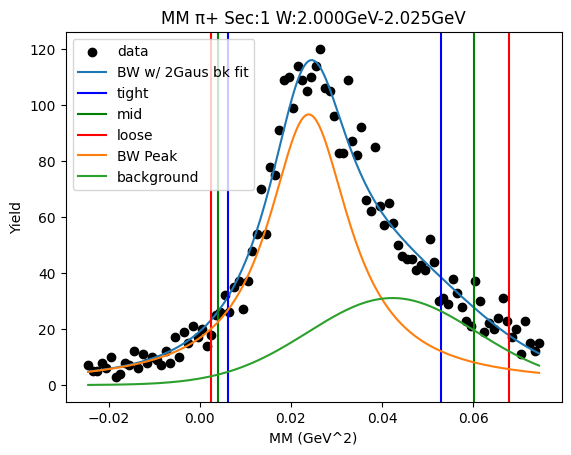

W bin: 25 2.025GeV-2.050GeV
background fit [3.65719398e+02 2.89666091e+03 3.32055762e+02 1.15361063e+01
 6.02118795e-02 7.12905718e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.008907742041942925 0.04172148971725587
Breit-Wigner Peak [11.25088342  0.15910568  0.0739524 ]
Gaus2 [2434.38984666 3062.49446981  333.65219386]
Gaus3 [19.69675308  0.05164902  0.02013234]
Cut Bounds [[0.00646945 0.00418588 0.00239745]
 [0.05653859 0.06426884 0.07249424]]
Cut Bounds Err [[2.46902956e-06 2.38075901e-06 2.10073551e-06]
 [7.29902770e-06 9.32872843e-06 1.15517569e-05]]


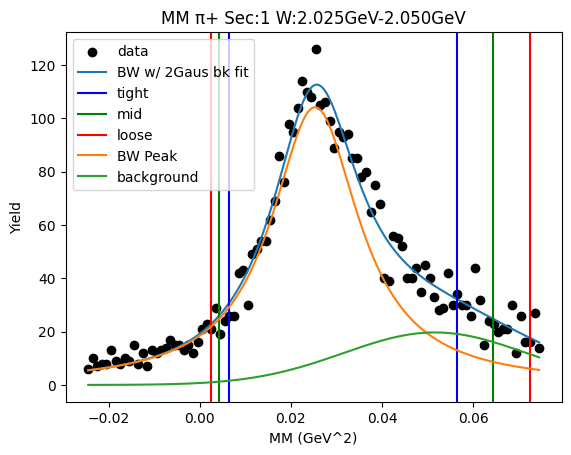

W bin: 26 2.050GeV-2.075GeV
background fit [2.43438944e+03 7.15587132e+02 1.05852434e+02 1.45052463e+01
 7.71279899e-02 1.52216037e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.009089238276707347 0.04041923262550581
Breit-Wigner Peak [10.09562314  0.15733479  0.07226109]
Gaus2 [1831.15253945 1432.81889156   79.54373513]
Gaus3 [2.16801455e+01 4.75180545e-02 2.10713447e-02]
Cut Bounds [[0.00647402 0.00423626 0.00247127]
 [0.05485352 0.06229167 0.07020258]]
Cut Bounds Err [[1.12683814e-05 1.09376063e-05 9.74591744e-06]
 [3.28002271e-05 4.19416785e-05 5.19444391e-05]]


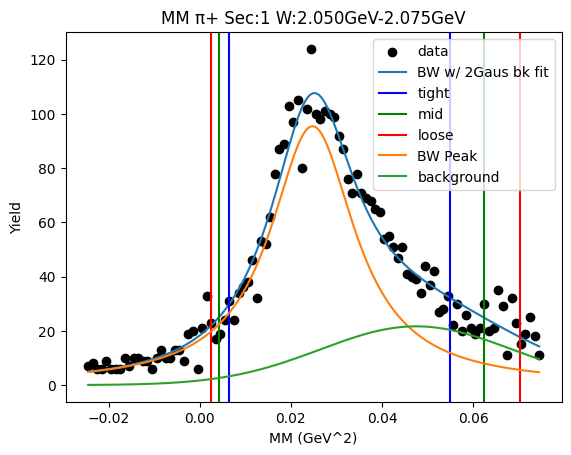

W bin: 27 2.075GeV-2.100GeV
background fit [1.83115254e+03 6.84975316e+02 2.87523410e+01 9.19074630e+00
 6.22192205e-02 1.12561080e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.010157278419290181 0.03717404272938578
Breit-Wigner Peak [8.93477159 0.15383647 0.06710286]
Gaus2 [3254.04909947 1104.73543652   55.79003289]
Gaus3 [2.66209802e+01 4.45527048e-02 2.15195840e-02]
Cut Bounds [[0.00679808 0.00464759 0.00290478]
 [0.05072517 0.05736011 0.06440272]]
Cut Bounds Err [[1.45843269e-05 1.44703057e-05 1.33462985e-05]
 [3.98386970e-05 5.08356884e-05 6.28428780e-05]]


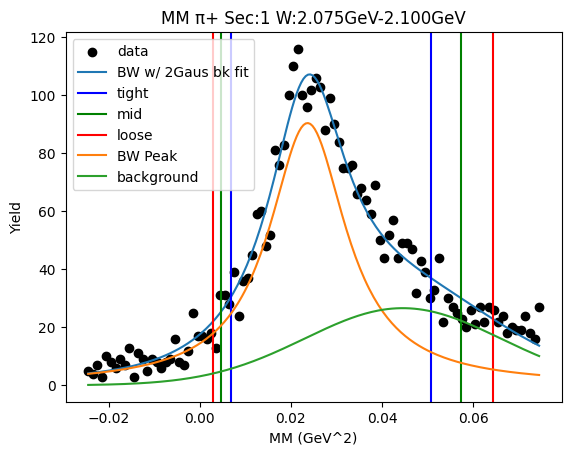

W bin: 28 2.100GeV-2.125GeV
background fit [2.53848485e+03 2.51112468e+03 3.19445811e+02 1.04787971e+01
 6.12981549e-02 8.58568652e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.01209072107372017 0.034381209803876885
Breit-Wigner Peak [7.42251527 0.15243348 0.06095147]
Gaus2 [8361.87313767 4958.513941    590.95683264]
Gaus3 [3.14868371e+01 3.97128327e-02 2.30783111e-02]
Cut Bounds [[0.00767227 0.00556861 0.0038013 ]
 [0.04720863 0.05301224 0.0591522 ]]
Cut Bounds Err [[1.31385080e-05 1.34309254e-05 1.29457116e-05]
 [3.25907847e-05 4.14400957e-05 5.10675743e-05]]


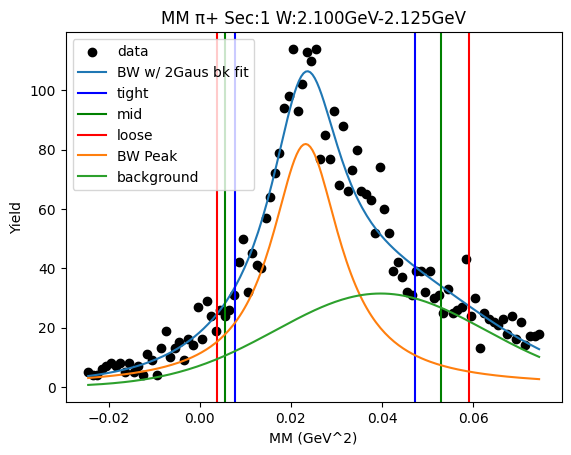

Value Error1.1
	Just skip it for now


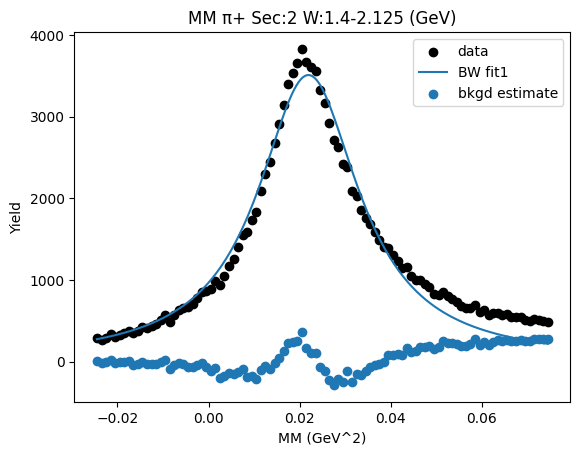

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.00556021 0.00364194 0.00212799]
 [0.04698056 0.05334636 0.06011648]]
Cut Bounds Err [[1.64849076e-06 1.59797931e-06 1.42345011e-06]
 [4.79181386e-06 6.11585223e-06 7.56578043e-06]]


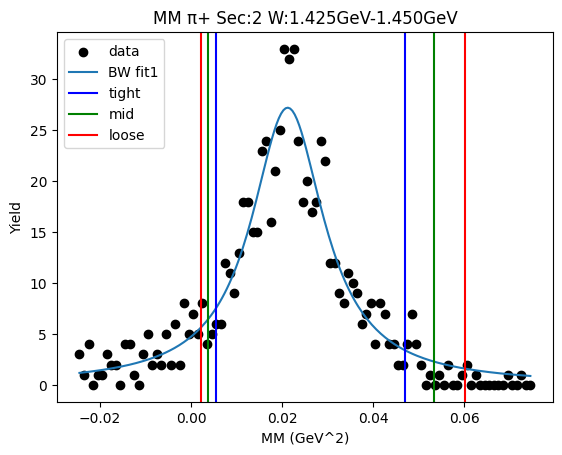

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.003799   0.00205277 0.00083978]
 [0.0505898  0.05820173 0.0663469 ]]
Cut Bounds Err [[1.41698252e-06 1.24765582e-06 9.29989887e-07]
 [5.17084309e-06 6.64344142e-06 8.26622067e-06]]


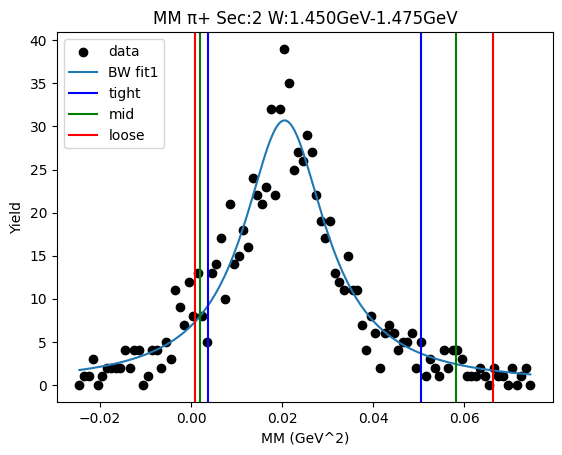

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.00499399 0.0031304  0.00170005]
 [0.04745887 0.05408824 0.06115088]]
Cut Bounds Err [[9.13061050e-07 8.65857387e-07 7.43591936e-07]
 [2.81471603e-06 3.59913525e-06 4.45969057e-06]]


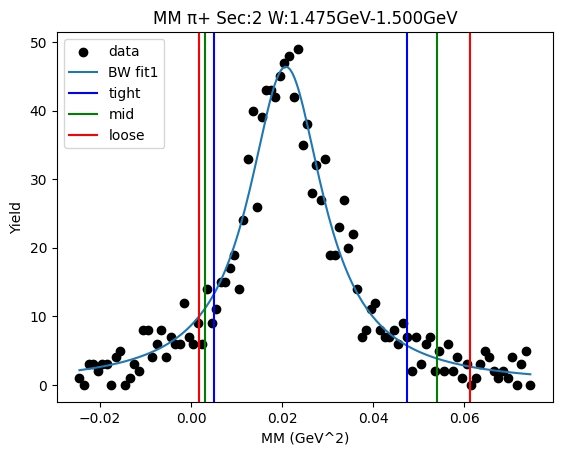

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.00588409 0.00393592 0.00237812]
 [0.04683623 0.05307849 0.05971112]]
Cut Bounds Err [[1.08557184e-06 1.06341422e-06 9.63267434e-07]
 [3.06273887e-06 3.90515825e-06 4.82677758e-06]]


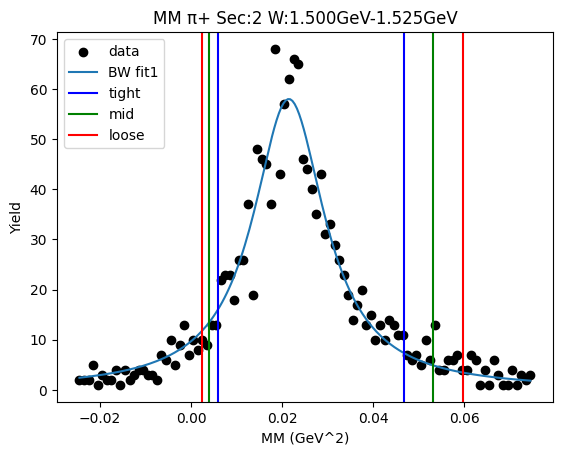

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.00616552 0.00420787 0.00262301]
 [0.04624575 0.05230415 0.05873534]]
Cut Bounds Err [[1.25031981e-06 1.23715291e-06 1.13825639e-06]
 [3.42430273e-06 4.36174575e-06 5.38628987e-06]]


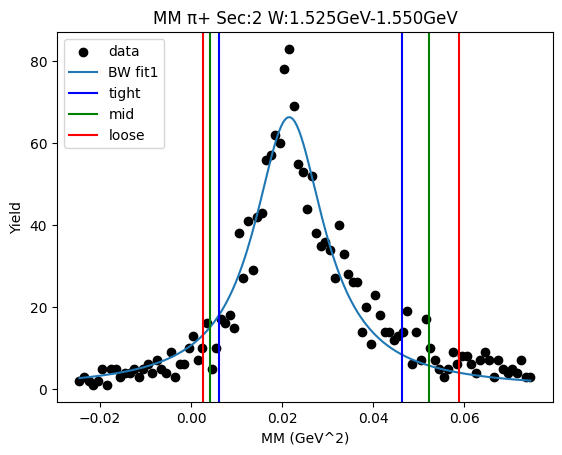

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.00615347 0.00419346 0.00260813]
 [0.04636071 0.05244215 0.05889826]]
Cut Bounds Err [[1.02002284e-06 1.00853886e-06 9.26869477e-07]
 [2.79978541e-06 3.56653473e-06 4.40458951e-06]]


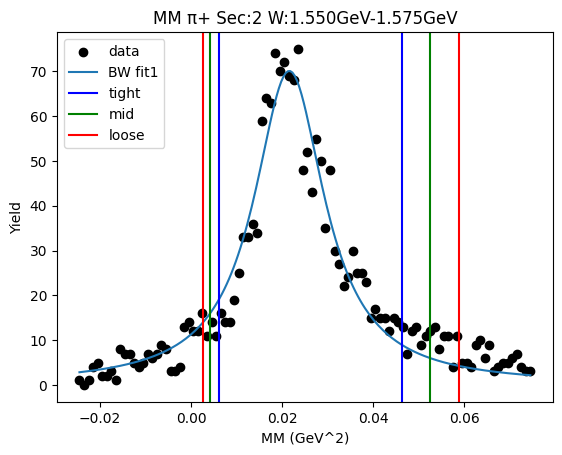

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.00502308 0.0030723  0.00159863]
 [0.05077264 0.05797176 0.06564801]]
Cut Bounds Err [[1.39999144e-06 1.31145557e-06 1.10245148e-06]
 [4.45097456e-06 5.69679187e-06 7.06474082e-06]]


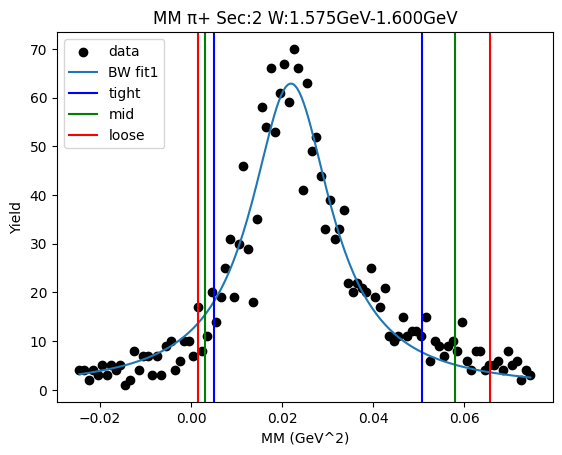

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.00573774 0.00380418 0.00226655]
 [0.04684886 0.05313753 0.05982212]]
Cut Bounds Err [[1.00114720e-06 9.76382324e-07 8.78258875e-07]
 [2.86073096e-06 3.64913446e-06 4.51202191e-06]]


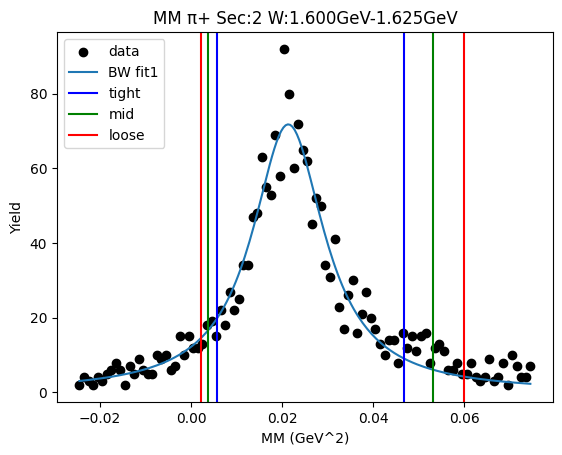

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.00570362 0.0037741  0.00224156]
 [0.04683267 0.05312895 0.05982222]]
Cut Bounds Err [[1.20730953e-06 1.17628331e-06 1.05640733e-06]
 [3.45953435e-06 4.41337451e-06 5.45742394e-06]]


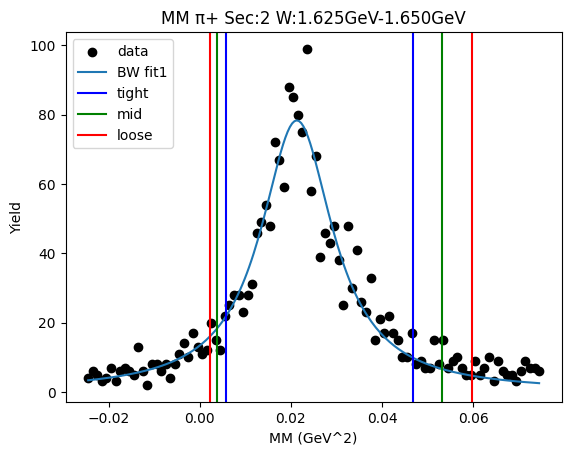

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.00585278 0.00387831 0.00230868]
 [0.04786349 0.05429116 0.06112367]]
Cut Bounds Err [[8.29275293e-07 8.08542525e-07 7.26968726e-07]
 [2.37148210e-06 3.02514502e-06 3.74057913e-06]]


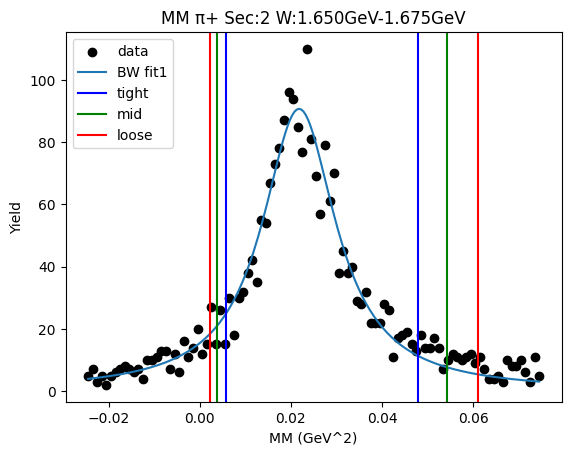

W bin: 11 1.675GeV-1.700GeV
Cut Bounds [[0.00479313 0.00291859 0.00150664]
 [0.04898136 0.05594447 0.06337017]]
Cut Bounds Err [[5.45369565e-07 5.09736407e-07 4.26800722e-07]
 [1.74339833e-06 2.23171013e-06 2.76797823e-06]]


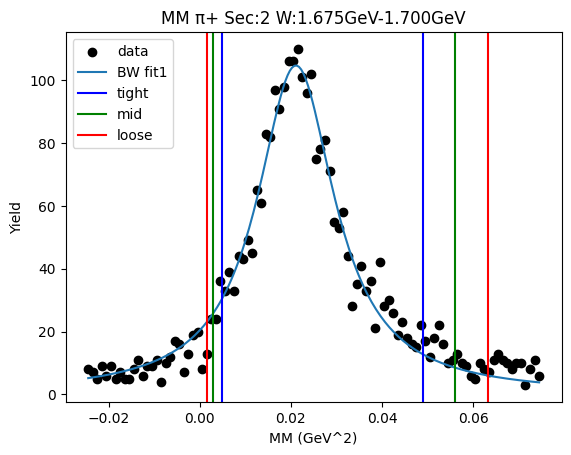

W bin: 12 1.700GeV-1.725GeV
Cut Bounds [[0.0052418  0.00332077 0.00183628]
 [0.04846264 0.05518578 0.06234546]]
Cut Bounds Err [[5.09811580e-07 4.86026785e-07 4.21180440e-07]
 [1.55014705e-06 1.98131987e-06 2.45414727e-06]]


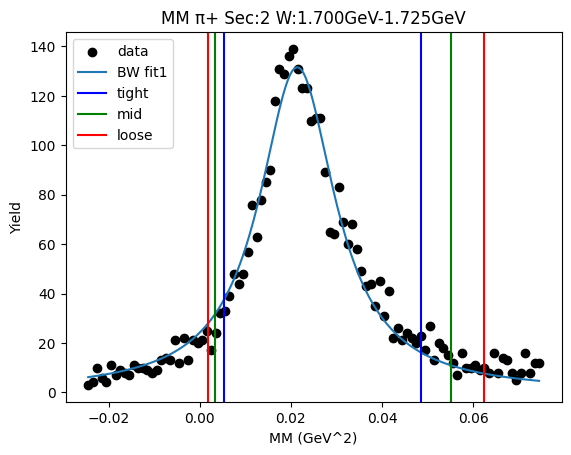

W bin: 13 1.725GeV-1.750GeV
Cut Bounds [[0.00549159 0.00351366 0.00197554]
 [0.04946004 0.05627581 0.06353138]]
Cut Bounds Err [[6.74824449e-07 6.46538702e-07 5.64956955e-07]
 [2.02520556e-06 2.58747033e-06 3.20380749e-06]]


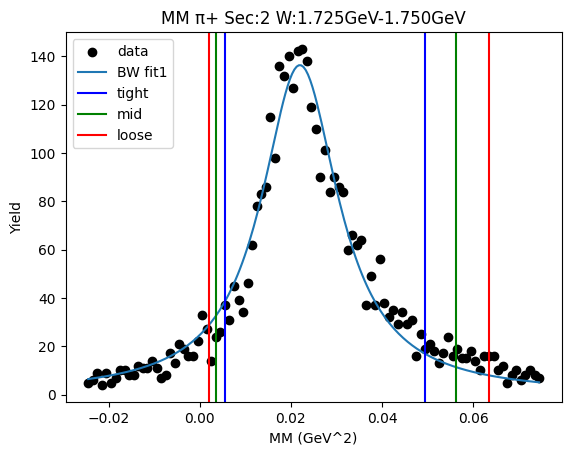

W bin: 14 1.750GeV-1.775GeV
Cut Bounds [[0.00450094 0.0025695  0.00117591]
 [0.05339661 0.0612443  0.06962984]]
Cut Bounds Err [[8.09252337e-07 7.32409375e-07 5.77414956e-07]
 [2.78733385e-06 3.57570819e-06 4.44323721e-06]]


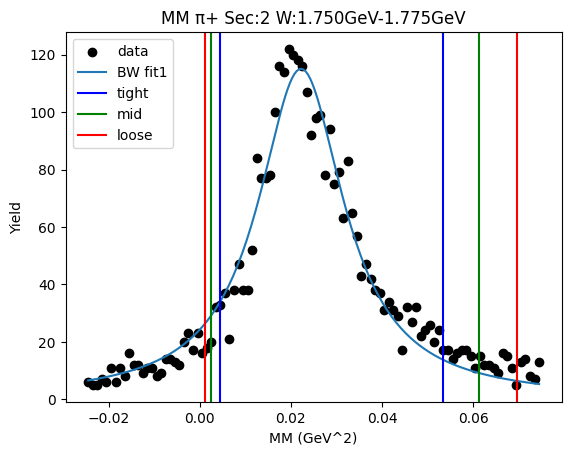

W bin: 15 1.775GeV-1.800GeV
Cut Bounds [[0.00408974 0.0021992  0.00089044]
 [0.05499294 0.06328303 0.07215491]]
Cut Bounds Err [[1.04915457e-06 9.21577652e-07 6.83408137e-07]
 [3.84720062e-06 4.94359648e-06 6.15193183e-06]]


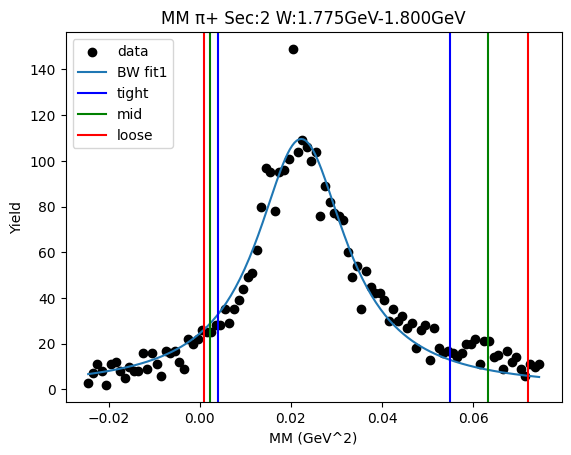

W bin: 16 1.800GeV-1.825GeV
Cut Bounds [[0.00448071 0.00255913 0.00117221]
 [0.05310313 0.06090603 0.06924359]]
Cut Bounds Err [[7.55970283e-07 6.84342256e-07 5.39761246e-07]
 [2.60250306e-06 3.33854732e-06 4.14848239e-06]]


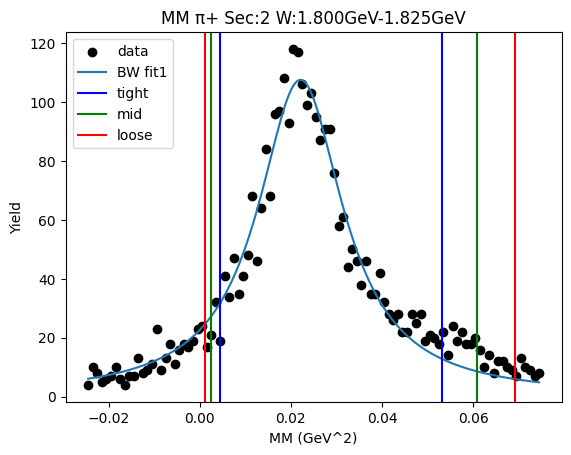

W bin: 17 1.825GeV-1.850GeV
Cut Bounds [[0.00371003 0.0018813  0.0006676 ]
 [0.05582376 0.06441777 0.07362681]]
Cut Bounds Err [[9.44863189e-07 8.05982330e-07 5.59549182e-07]
 [3.66513102e-06 4.71627218e-06 5.87622068e-06]]


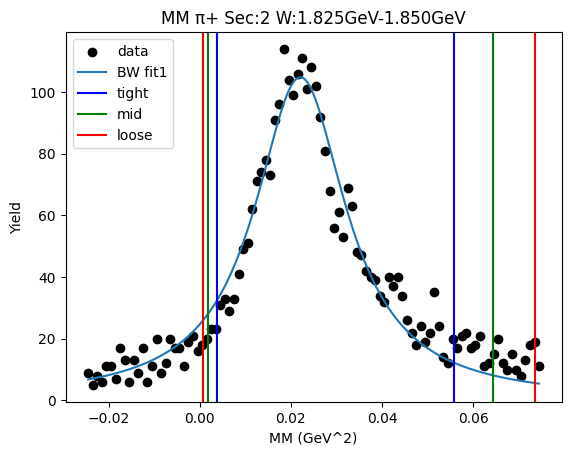

W bin: 18 1.850GeV-1.875GeV
Cut Bounds [[0.00394874 0.00208378 0.00080984]
 [0.05510536 0.06347171 0.07242911]]
Cut Bounds Err [[9.50178914e-07 8.26821305e-07 6.00713666e-07]
 [3.54954644e-06 4.56327074e-06 5.68097941e-06]]


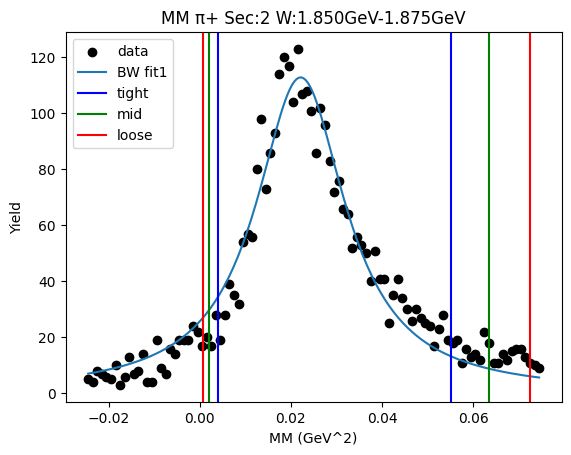

W bin: 19 1.875GeV-1.900GeV
Cut Bounds [[0.00368289 0.00186524 0.00065998]
 [0.05554065 0.06409455 0.07326084]]
Cut Bounds Err [[1.03689285e-06 8.83939144e-07 6.12778814e-07]
 [4.02665884e-06 5.18161575e-06 6.45615914e-06]]


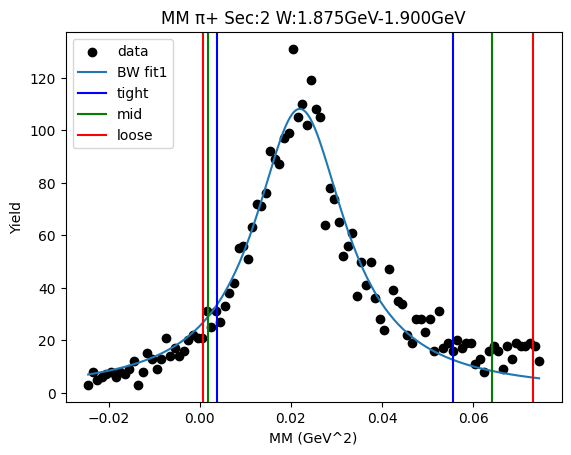

W bin: 20 1.900GeV-1.925GeV
background fit [15.59422271  4.52871287  0.39843365 14.89726238  0.08455197  0.02067241]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.00925048127656465 0.0334815031671476
Breit-Wigner Peak [10.65810958  0.14617111  0.06354922]
Gaus2 [11.31890369 26.45046414  0.61661568]
Gaus3 [11.15739673  0.05631949  0.04573474]
Cut Bounds [[0.00617255 0.00423078 0.00265465]
 [0.04570046 0.05166428 0.05799373]]
Cut Bounds Err [[1.59753499e-06 1.58674827e-06 1.46617992e-06]
 [4.34688863e-06 5.54489134e-06 6.85289217e-06]]


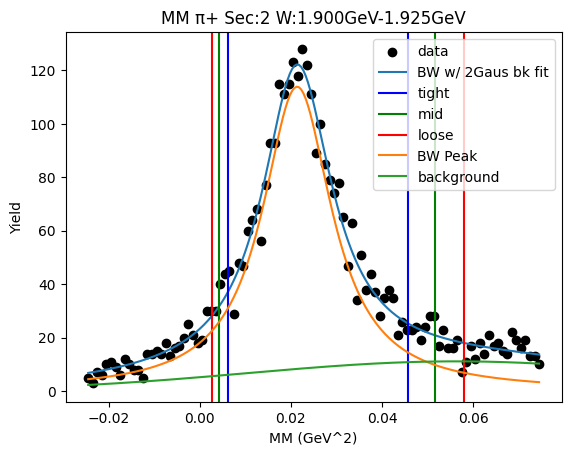

W bin: 21 1.925GeV-1.950GeV
background fit [11.17330061 14.52728529  2.01363752  7.4981534   0.06540086  0.01618762]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.008140009293943807 0.03421150710491627
Breit-Wigner Peak [10.88536533  0.14551893  0.06591851]
Gaus2 [5.58539861 7.92561719 4.99808693]
Gaus3 [9.99223818 0.04873135 0.02457856]
Cut Bounds [[0.00568408 0.00376599 0.00224131]
 [0.04650277 0.05274841 0.05938746]]
Cut Bounds Err [[9.92040662e-06 9.68974696e-06 8.72098975e-06]
 [2.83751831e-05 3.62641648e-05 4.48913475e-05]]


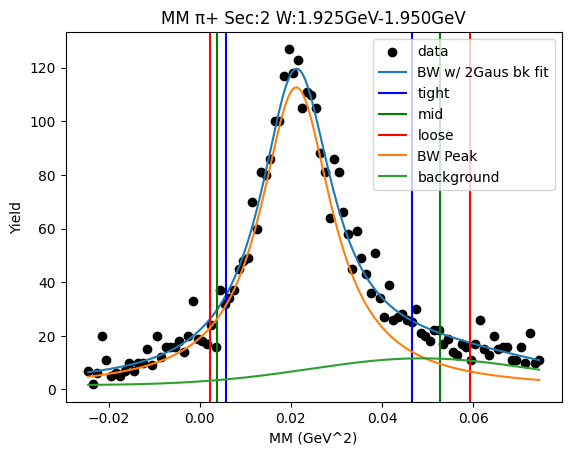

W bin: 22 1.950GeV-1.975GeV
background fit [4.68653123e+00 1.72244192e+01 2.05578478e+00 7.04868176e+00
 6.10391594e-02 1.16304034e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0016386558605050068 0.04045501732112415
Breit-Wigner Peak [11.36765159  0.14507528  0.08043254]
Gaus2 [15.04836638 34.21413077  0.87857953]
Gaus3 [10.31478395  0.05098228  0.0229386 ]
Cut Bounds [[0.00354129 0.00179737 0.00063919]
 [0.05319565 0.0613826  0.07015528]]
Cut Bounds Err [[6.87661600e-06 5.87790675e-06 4.08903500e-06]
 [2.66521354e-05 3.43499555e-05 4.28387998e-05]]


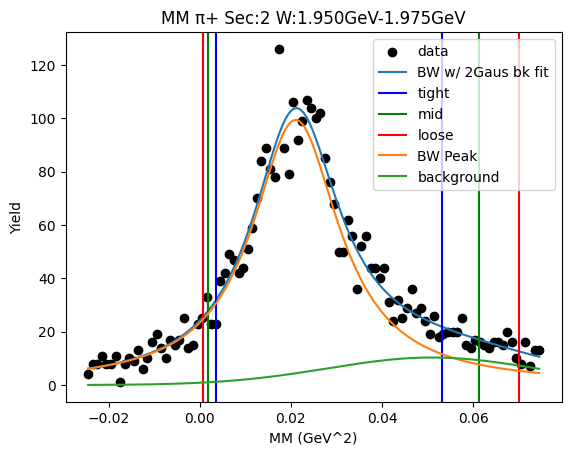

W bin: 23 1.975GeV-2.000GeV
background fit [1.21173114e+01 1.52021658e+02 1.94190472e+01 6.71346905e+00
 5.70933903e-02 7.93977299e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0034726607297216223 0.04017724079484633
Breit-Wigner Peak [11.80389933  0.1477327   0.078214  ]
Gaus2 [362.3723768  351.06685164  49.31699604]
Gaus3 [8.55910525 0.05811259 0.02674609]
Cut Bounds [[0.00416365 0.00229298 0.00097617]
 [0.05333286 0.06129604 0.06981307]]
Cut Bounds Err [[9.52322533e-06 8.48041568e-06 6.45536330e-06]
 [3.40835349e-05 4.38463542e-05 5.45915905e-05]]


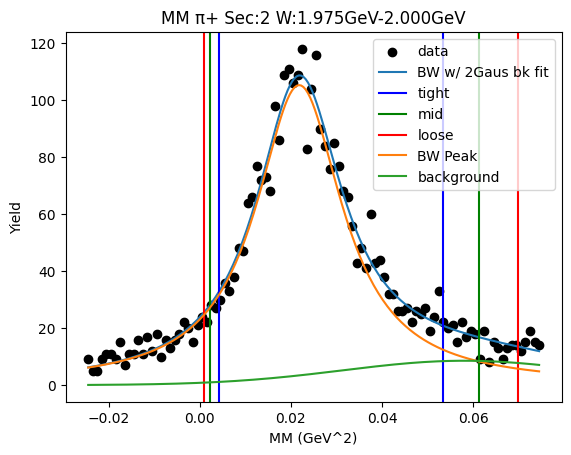

W bin: 24 2.000GeV-2.025GeV
background fit [3.59939625e+02 8.09272790e+02 5.59969310e+01 6.98768024e+00
 6.37927497e-02 1.27325301e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.005613183317436519 0.037298856288637466
Breit-Wigner Peak [9.77813951 0.14647873 0.07267011]
Gaus2 [977.52842049 310.73846505  33.12112193]
Gaus3 [11.96795659  0.04512341  0.03384584]
Cut Bounds [[0.0047845  0.00288459 0.00146281]
 [0.05008079 0.05724013 0.0648776 ]]
Cut Bounds Err [[3.77028425e-06 3.51253439e-06 2.91798837e-06]
 [1.21980733e-05 1.56469200e-05 1.94328970e-05]]


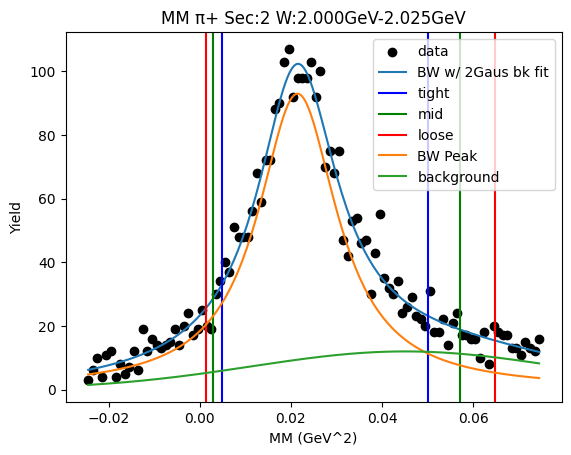

W bin: 25 2.025GeV-2.050GeV
background fit [6.41729943e+02 5.72376508e+02 6.23897660e+01 8.31855649e+00
 6.93965727e-02 1.92971235e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.006130288171730969 0.034677159617849736
Breit-Wigner Peak [8.69729048 0.1428416  0.06897689]
Gaus2 [3.67036749e+03 7.45118917e+03 2.36366150e-01]
Gaus3 [15.9068825   0.04127238  0.02871294]
Cut Bounds [[0.00482496 0.00300151 0.00160882]
 [0.04675164 0.05331352 0.06030617]]
Cut Bounds Err [[6.33000027e-06 5.99040264e-06 5.11629294e-06]
 [1.97040416e-05 2.52467311e-05 3.13244150e-05]]


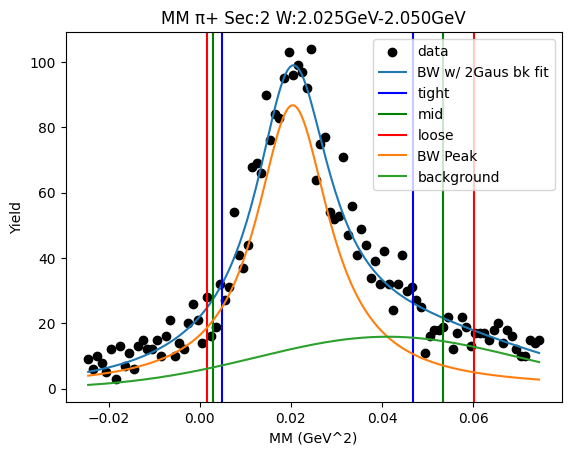

W bin: 26 2.050GeV-2.075GeV
background fit [3.19675514e+03 1.32882100e+04 2.20428219e+03 5.82883577e+00
 5.92957708e-02 9.39930273e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.0022546799104458566 0.04477813020048026
Breit-Wigner Peak [10.31581586  0.14581401  0.08853701]
Gaus2 [297523.04394566 121887.24965108    604.48405055]
Gaus3 [8.20209801 0.0566407  0.02364497]
Cut Bounds [[0.00266521 0.00107506 0.00019461]
 [0.05760111 0.06699813 0.07710487]]
Cut Bounds Err [[2.47457882e-06 1.88344953e-06 9.34161711e-07]
 [1.15040495e-05 1.48685924e-05 1.85941748e-05]]


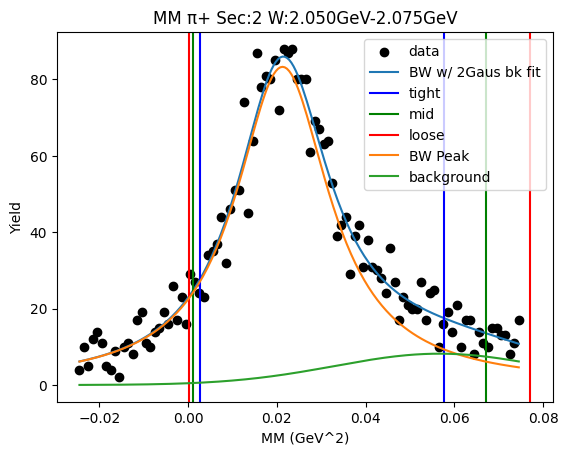

W bin: 27 2.075GeV-2.100GeV
background fit [2.97523044e+05 4.72808708e+05 4.85695985e+04 5.81683394e+00
 6.01918055e-02 9.71065731e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.0026565671531001006 0.043821798699037066
Breit-Wigner Peak [9.96846175 0.14346643 0.0880136 ]
Gaus2 [506503.93677408 615982.93448803  46814.36538111]
Gaus3 [8.45632948 0.05546535 0.02234   ]
Cut Bounds [[0.00248352 0.00096775 0.00015332]
 [0.05621542 0.06544603 0.07537799]]
Cut Bounds Err [[1.21744554e-06 9.09405082e-07 4.21586402e-07]
 [5.79219790e-06 7.47856132e-06 9.34773113e-06]]


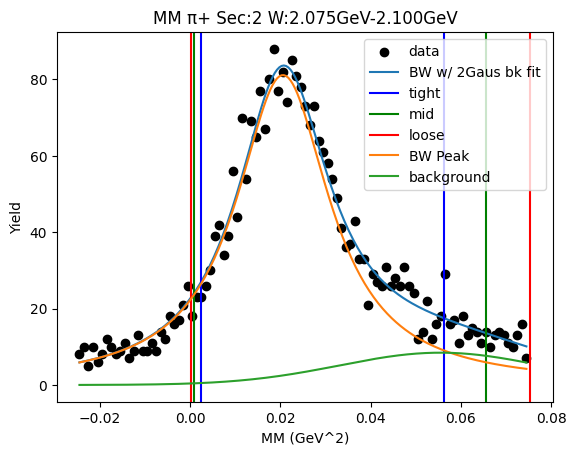

W bin: 28 2.100GeV-2.125GeV
background fit [5.06503937e+05 6.15459844e+05 2.61364338e+04 7.63776397e+00
 5.76012806e-02 8.40338687e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.010117975317859058 0.028895134355077838
Breit-Wigner Peak [4.72450524 0.13966587 0.05594217]
Gaus2 [4143383.43476228 1365694.28960724    7878.47341488]
Gaus3 [26.50416367  0.03131503  0.02710416]
Cut Bounds [[0.00642449 0.00465811 0.00317507]
 [0.0396722  0.04455536 0.04972186]]
Cut Bounds Err [[6.46901730e-06 6.60890019e-06 6.36505309e-06]
 [1.60754119e-05 2.04396949e-05 2.51883205e-05]]


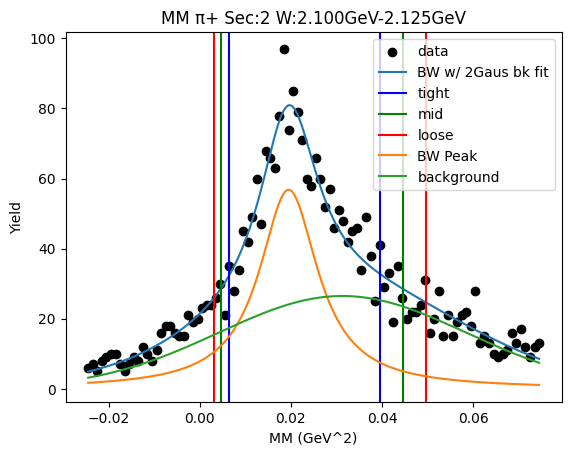

Value Error1.1
	Just skip it for now


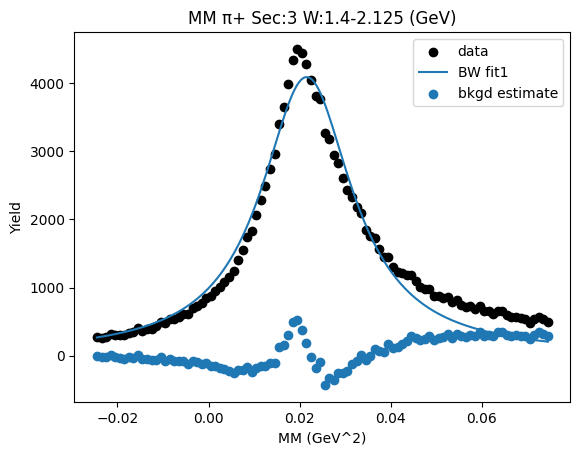

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.00759205 0.00580946 0.00426504]
 [0.03851714 0.04291957 0.04756017]]
Cut Bounds Err [[6.70639793e-07 7.02589905e-07 7.01493906e-07]
 [1.51055595e-06 1.90968465e-06 2.34252389e-06]]


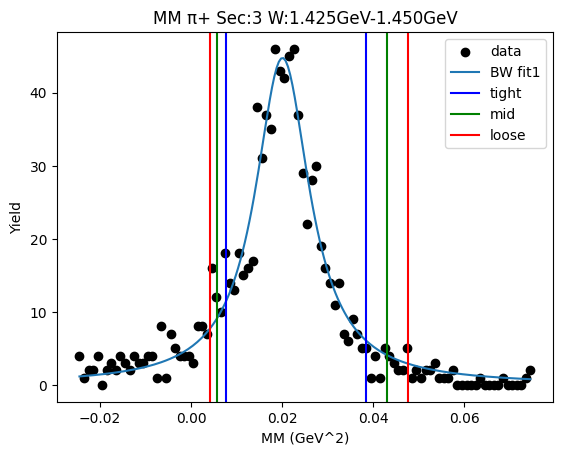

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.00776594 0.00607009 0.00458288]
 [0.03619988 0.04019081 0.04439039]]
Cut Bounds Err [[7.40938872e-07 7.84513726e-07 7.94322173e-07]
 [1.59970106e-06 2.01867487e-06 2.47213340e-06]]


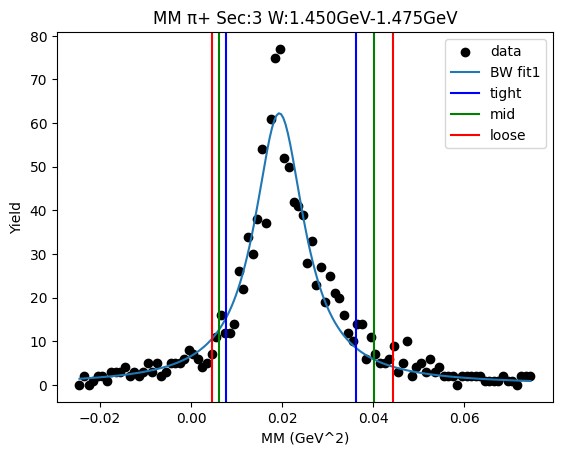

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.00773936 0.00594398 0.00438519]
 [0.03870584 0.04310375 0.04773826]]
Cut Bounds Err [[4.55431007e-07 4.78004978e-07 4.78427490e-07]
 [1.01849342e-06 1.28721551e-06 1.57853827e-06]]


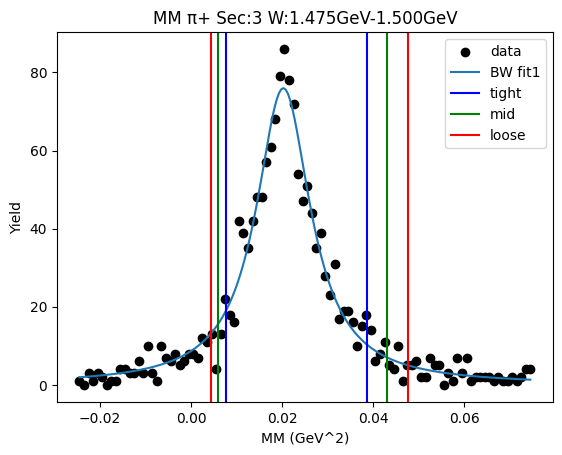

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.007802   0.00599284 0.00442198]
 [0.03899983 0.04343024 0.04809894]]
Cut Bounds Err [[5.52981448e-07 5.80427658e-07 5.80989618e-07]
 [1.23634282e-06 1.56252776e-06 1.91614205e-06]]


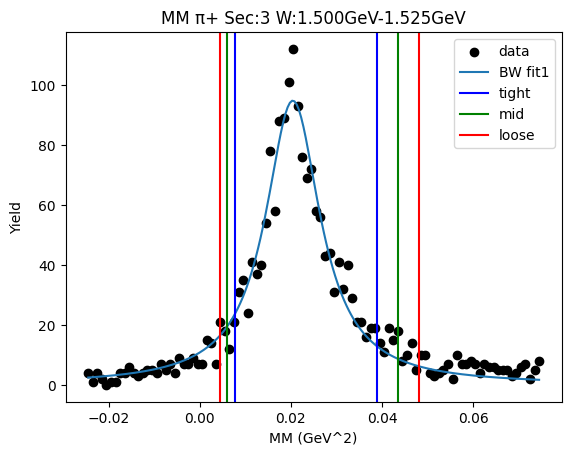

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.00788442 0.00605966 0.00447472]
 [0.03932244 0.04378528 0.04848795]]
Cut Bounds Err [[6.72249887e-07 7.05820511e-07 7.06775753e-07]
 [1.50129482e-06 1.89729211e-06 2.32656672e-06]]


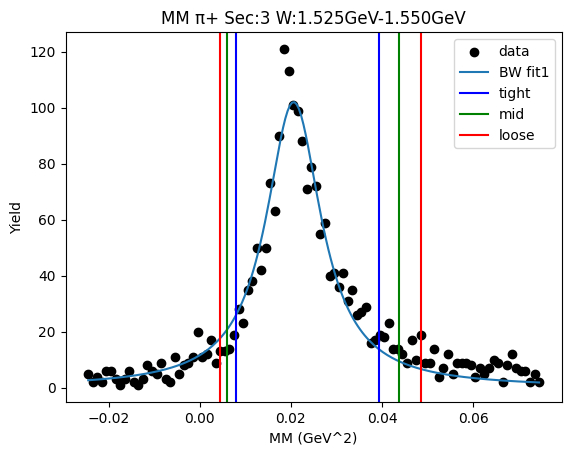

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.00694425 0.00503916 0.00343888]
 [0.04275933 0.04801726 0.05357999]]
Cut Bounds Err [[7.00319812e-07 7.14500454e-07 6.87811486e-07]
 [1.73779764e-06 2.20557616e-06 2.71495371e-06]]


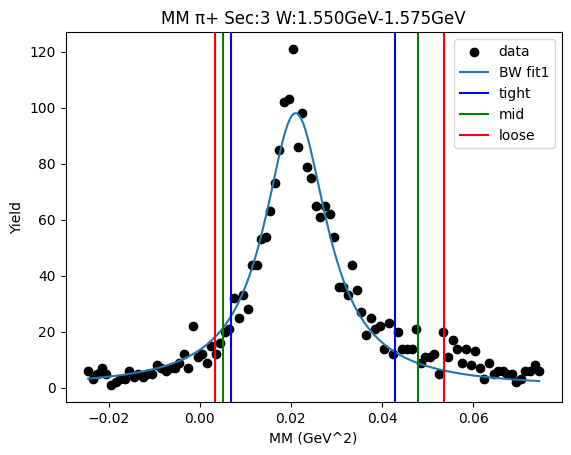

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.00676123 0.00488418 0.00331167]
 [0.04228144 0.04750844 0.05303997]]
Cut Bounds Err [[8.06237398e-07 8.20702203e-07 7.87501118e-07]
 [2.01615972e-06 2.55961720e-06 3.15158496e-06]]


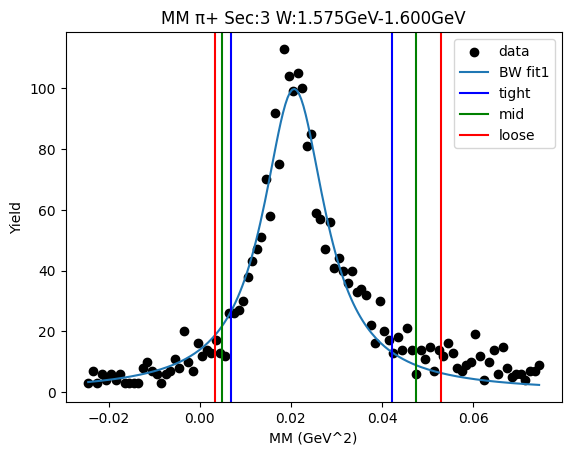

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.00665593 0.00477327 0.00320286]
 [0.04265648 0.04797392 0.05360362]]
Cut Bounds Err [[6.96648421e-07 7.06575506e-07 6.74463214e-07]
 [1.76360658e-06 2.24002716e-06 2.75922159e-06]]


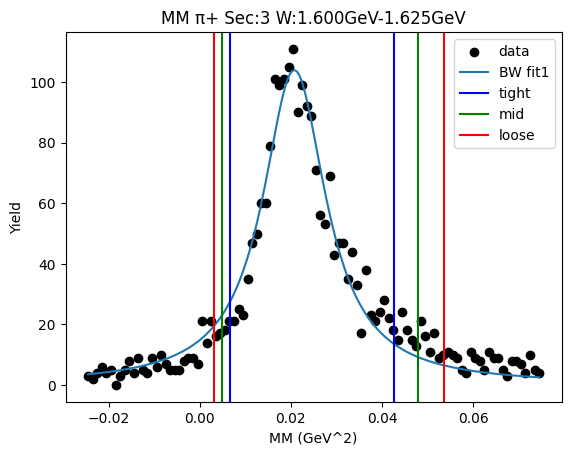

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.00603867 0.00414638 0.00260875]
 [0.04446773 0.05026125 0.05640943]]
Cut Bounds Err [[6.93176018e-07 6.87953555e-07 6.35895418e-07]
 [1.88102841e-06 2.39519672e-06 2.95695994e-06]]


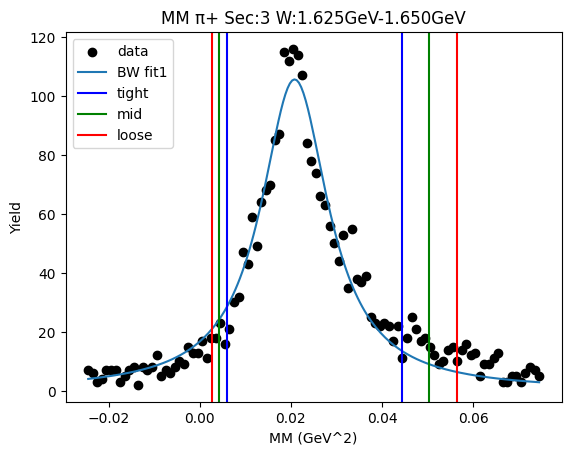

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.00535864 0.00353417 0.00208804]
 [0.0444117  0.05039784 0.05676232]]
Cut Bounds Err [[6.13857214e-07 5.97092453e-07 5.34830203e-07]
 [1.76721264e-06 2.25477722e-06 2.78853662e-06]]


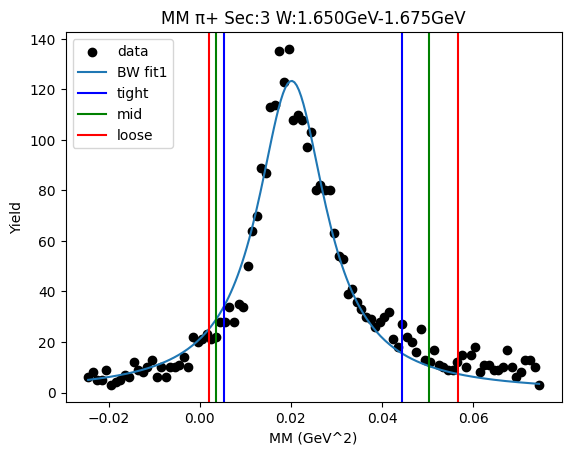

W bin: 11 1.675GeV-1.700GeV
Cut Bounds [[0.00599166 0.0041709  0.00267901]
 [0.04228739 0.04772577 0.05349303]]
Cut Bounds Err [[5.20387931e-07 5.20012938e-07 4.85655318e-07]
 [1.38248037e-06 1.75903982e-06 2.17014715e-06]]


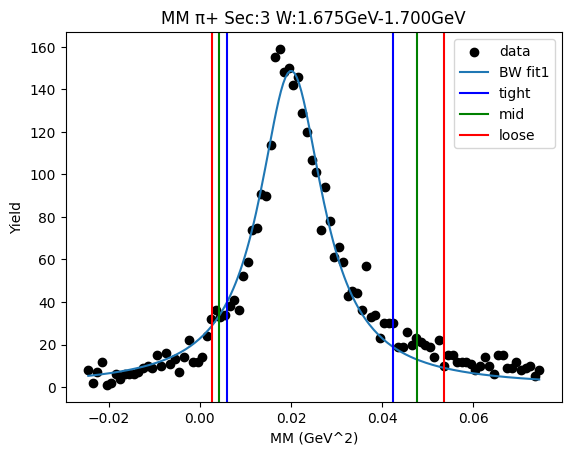

W bin: 12 1.700GeV-1.725GeV
Cut Bounds [[0.00638488 0.00451584 0.00296966]
 [0.0428323  0.04825275 0.05399606]]
Cut Bounds Err [[4.15163407e-07 4.18173128e-07 3.95166889e-07]
 [1.07529717e-06 1.36693501e-06 1.68503241e-06]]


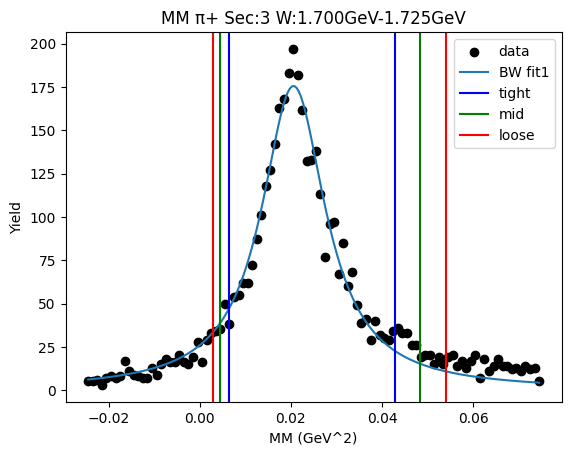

W bin: 13 1.725GeV-1.750GeV
Cut Bounds [[0.00624866 0.00429622 0.00270844]
 [0.04582922 0.05179289 0.05812122]]
Cut Bounds Err [[4.25458415e-07 4.22533327e-07 3.90952105e-07]
 [1.15221863e-06 1.46707666e-06 1.81105479e-06]]


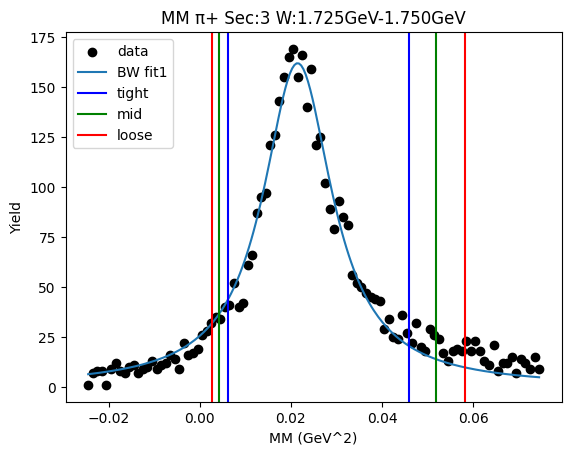

W bin: 14 1.750GeV-1.775GeV
Cut Bounds [[0.0059733  0.00402469 0.00245954]
 [0.04654974 0.05271642 0.05926656]]
Cut Bounds Err [[5.64619945e-07 5.55103508e-07 5.05689765e-07]
 [1.57618678e-06 2.00900333e-06 2.48234332e-06]]


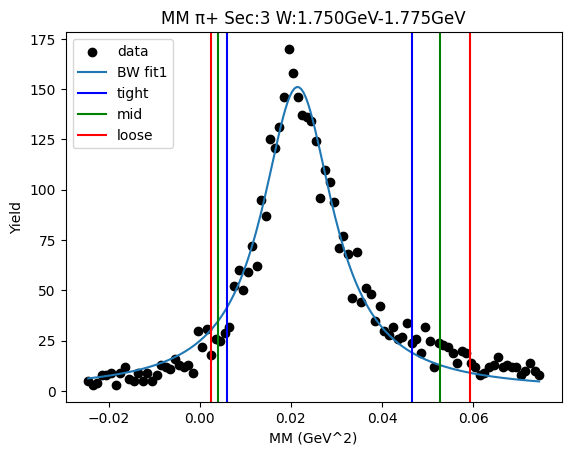

W bin: 15 1.775GeV-1.800GeV
Cut Bounds [[0.00465085 0.00278019 0.00138815]
 [0.04968137 0.05681682 0.06443089]]
Cut Bounds Err [[1.02724747e-06 9.51323642e-07 7.83380640e-07]
 [3.35742176e-06 4.30060498e-06 5.33705374e-06]]


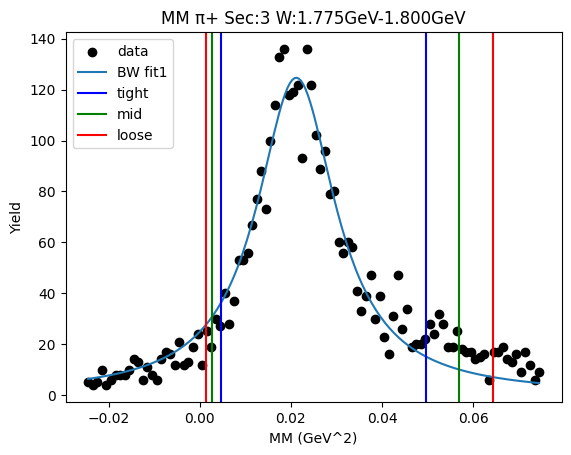

W bin: 16 1.800GeV-1.825GeV
Cut Bounds [[0.00506263 0.00312149 0.00164742]
 [0.05016286 0.05724177 0.06478775]]
Cut Bounds Err [[7.55825020e-07 7.10875406e-07 6.01833932e-07]
 [2.37916451e-06 3.04417175e-06 3.77416494e-06]]


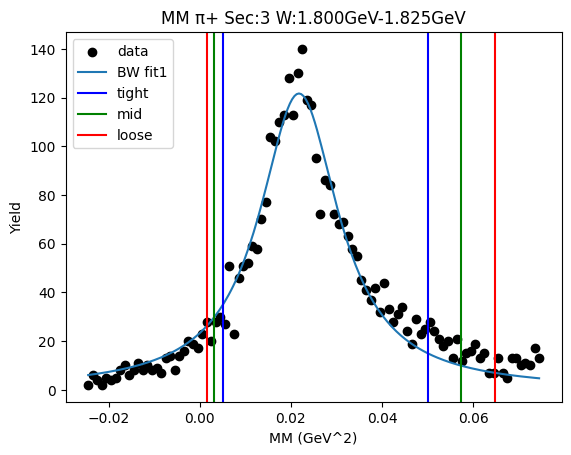

W bin: 17 1.825GeV-1.850GeV
Cut Bounds [[0.00351151 0.00177785 0.00062855]
 [0.05298892 0.06115073 0.06989692]]
Cut Bounds Err [[1.13230457e-06 9.65097096e-07 6.68766689e-07]
 [4.39854004e-06 5.66010806e-06 7.05232069e-06]]


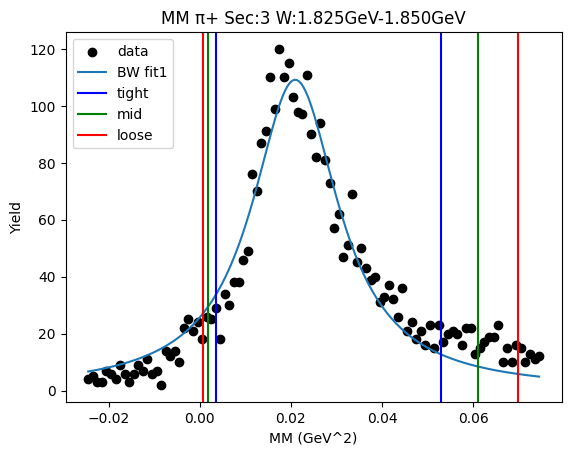

W bin: 18 1.850GeV-1.875GeV
Cut Bounds [[0.00414251 0.00233405 0.00104082]
 [0.05056437 0.05804029 0.06603143]]
Cut Bounds Err [[9.56856122e-07 8.60322337e-07 6.69518578e-07]
 [3.34300600e-06 4.29013096e-06 5.33273460e-06]]


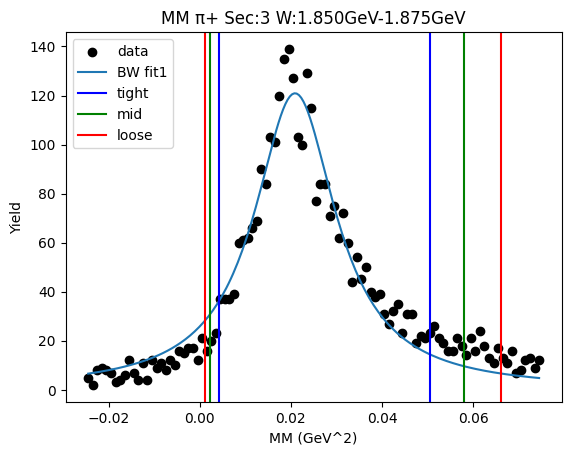

W bin: 19 1.875GeV-1.900GeV
Cut Bounds [[0.00453668 0.00265566 0.0012753 ]
 [0.05088277 0.05827098 0.06615984]]
Cut Bounds Err [[7.72312802e-07 7.07780080e-07 5.71591205e-07]
 [2.58648339e-06 3.31541532e-06 4.11695166e-06]]


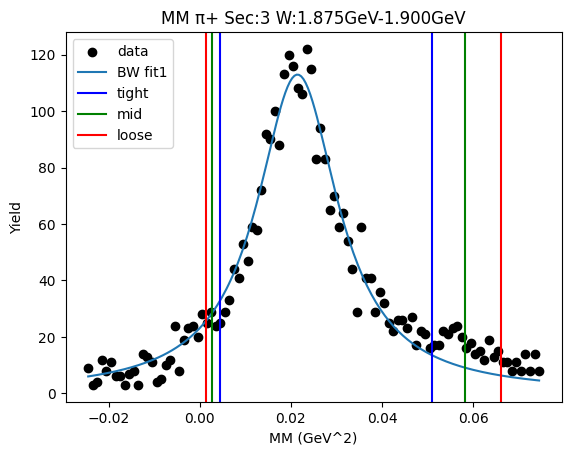

W bin: 20 1.900GeV-1.925GeV
background fit [2.15317290e+01 3.12892993e+03 1.29799276e+02 9.40578528e+00
 6.18294961e-02 1.60861350e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.010714722414242164 0.03044413070931226
Breit-Wigner Peak [9.17209827 0.14345531 0.05734313]
Gaus2 [14182.96506517  1411.82094274   315.63281292]
Gaus3 [16.26615696  0.0423641   0.02532726]
Cut Bounds [[0.00679833 0.00493525 0.00336988]
 [0.04180334 0.04694126 0.05237689]]
Cut Bounds Err [[3.86836177e-06 3.95462735e-06 3.81216004e-06]
 [9.59249240e-06 1.21963103e-05 1.50291320e-05]]


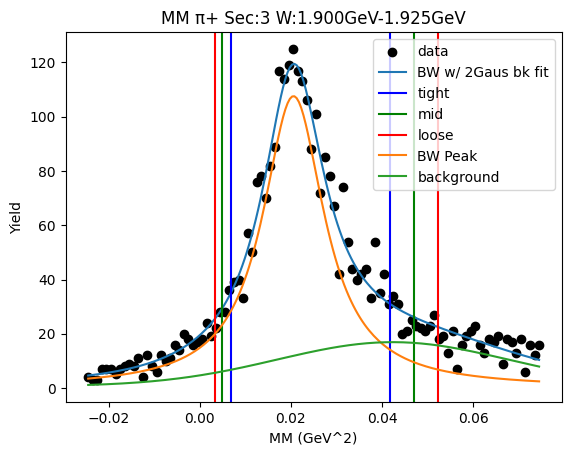

W bin: 21 1.925GeV-1.950GeV
background fit [1.32292912e+04 3.19234512e+03 2.52809771e+02 2.75019026e+01
 1.32771063e-01 4.56086892e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.007565204135299607 0.03323635390455555
Breit-Wigner Peak [10.20985636  0.1428313   0.06541043]
Gaus2 [2.71019326e+00 5.67860488e+03 8.31008627e+01]
Gaus3 [13.50797314  0.045279    0.02520158]
Cut Bounds [[0.00536494 0.00351988 0.0020622 ]
 [0.04512092 0.05122707 0.05772059]]
Cut Bounds Err [[5.63511726e-06 5.47696897e-06 4.89072385e-06]
 [1.63421675e-05 2.08942045e-05 2.58745419e-05]]


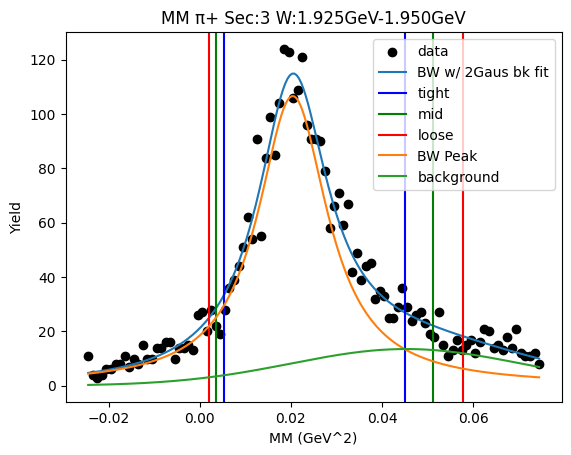

W bin: 22 1.950GeV-1.975GeV
background fit [9.91872379e-03 1.06838824e+05 7.12470989e+03 6.35921078e+00
 5.81449182e-02 1.01716516e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.004857617806324432 0.03710418792191964
Breit-Wigner Peak [10.63341623  0.14484786  0.07331049]
Gaus2 [  3438.74525517 213859.71317557   7115.46838652]
Gaus3 [8.45349627 0.05072487 0.02217156]
Cut Bounds [[0.00446999 0.00262759 0.00127178]
 [0.04965666 0.05685159 0.06453312]]
Cut Bounds Err [[2.82561797e-06 2.59920065e-06 2.10943214e-06]
 [9.41778960e-06 1.20901739e-05 1.50262616e-05]]


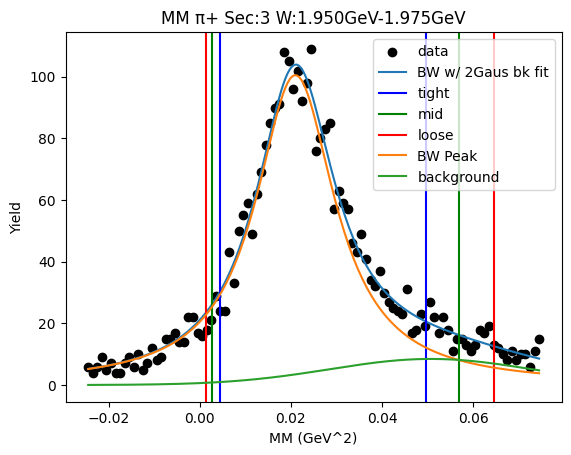

W bin: 23 1.975GeV-2.000GeV
background fit [9.69850298e-02 7.06309411e+05 9.01359876e+03 7.92257921e+00
 5.94229668e-02 1.29335857e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.007033465889656525 0.03445239129243959
Breit-Wigner Peak [9.39208775 0.14402406 0.06760045]
Gaus2 [137112.23442744 551777.56689886  10655.31022293]
Gaus3 [12.3863538   0.04971339  0.02515184]
Cut Bounds [[0.00519966 0.00333225 0.00187858]
 [0.04662984 0.05304846 0.05988082]]
Cut Bounds Err [[5.35151281e-06 5.14072412e-06 4.50306420e-06]
 [1.60258456e-05 2.05112511e-05 2.54236389e-05]]


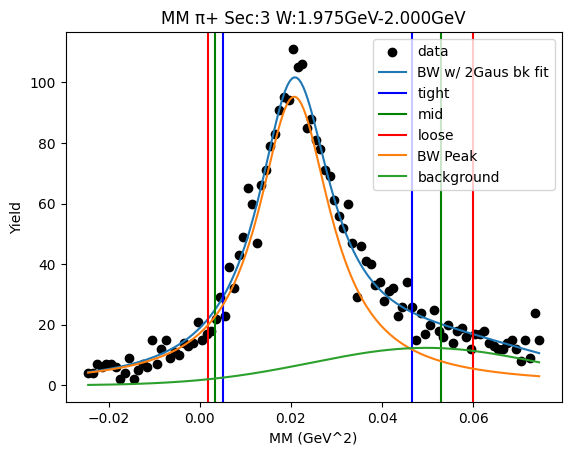

W bin: 24 2.000GeV-2.025GeV
background fit [1.70045336e+05 8.31679318e+05 1.77197794e+05 6.19387228e+00
 5.55585529e-02 5.48813393e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.010168684040193155 0.029665660628381014
Breit-Wigner Peak [7.13988352 0.14112821 0.05700435]
Gaus2 [170476.69230352 861586.43912641 178260.44749212]
Gaus3 [19.47679352  0.03324084  0.02252856]
Cut Bounds [[0.00647788 0.00467264 0.0031616 ]
 [0.04071159 0.04575309 0.0510888 ]]
Cut Bounds Err [[5.04750476e-06 5.14347969e-06 4.93556317e-06]
 [1.26537514e-05 1.60948217e-05 1.98401995e-05]]


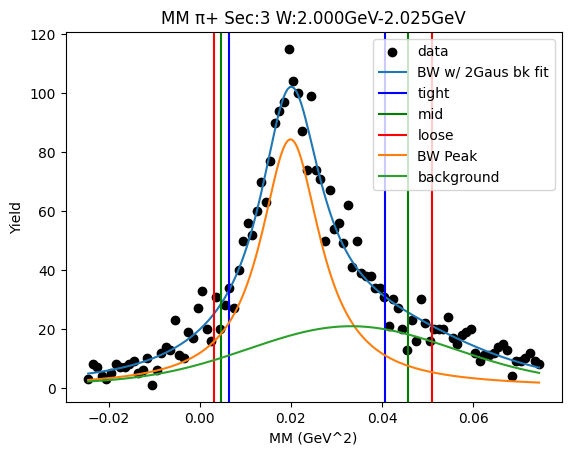

W bin: 25 2.025GeV-2.050GeV
background fit [9.41844661e+04 1.39219748e+06 2.64102297e+05 7.05141173e+00
 5.99633729e-02 1.17941859e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.002561071255776346 0.03811525711115772
Breit-Wigner Peak [8.93897276 0.14261194 0.07697855]
Gaus2 [5411291.08768359 2533725.01633817   51037.06814408]
Gaus3 [11.55481751  0.05071975  0.02430054]
Cut Bounds [[0.0036869  0.00196616 0.00078193]
 [0.05040205 0.05802434 0.06618314]]
Cut Bounds Err [[1.43881354e-05 1.26081274e-05 9.27605148e-06]
 [5.31983154e-05 6.84929535e-05 8.53400049e-05]]


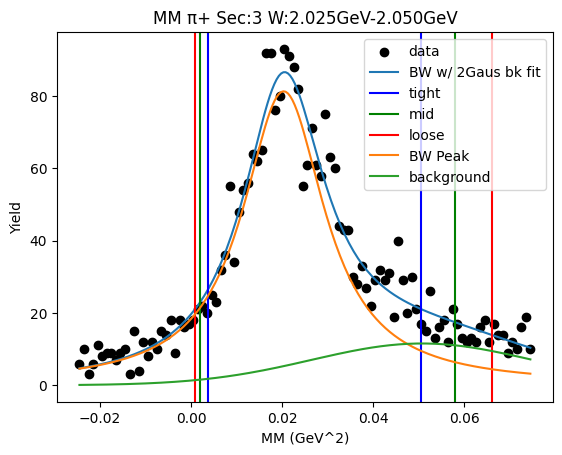

W bin: 26 2.050GeV-2.075GeV
background fit [4.57374100e+06 1.99579045e+07 1.56057406e+06 8.37645985e+00
 8.04510476e-02 2.17655294e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0015179627243976056 0.04064905523295806
Breit-Wigner Peak [9.99068297 0.14520161 0.08075796]
Gaus2 [35526257.94888929 39351645.28571711  1410968.66736637]
Gaus3 [14.30806277  0.09995972  0.03907446]
Cut Bounds [[0.00351517 0.00177294 0.0006212 ]
 [0.05341384 0.06165134 0.07047933]]
Cut Bounds Err [[8.33651265e-06 7.10421035e-06 4.90585575e-06]
 [3.24966065e-05 4.18928183e-05 5.22554348e-05]]


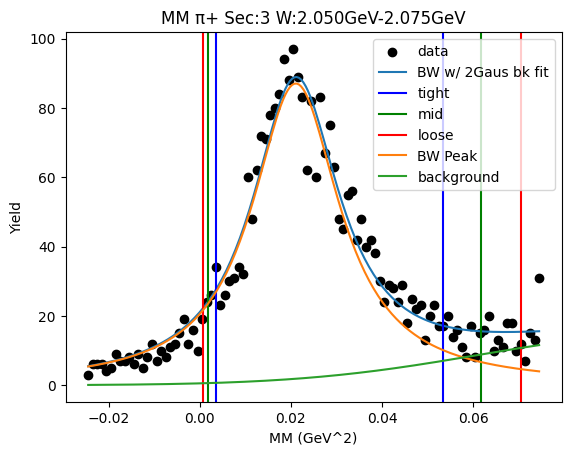

W bin: 27 2.075GeV-2.100GeV
background fit [3.55262579e+07 9.15664077e+07 7.87047940e+06 7.49845077e+00
 6.81156952e-02 1.78833557e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.012611435225742363 0.028418092937110565
Breit-Wigner Peak [5.03499063 0.14322976 0.05132682]
Gaus2 [80209634.79344307 69687372.52216105 12167308.68227399]
Gaus3 [2.02148624e+01 3.21699174e-02 1.79991201e-02]
Cut Bounds [[0.0078547  0.00603825 0.00446031]
 [0.0391378  0.04357797 0.04825665]]
Cut Bounds Err [[1.15410384e-05 1.21415307e-05 1.21736625e-05]
 [2.57619220e-05 3.26175635e-05 4.00421442e-05]]


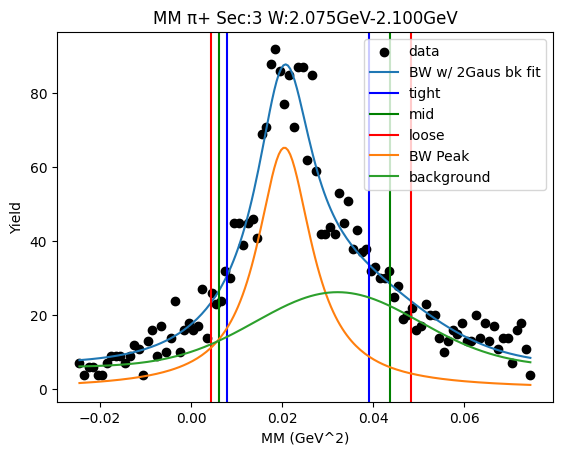

W bin: 28 2.100GeV-2.125GeV
background fit [5.24564376e+07 1.30334297e+08 1.55543983e+07 2.69511513e+00
 7.04850501e-02 5.54008721e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.002732805788886763 0.04794689651021215
Breit-Wigner Peak [9.51706482 0.15035639 0.09190548]
Gaus2 [5.24564376e+07 1.30334297e+08 1.55543983e+07]
Gaus3 [2.69511513 0.07048505 0.05540087]
Cut Bounds [[0.00276514 0.001091   0.0001816 ]
 [0.06156759 0.07165394 0.08250503]]
Cut Bounds Err [[1.01597655e-05 7.65714329e-06 3.64441883e-06]
 [4.79403424e-05 6.20547369e-05 7.76803044e-05]]


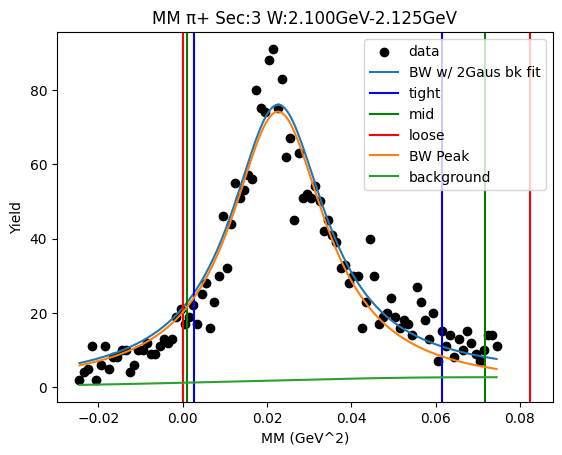

Value Error1.1
	Just skip it for now


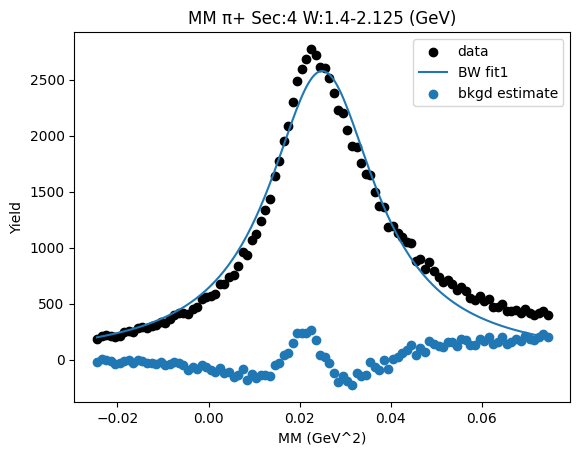

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[1.41946855e-05 2.26008194e-05 3.29531143e-05]
 [3.71721962e-05 5.01738322e-05 6.51216292e-05]]
Cut Bounds Err [[ 95361.39642585 144395.29874482 203416.40874173]
 [154318.79552252 215144.17766082 285956.76747706]]


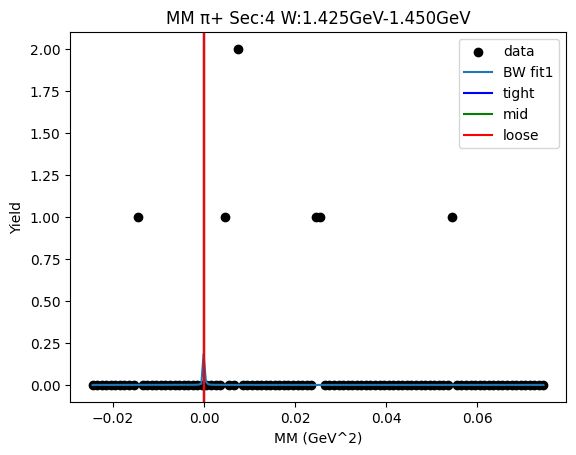

W bin: 2 1.450GeV-1.475GeV
Value Error2.0
	Just skip it for now
Cut Bounds [[0. 0. 0.]
 [0. 0. 0.]]
Cut Bounds Err [[0. 0. 0.]
 [0. 0. 0.]]


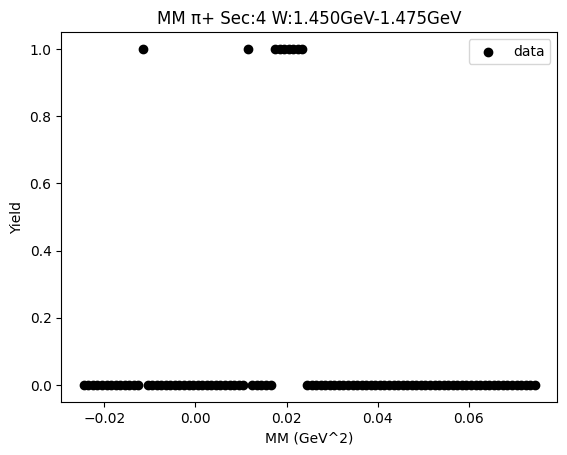

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.01211374 0.01068522 0.0093463 ]
 [0.03132656 0.03374061 0.03624425]]
Cut Bounds Err [[1.45852704e-05 1.64043379e-05 1.78770308e-05]
 [2.34548008e-05 2.91503216e-05 3.52042420e-05]]


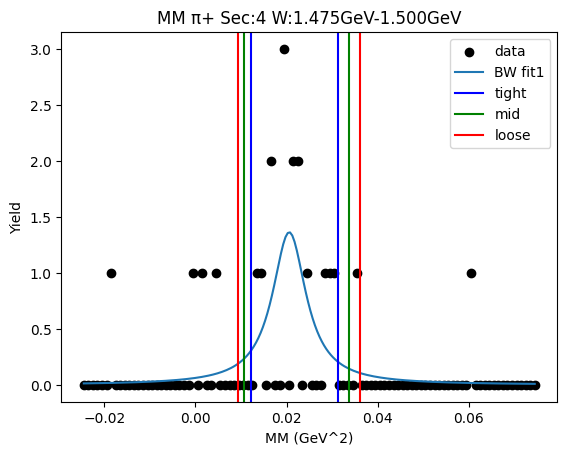

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.00734128 0.00553058 0.00397587]
 [0.03952738 0.04415391 0.04903642]]
Cut Bounds Err [[3.94202380e-05 4.09776570e-05 4.04863595e-05]
 [9.14708013e-05 1.15783402e-04 1.42184402e-04]]


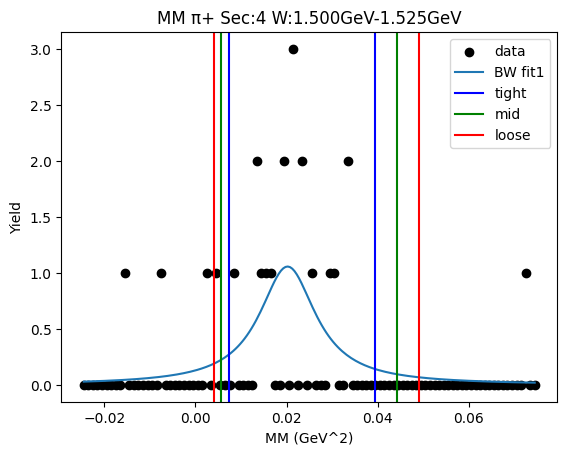

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.00474349 0.0034318  0.00233193]
 [0.02951098 0.03315279 0.03700642]]
Cut Bounds Err [[1.68335727e-05 1.71479237e-05 1.64716306e-05]
 [4.19874186e-05 5.32979917e-05 6.56171408e-05]]


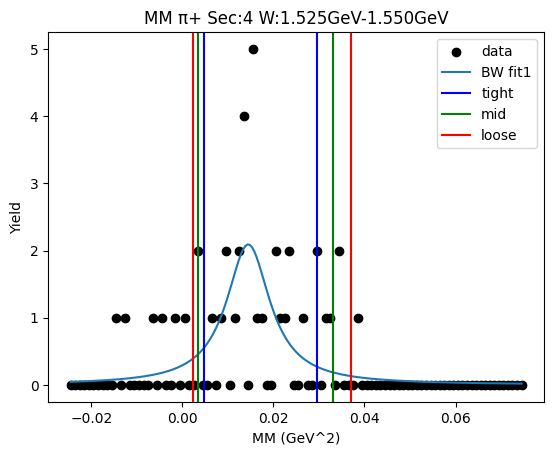

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[1.94328724e-03 6.68623020e-04 5.82590234e-05]
 [5.12264420e-02 5.98084087e-02 6.90546756e-02]]
Cut Bounds Err [[2.65064945e-05 1.86252579e-05 6.40743893e-06]
 [1.36091466e-04 1.76154101e-04 2.20596907e-04]]


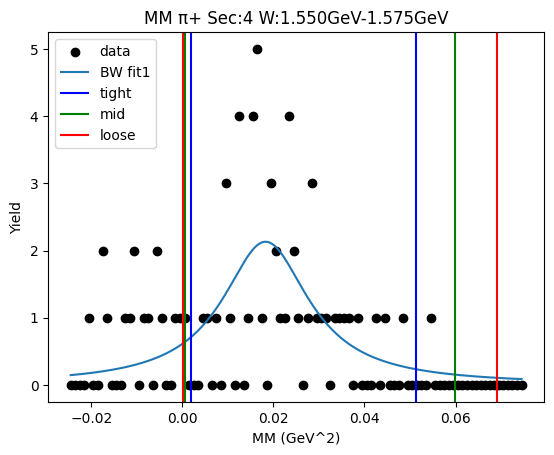

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[4.08803701e-04 1.84147399e-06 5.25918502e-04]
 [5.56855850e-02 6.63339791e-02 7.79134124e-02]]
Cut Bounds Err [[1.18841215e-05 9.55619168e-07 1.88231217e-05]
 [1.38701471e-04 1.81371933e-04 2.29107095e-04]]


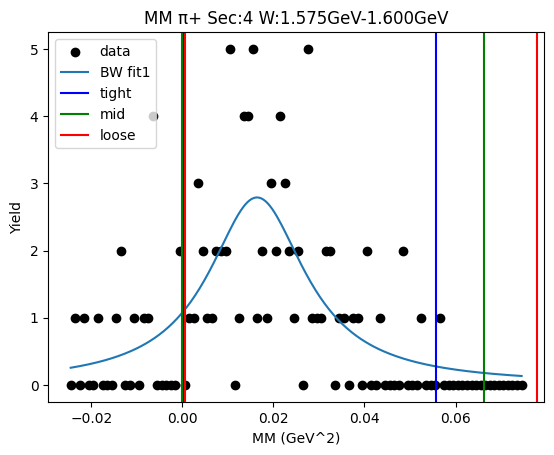

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.00342505 0.00159233 0.00045301]
 [0.05988959 0.06934977 0.07950336]]
Cut Bounds Err [[1.26524966e-05 1.03346382e-05 6.42435021e-06]
 [5.29076381e-05 6.82027042e-05 8.51075784e-05]]


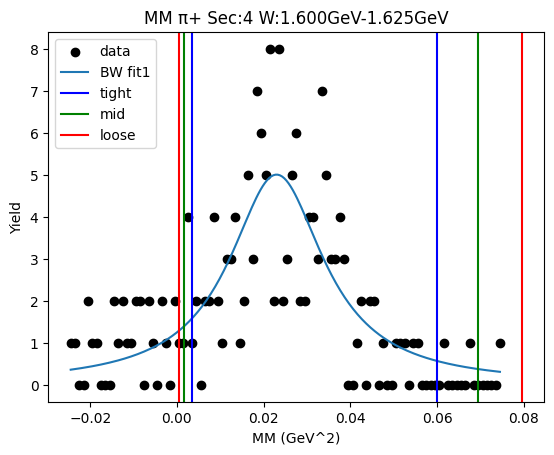

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.00504561 0.002942   0.00140234]
 [0.05709969 0.06540689 0.07427805]]
Cut Bounds Err [[1.15894571e-05 1.06006596e-05 8.52936764e-06]
 [3.89872886e-05 4.99831390e-05 6.20754390e-05]]


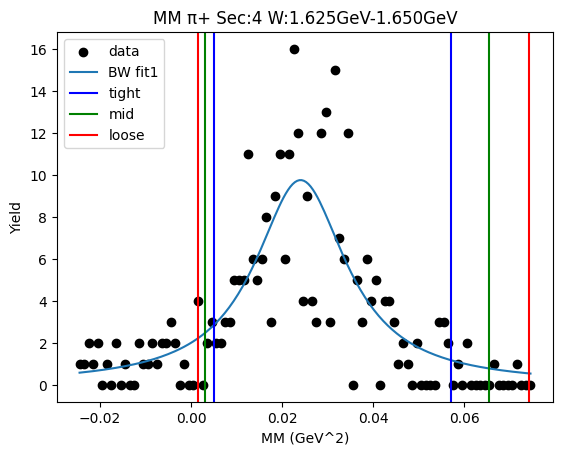

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.00342508 0.00149393 0.00035264]
 [0.06617855 0.0767981  0.08820749]]
Cut Bounds Err [[4.80004692e-06 3.79786622e-06 2.15056186e-06]
 [2.10993257e-05 2.72301019e-05 3.40126135e-05]]


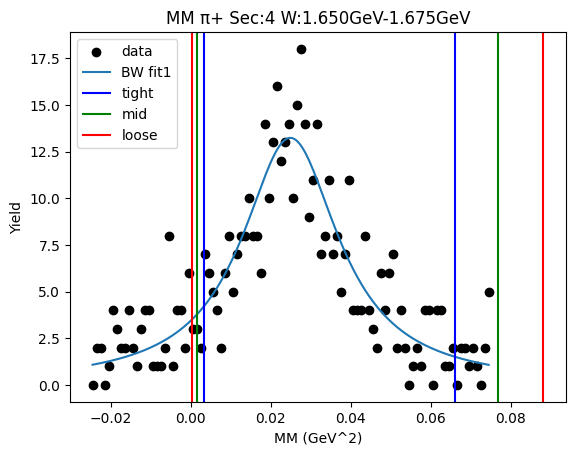

W bin: 11 1.675GeV-1.700GeV
Cut Bounds [[0.00617468 0.00382277 0.00203202]
 [0.06055789 0.06908263 0.07816852]]
Cut Bounds Err [[3.25531138e-06 3.06820064e-06 2.60698715e-06]
 [1.01946139e-05 1.30430562e-05 1.61692937e-05]]


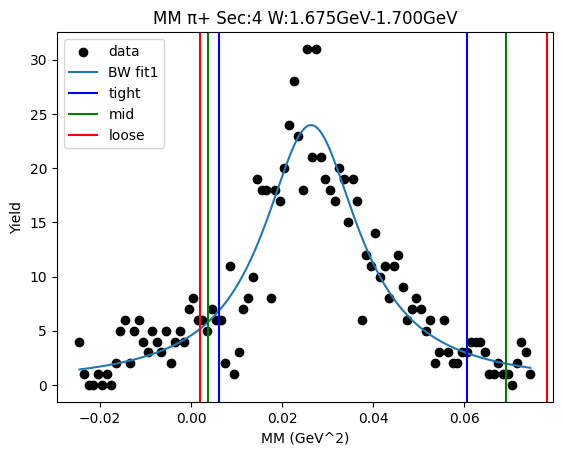

W bin: 12 1.700GeV-1.725GeV
Cut Bounds [[0.00591698 0.00364288 0.00191763]
 [0.05884395 0.06715525 0.07601539]]
Cut Bounds Err [[2.18611634e-06 2.05470937e-06 1.73734827e-06]
 [6.89404765e-06 8.82201515e-06 1.09384460e-05]]


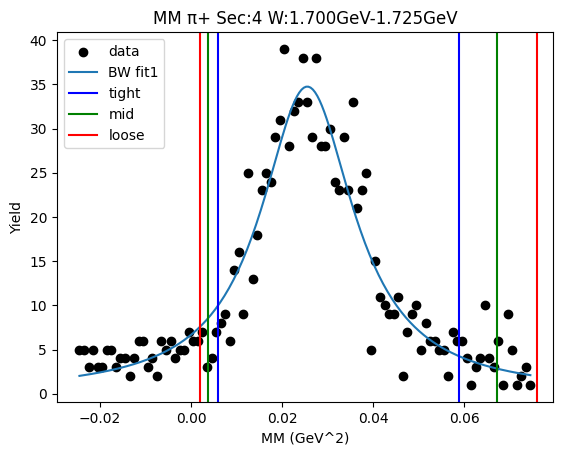

W bin: 13 1.725GeV-1.750GeV
Cut Bounds [[0.0066416  0.00430342 0.00247057]
 [0.05781713 0.06571405 0.07411631]]
Cut Bounds Err [[1.63581414e-06 1.57724139e-06 1.39271047e-06]
 [4.82642755e-06 6.16340290e-06 7.62814617e-06]]


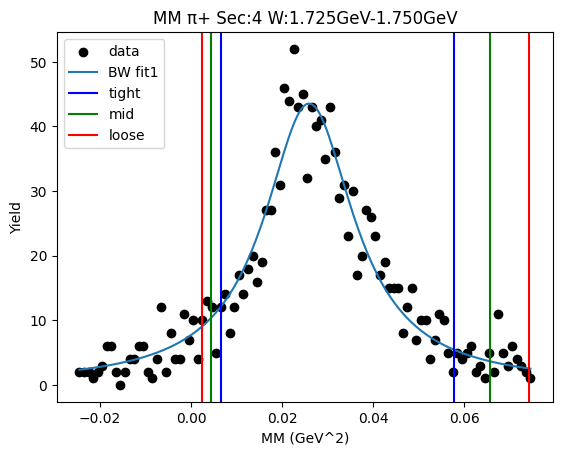

W bin: 14 1.750GeV-1.775GeV
Cut Bounds [[0.00732891 0.00487524 0.00291997]
 [0.05927779 0.0672139  0.07564841]]
Cut Bounds Err [[1.64811103e-06 1.61012457e-06 1.45218562e-06]
 [4.68719385e-06 5.97848514e-06 7.39150137e-06]]


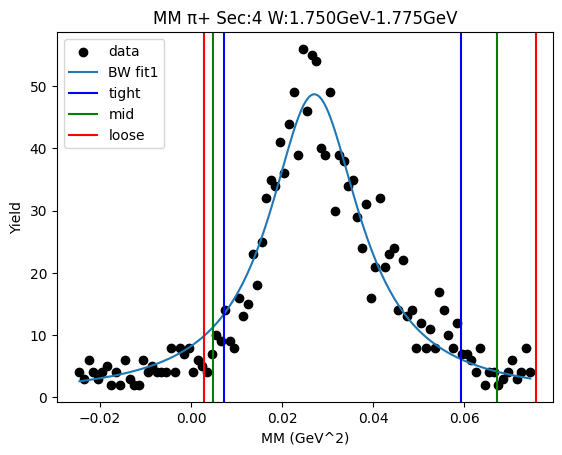

W bin: 15 1.775GeV-1.800GeV
Cut Bounds [[0.00813579 0.00567888 0.00366244]
 [0.0569306  0.06423265 0.07197516]]
Cut Bounds Err [[2.05359539e-06 2.05506453e-06 1.92327292e-06]
 [5.43235054e-06 6.91149355e-06 8.52603287e-06]]


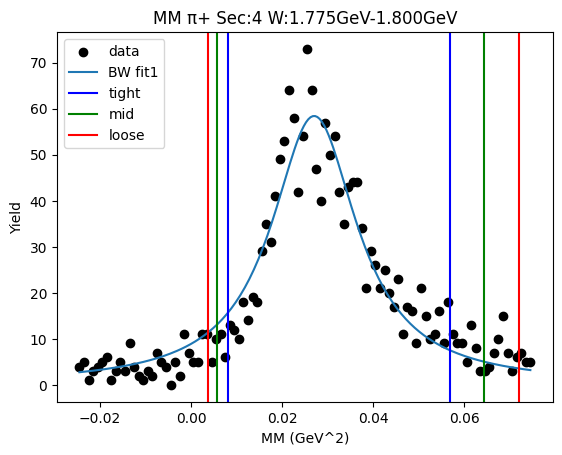

W bin: 16 1.800GeV-1.825GeV
Cut Bounds [[0.00723377 0.00481921 0.00289331]
 [0.05825567 0.06604549 0.07432396]]
Cut Bounds Err [[2.04066051e-06 1.99511226e-06 1.80154723e-06]
 [5.79105253e-06 7.38585966e-06 9.13088467e-06]]


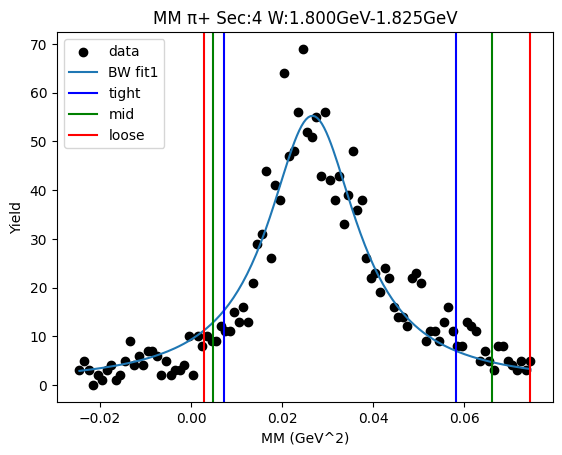

W bin: 17 1.825GeV-1.850GeV
Cut Bounds [[0.00756792 0.00521072 0.0032921 ]
 [0.05526199 0.0624436  0.0700638 ]]
Cut Bounds Err [[1.67249186e-06 1.66226777e-06 1.53974459e-06]
 [4.51948621e-06 5.75434969e-06 7.10328437e-06]]


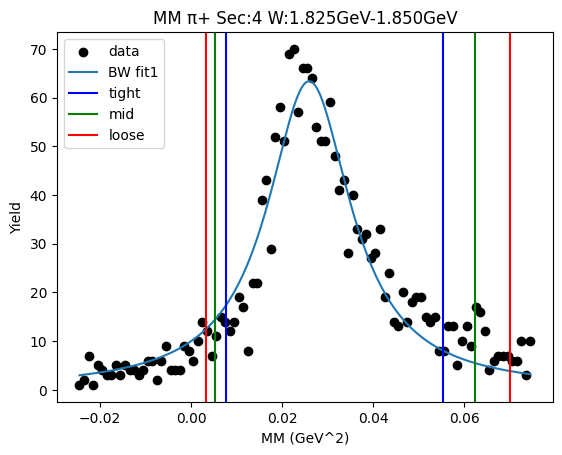

W bin: 18 1.850GeV-1.875GeV
Cut Bounds [[0.00744616 0.00503624 0.003096  ]
 [0.05737853 0.06495508 0.07300132]]
Cut Bounds Err [[1.22707136e-06 1.20876662e-06 1.10447504e-06]
 [3.40626390e-06 4.34106180e-06 5.36315730e-06]]


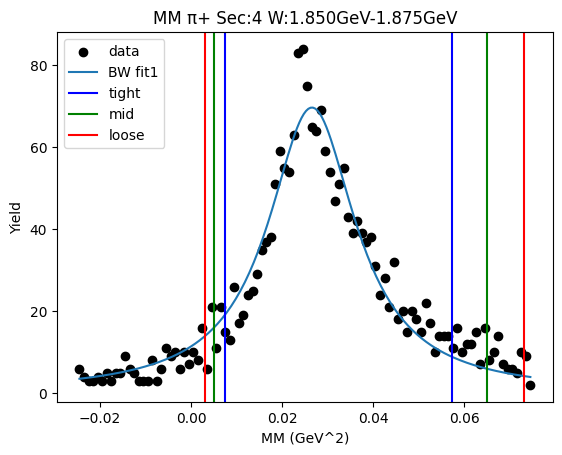

W bin: 19 1.875GeV-1.900GeV
Cut Bounds [[0.0076263  0.00527417 0.00335453]
 [0.0549343  0.06204378 0.06958573]]
Cut Bounds Err [[1.45489831e-06 1.44919765e-06 1.34686899e-06]
 [3.90478753e-06 4.97049313e-06 6.13436385e-06]]


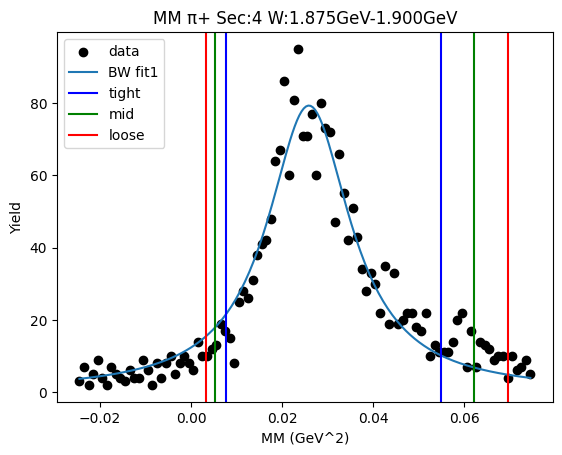

W bin: 20 1.900GeV-1.925GeV
background fit [1.16865599e+01 3.17541250e+01 2.41922882e+00 6.83334043e+00
 5.77933641e-02 1.07004150e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.01445568623332688 0.0345021316903102
Breit-Wigner Peak [7.41782229 0.15645737 0.05780203]
Gaus2 [46.121169   68.61899614  2.54308487]
Gaus3 [12.0960196   0.04691183  0.01871521]
Cut Bounds [[0.00901851 0.00683392 0.00495183]
 [0.04750172 0.05301377 0.05882832]]
Cut Bounds Err [[4.54886084e-06 4.75120909e-06 4.71813340e-06]
 [1.04397436e-05 1.32331556e-05 1.62622460e-05]]


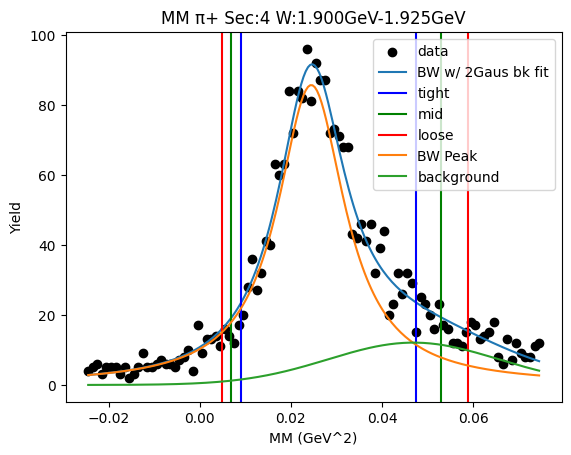

W bin: 21 1.925GeV-1.950GeV
background fit [4.58564845e+01 3.48248870e+01 6.59605485e+00 5.25188992e+00
 5.28209164e-02 1.14511148e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.01733504759265184 0.024773544245596187
Breit-Wigner Peak [3.4722681  0.14510099 0.03521008]
Gaus2 [21.54305599  0.03310103  0.02590182]
Gaus3 [3.02474996e+01 3.00000000e-02 7.07454969e-03]
Cut Bounds [[0.01158711 0.01003041 0.00858596]
 [0.03332761 0.03611901 0.03902265]]
Cut Bounds Err [[6.66275489e-06 7.43319510e-06 8.01968417e-06]
 [1.12997357e-05 1.41053552e-05 1.70970537e-05]]


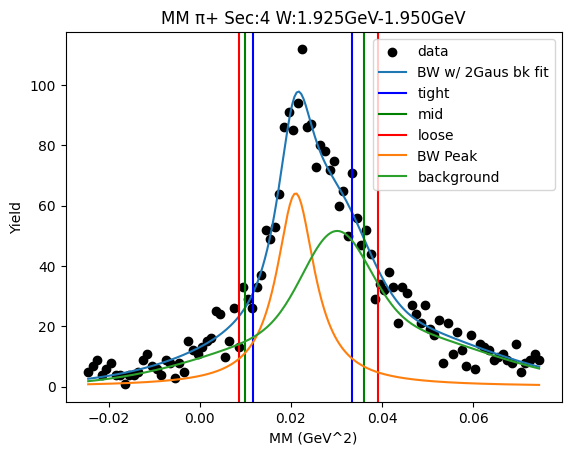

W bin: 22 1.950GeV-1.975GeV
background fit [9.55122648e+00 5.35052180e-02 9.14385997e-03 2.20769048e+00
 3.00000000e-02 5.17040715e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.013821854327922677 0.03266845503985403
Breit-Wigner Peak [7.41492344 0.15246362 0.05604552]
Gaus2 [2.11852294e+01 4.25889629e-02 1.75300988e-02]
Gaus3 [2.20769048e+00 3.00000001e-02 5.17040715e-05]
Cut Bounds [[0.0086194  0.00654742 0.00475984]
 [0.04498069 0.05018097 0.05566564]]
Cut Bounds Err [[7.22948738e-06 7.56058161e-06 7.52046336e-06]
 [1.65151309e-05 2.09309781e-05 2.57182951e-05]]


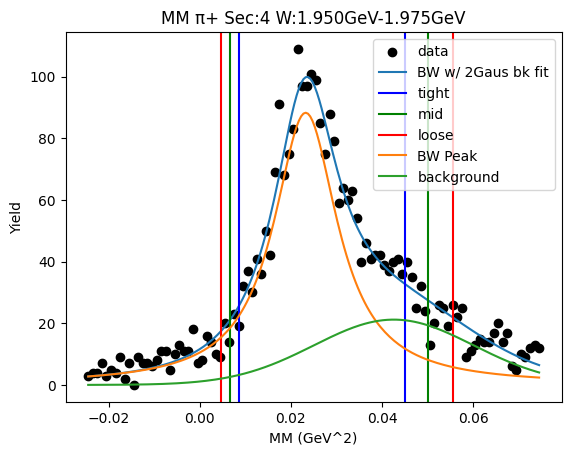

W bin: 23 1.975GeV-2.000GeV
background fit [7.31543312e+00 5.74608974e-02 1.16800324e-02 2.20769048e+00
 3.00000001e-02 5.17040715e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.016626074930565025 0.03196277482609965
Breit-Wigner Peak [6.8629849  0.15586669 0.05055805]
Gaus2 [21.45679204  0.03719309  0.02259672]
Gaus3 [2.20769048e+00 3.00000001e-02 5.17040715e-05]
Cut Bounds [[0.01042064 0.00834016 0.00649112]
 [0.0439539  0.04858008 0.05343768]]
Cut Bounds Err [[3.64692836e-06 3.91466328e-06 4.02884844e-06]
 [7.48994751e-06 9.44792045e-06 1.15596596e-05]]


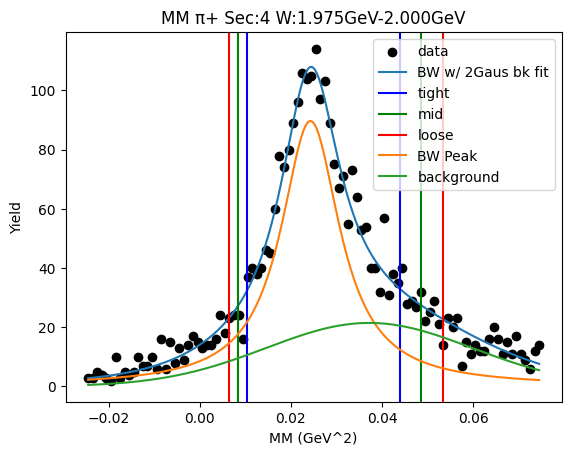

W bin: 24 2.000GeV-2.025GeV
background fit [6.11780087e+00 5.72485916e-02 1.07934112e-02 2.20769048e+00
 3.00000001e-02 5.17040715e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.012764470238836862 0.03588899862581062
Breit-Wigner Peak [8.19069918 0.1559703  0.0620813 ]
Gaus2 [16.53954693  0.04297241  0.01826338]
Gaus3 [2.20769048e+00 3.00000001e-02 5.17040715e-05]
Cut Bounds [[0.00808675 0.00588559 0.00403337]
 [0.04929032 0.05532987 0.06171837]]
Cut Bounds Err [[8.78770323e-06 8.99572782e-06 8.68770503e-06]
 [2.16954762e-05 2.75817158e-05 3.39843106e-05]]


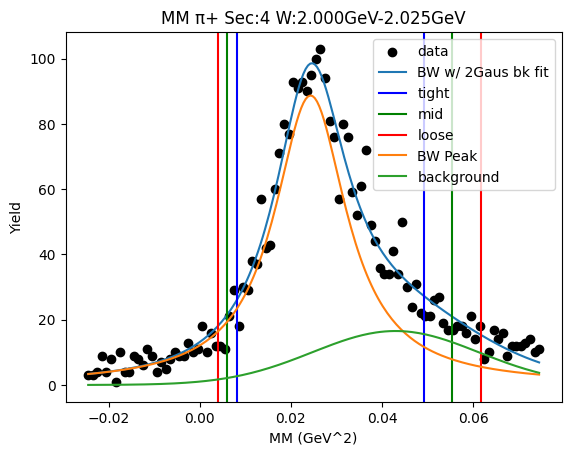

W bin: 25 2.025GeV-2.050GeV
background fit [8.33063972e+00 5.57891395e-02 1.00934623e-02 2.20769048e+00
 3.00000001e-02 5.17040715e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.01323635723246594 0.033834737229359584
Breit-Wigner Peak [8.20833121 0.153413   0.05859235]
Gaus2 [16.80678811  0.04362342  0.01990171]
Gaus3 [2.20769048e+00 3.00000001e-02 5.17040715e-05]
Cut Bounds [[0.0082957  0.0061802  0.00437553]
 [0.04654603 0.0520806  0.05792599]]
Cut Bounds Err [[8.80016405e-06 9.11451795e-06 8.94718924e-06]
 [2.08451809e-05 2.64588153e-05 3.25542726e-05]]


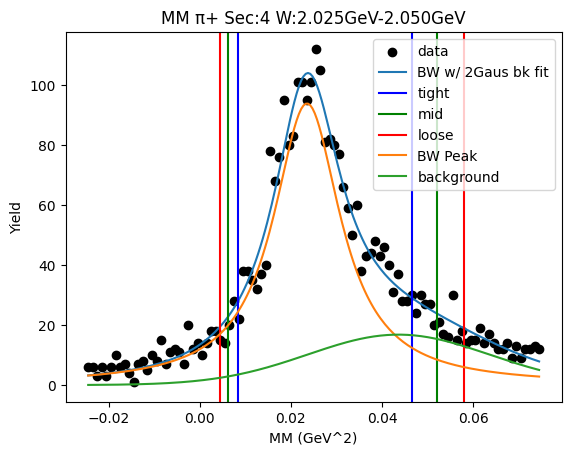

W bin: 26 2.050GeV-2.075GeV
background fit [6.93325833e+00 5.57868774e-02 7.96847048e-03 2.20769048e+00
 3.00000001e-02 5.17040715e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.012296625092317801 0.0348622574457845
Breit-Wigner Peak [7.84794382 0.15355599 0.06132649]
Gaus2 [1.93008617e+01 4.02362934e-02 1.75023810e-02]
Gaus3 [2.20769048e+00 3.00000001e-02 5.17040715e-05]
Cut Bounds [[0.00779955 0.0056651  0.00387116]
 [0.0478721  0.05375216 0.05997274]]
Cut Bounds Err [[1.00346653e-05 1.02618930e-05 9.89636425e-06]
 [2.48604777e-05 3.16097986e-05 3.89521980e-05]]


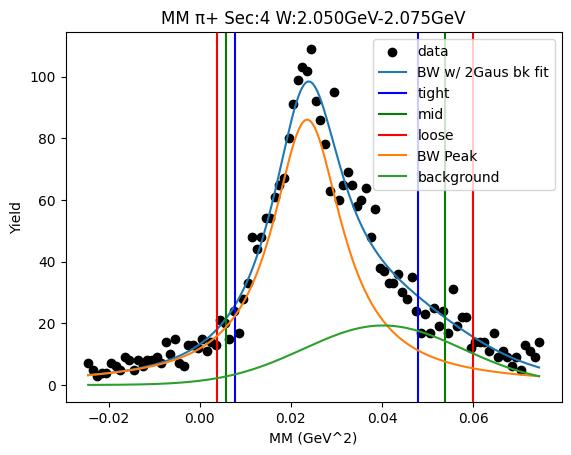

W bin: 27 2.075GeV-2.100GeV
background fit [9.73723452e+00 7.75663419e-02 1.86140514e-02 2.20769048e+00
 3.00000001e-02 5.17040715e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.01171870229309389 0.035645312397578274
Breit-Wigner Peak [8.52195871 0.15388959 0.06314878]
Gaus2 [11.47543703  0.0510494   0.02509709]
Gaus3 [2.20769048e+00 3.00000001e-02 5.17040715e-05]
Cut Bounds [[0.00751863 0.0053691  0.00358061]
 [0.04887157 0.05499262 0.06147472]]
Cut Bounds Err [[7.36229811e-06 7.46549315e-06 7.11250814e-06]
 [1.87703400e-05 2.38924142e-05 2.94708320e-05]]


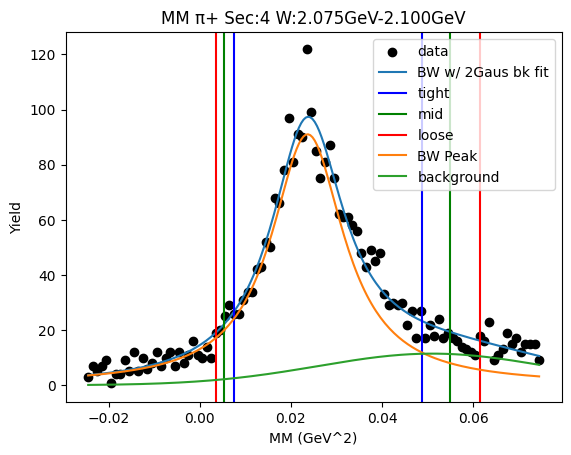

W bin: 28 2.100GeV-2.125GeV
background fit [8.46360570e+00 5.70823519e-02 8.13227100e-03 2.20769048e+00
 3.00000001e-02 5.17040715e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.011278478823370956 0.03645504440591429
Breit-Wigner Peak [8.6570571  0.15448871 0.06477727]
Gaus2 [13.11130091  0.0485489   0.01968289]
Gaus3 [2.20769048e+00 3.00000001e-02 5.17040715e-05]
Cut Bounds [[0.00732338 0.00515443 0.00336538]
 [0.04990787 0.05625582 0.06298368]]
Cut Bounds Err [[5.35412289e-06 5.38905628e-06 5.07962444e-06]
 [1.39771040e-05 1.78035380e-05 2.19749702e-05]]


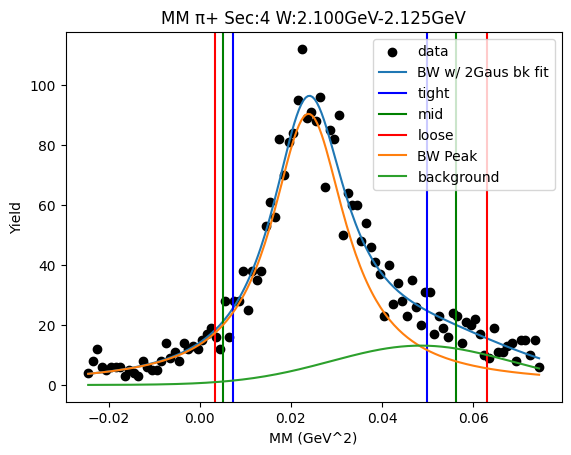

Value Error1.1
	Just skip it for now


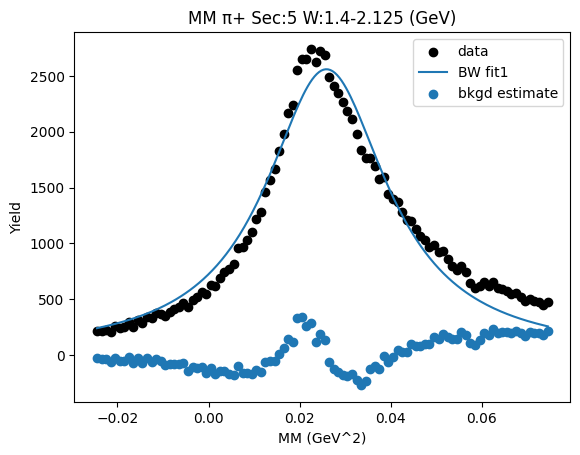

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.0089502  0.00654352 0.00451296]
 [0.05370346 0.06024743 0.06716753]]
Cut Bounds Err [[2.94110876e-06 3.01204672e-06 2.91499335e-06]
 [7.20436827e-06 9.13955966e-06 1.12457005e-05]]


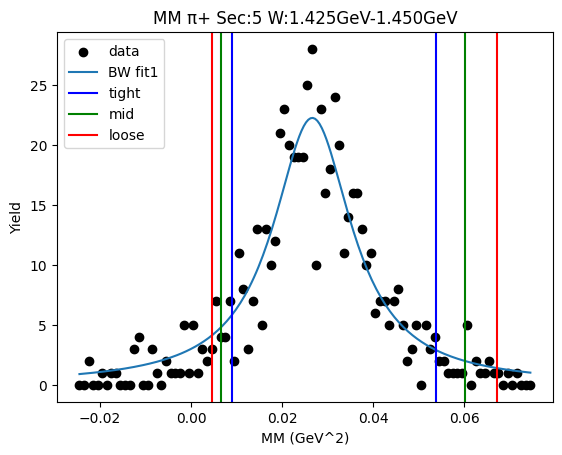

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.00610446 0.00373748 0.00194824]
 [0.06154963 0.07027169 0.07957148]]
Cut Bounds Err [[3.22900807e-06 3.02656234e-06 2.54662104e-06]
 [1.02531720e-05 1.31235179e-05 1.62750369e-05]]


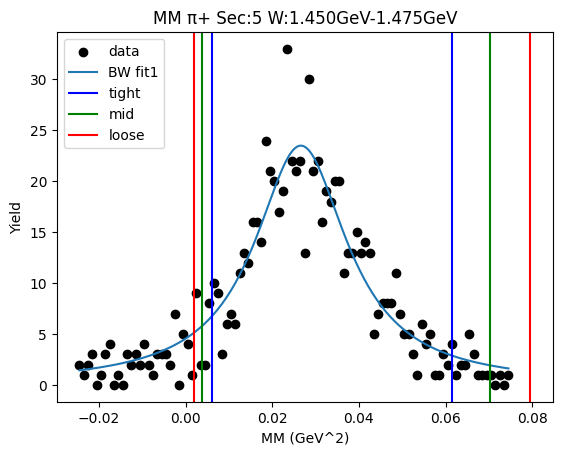

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.00690342 0.00447001 0.00256335]
 [0.06020801 0.06843552 0.07718977]]
Cut Bounds Err [[2.48658585e-06 2.39677836e-06 2.11520699e-06]
 [7.34342230e-06 9.37808534e-06 1.16072370e-05]]


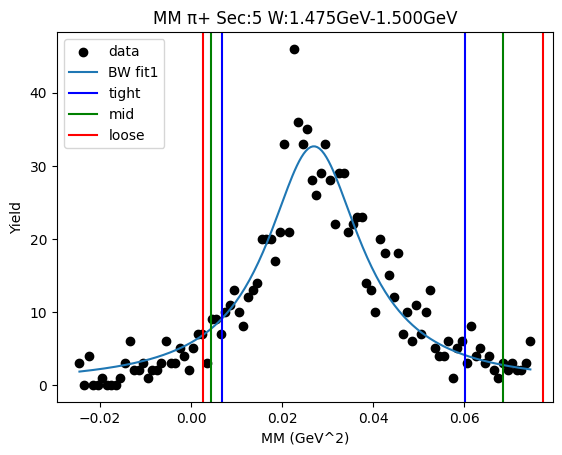

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.00811149 0.00567243 0.00366839]
 [0.05642839 0.06365271 0.07131206]]
Cut Bounds Err [[1.92052140e-06 1.92366994e-06 1.80278681e-06]
 [5.06544702e-06 6.44398644e-06 7.94855504e-06]]


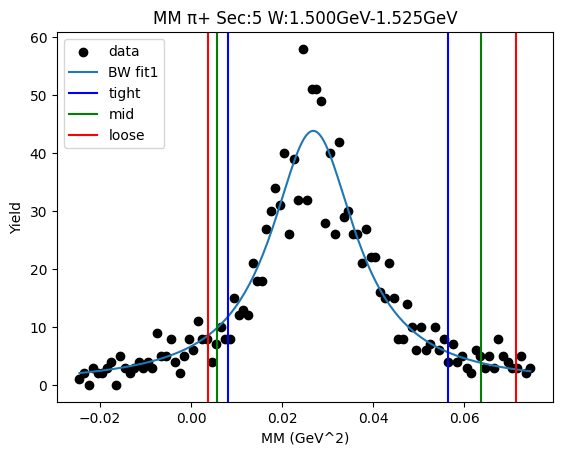

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.00715585 0.00478609 0.0028913 ]
 [0.05697745 0.064572   0.07264154]]
Cut Bounds Err [[2.28863185e-06 2.24192939e-06 2.03069399e-06]
 [6.45798033e-06 8.23481276e-06 1.01786508e-05]]


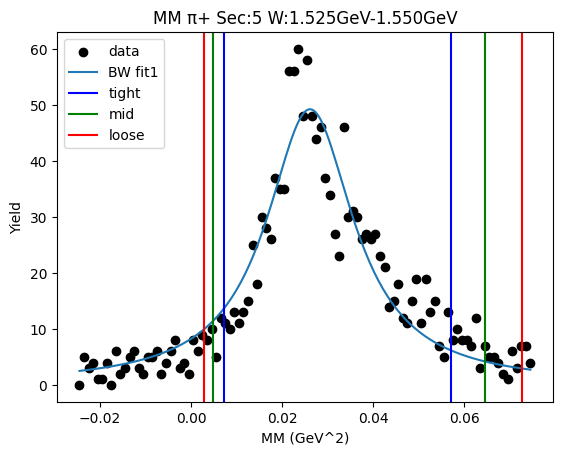

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.0068562  0.00437937 0.00245534]
 [0.06202897 0.07058668 0.07969721]]
Cut Bounds Err [[2.39725076e-06 2.29502766e-06 2.00271383e-06]
 [7.21055782e-06 9.21390064e-06 1.14099685e-05]]


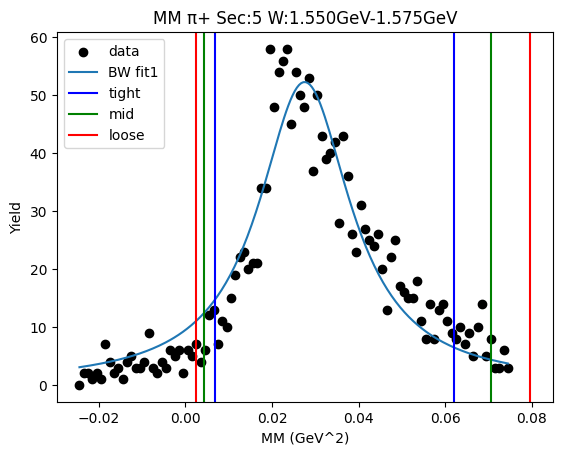

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.00607591 0.00369185 0.00189861]
 [0.06241192 0.07129506 0.08076902]]
Cut Bounds Err [[2.08448753e-06 1.94640926e-06 1.62673050e-06]
 [6.68078145e-06 8.55346165e-06 1.06101204e-05]]


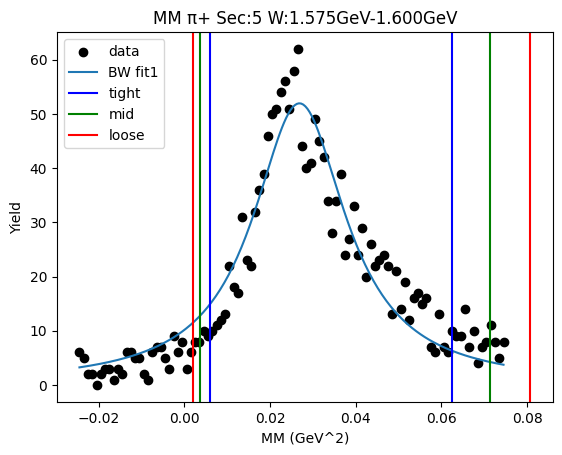

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.00694213 0.00456642 0.00268646]
 [0.05796602 0.06579508 0.0741199 ]]
Cut Bounds Err [[1.82984584e-06 1.77765718e-06 1.58898625e-06]
 [5.28755268e-06 6.74771604e-06 8.34635939e-06]]


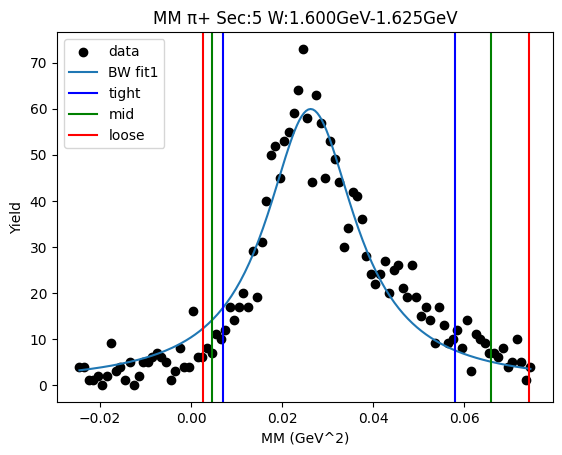

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.00560938 0.00342029 0.00176993]
 [0.05713151 0.06524683 0.07390091]]
Cut Bounds Err [[2.90703697e-06 2.71909465e-06 2.27953487e-06]
 [9.27749622e-06 1.18760726e-05 1.47296518e-05]]


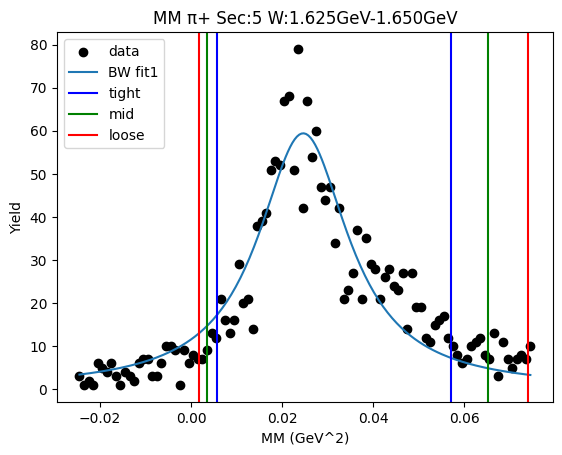

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.00516625 0.00295217 0.00135359]
 [0.06115912 0.07014362 0.07974361]]
Cut Bounds Err [[2.37108354e-06 2.14709716e-06 1.69438500e-06]
 [8.15811600e-06 1.04658592e-05 1.30051743e-05]]


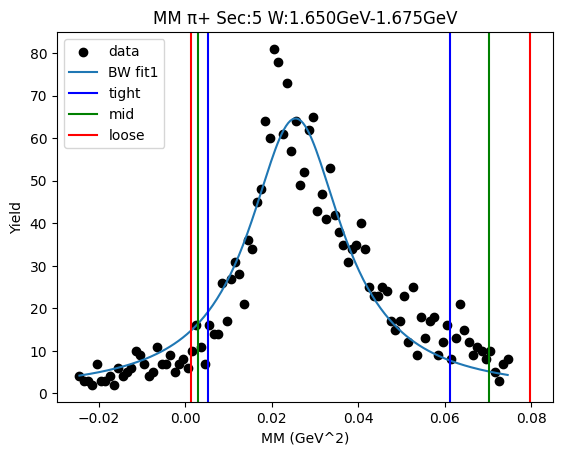

W bin: 11 1.675GeV-1.700GeV
Cut Bounds [[0.00498582 0.00282069 0.00126807]
 [0.06032526 0.06922802 0.07874329]]
Cut Bounds Err [[1.55159449e-06 1.39800073e-06 1.09241613e-06]
 [5.39708761e-06 6.92580954e-06 8.60840501e-06]]


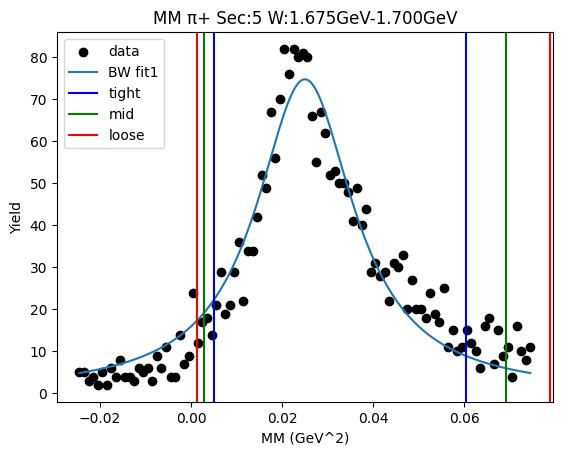

W bin: 12 1.700GeV-1.725GeV
Cut Bounds [[0.00585865 0.00365667 0.00197127]
 [0.05629045 0.06417483 0.07257579]]
Cut Bounds Err [[1.47995336e-06 1.40051117e-06 1.19836128e-06]
 [4.58739824e-06 5.86713274e-06 7.27127289e-06]]


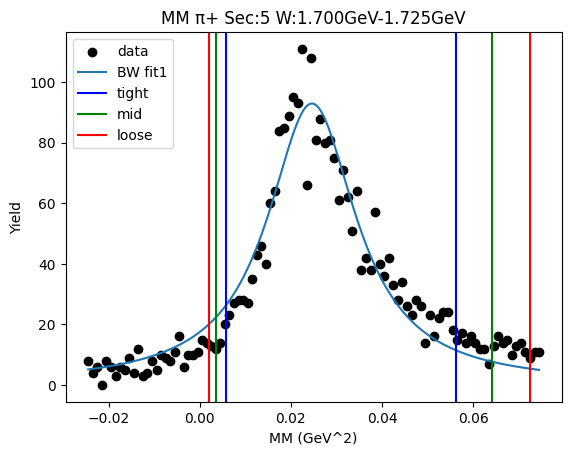

W bin: 13 1.725GeV-1.750GeV
Cut Bounds [[0.00684123 0.00454341 0.00271419]
 [0.05559273 0.06304521 0.07096629]]
Cut Bounds Err [[1.10025882e-06 1.07399400e-06 9.67375698e-07]
 [3.13643825e-06 4.00071019e-06 4.94653791e-06]]


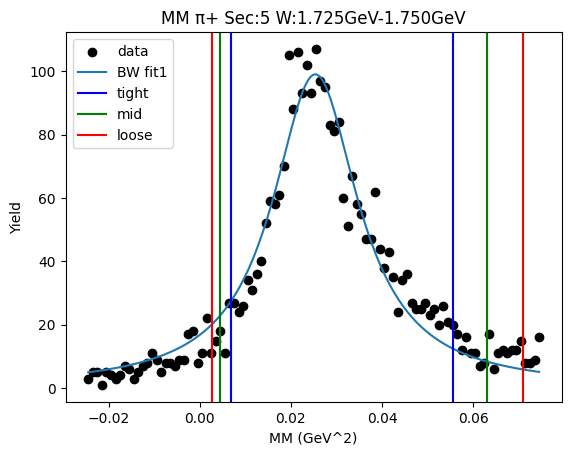

W bin: 14 1.750GeV-1.775GeV
Cut Bounds [[0.00557679 0.00328398 0.00159474]
 [0.06170072 0.0706327  0.08016824]]
Cut Bounds Err [[1.79586726e-06 1.65083117e-06 1.34070669e-06]
 [5.97347815e-06 7.65605520e-06 9.50582501e-06]]


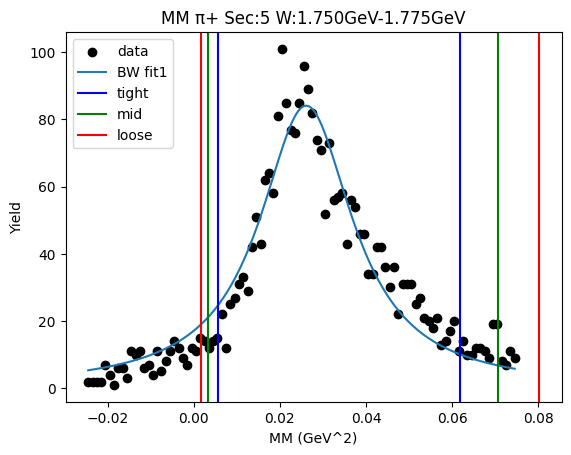

W bin: 15 1.775GeV-1.800GeV
Cut Bounds [[0.0054201  0.00310923 0.00143639]
 [0.06361976 0.07294882 0.0829159 ]]
Cut Bounds Err [[1.93567315e-06 1.75624556e-06 1.39119089e-06]
 [6.63169296e-06 8.50682962e-06 1.05698830e-05]]


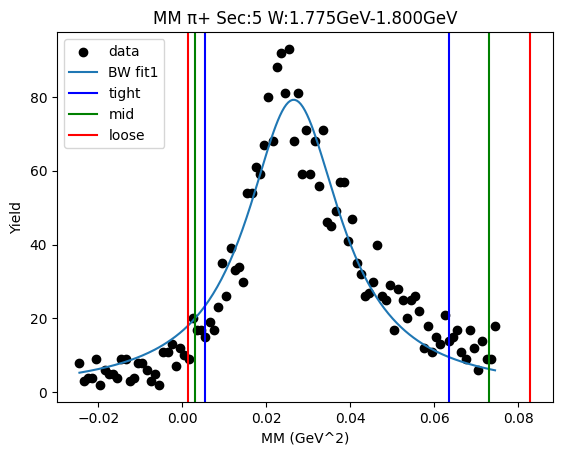

W bin: 16 1.800GeV-1.825GeV
Cut Bounds [[0.00434325 0.00217789 0.00075253]
 [0.06669723 0.07700267 0.08804811]]
Cut Bounds Err [[2.17199263e-06 1.84257135e-06 1.26234424e-06]
 [8.51147974e-06 1.09561920e-05 1.36544695e-05]]


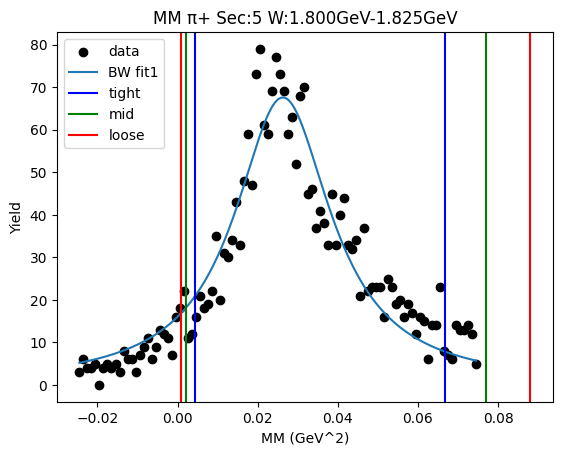

W bin: 17 1.825GeV-1.850GeV
Cut Bounds [[0.00462608 0.00244006 0.00094732]
 [0.06461713 0.07442931 0.08493479]]
Cut Bounds Err [[2.27975249e-06 1.98346137e-06 1.44036414e-06]
 [8.52030164e-06 1.09545839e-05 1.36385109e-05]]


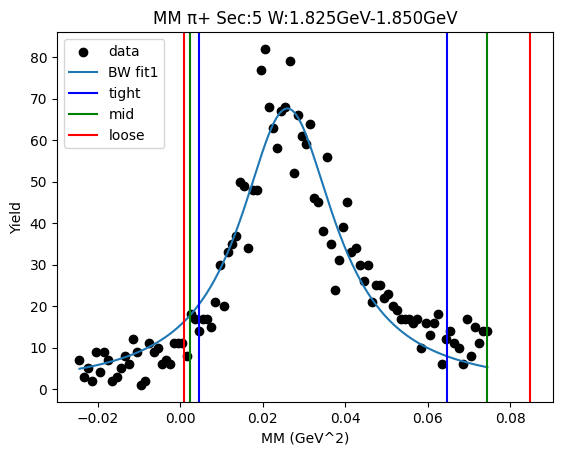

W bin: 18 1.850GeV-1.875GeV
Cut Bounds [[0.00540857 0.00311485 0.00144999]
 [0.06293297 0.07214412 0.08198414]]
Cut Bounds Err [[1.55594577e-06 1.41448700e-06 1.12474327e-06]
 [5.30752624e-06 6.80739048e-06 8.45738138e-06]]


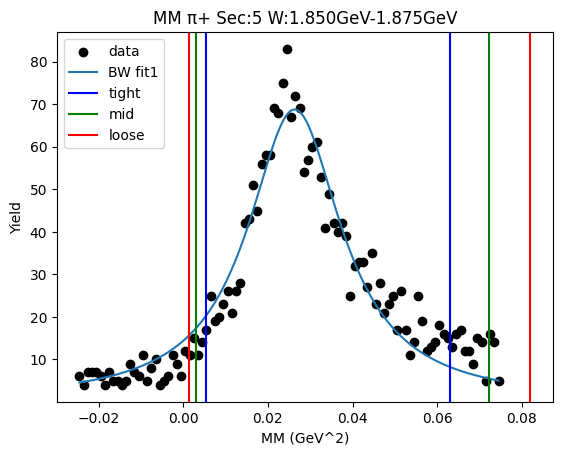

W bin: 19 1.875GeV-1.900GeV
Cut Bounds [[0.00538623 0.00313172 0.00148477]
 [0.06134658 0.07028414 0.07982925]]
Cut Bounds Err [[1.67258286e-06 1.52776671e-06 1.22597302e-06]
 [5.64469280e-06 7.23759066e-06 8.98944741e-06]]


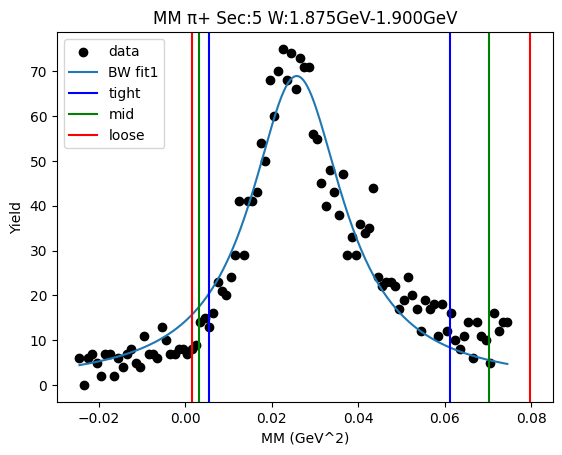

W bin: 20 1.900GeV-1.925GeV
background fit [12.87684459  2.05869755  0.19799003  4.97667652  0.06342851  0.01412691]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.014471614321252092 0.0299995807242031
Breit-Wigner Peak [4.42614331 0.14911605 0.05087233]
Gaus2 [17.61777677  0.03997654  0.02681912]
Gaus3 [1.47351007e+01 3.73363443e-02 4.50073667e-03]
Cut Bounds [[0.00902434 0.00708503 0.00538004]
 [0.04130469 0.04582145 0.05057253]]
Cut Bounds Err [[5.71432603e-06 6.07410757e-06 6.17411052e-06]
 [1.22252256e-05 1.54470628e-05 1.89294946e-05]]


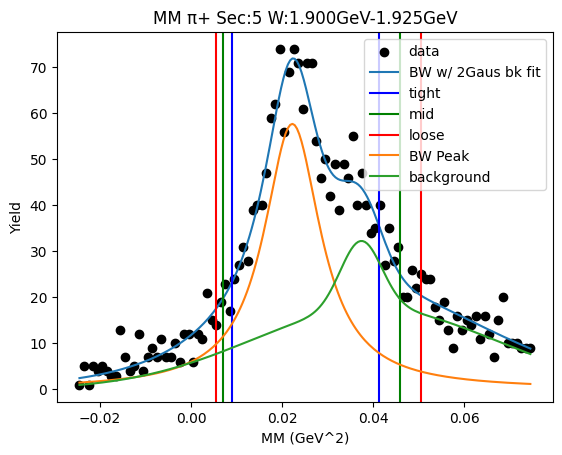

W bin: 21 1.925GeV-1.950GeV
Runtime Error2.2
	Just skip it for now
Cut Bounds [[0.00401273 0.00188438 0.00055097]
 [0.06901811 0.07989083 0.0915585 ]]
Cut Bounds Err [[2.66951695e-06 2.19163070e-06 1.38122550e-06]
 [1.10711824e-05 1.42702448e-05 1.78053030e-05]]


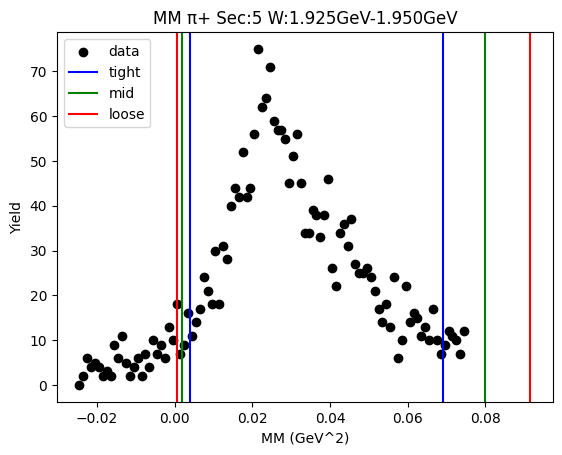

W bin: 22 1.950GeV-1.975GeV
background fit [8.80371971 8.10210256 0.37153831 4.57462995 0.06336141 0.01044118]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.004221358677611073 0.0435236976700967
Breit-Wigner Peak [6.40181957 0.15450737 0.08093448]
Gaus2 [10.02654941  8.97869454  0.25335526]
Gaus3 [9.31000255 0.05259312 0.0241723 ]
Cut Bounds [[0.0046795  0.00262008 0.00115373]
 [0.05789215 0.06647527 0.07565145]]
Cut Bounds Err [[2.85756171e-05 2.56578438e-05 1.98633859e-05]
 [1.00509194e-04 1.29238692e-04 1.60845556e-04]]


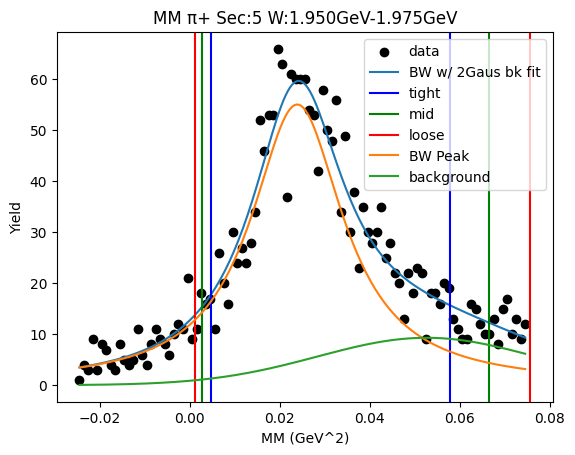

W bin: 23 1.975GeV-2.000GeV
background fit [6.35536211e+00 2.71129826e+01 3.64767039e+00 5.84216660e+00
 6.49577061e-02 9.92372132e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.005946860485437088 0.041853109802314256
Breit-Wigner Peak [5.57847158 0.1545962  0.07735874]
Gaus2 [121.41702535  65.42582227   1.73416564]
Gaus3 [11.67055987  0.04818213  0.01942458]
Cut Bounds [[0.00522724 0.00311815 0.00155087]
 [0.05611817 0.06418726 0.07279816]]
Cut Bounds Err [[4.36924724e-06 4.04393369e-06 3.32452743e-06]
 [1.43160124e-05 1.83476405e-05 2.27773294e-05]]


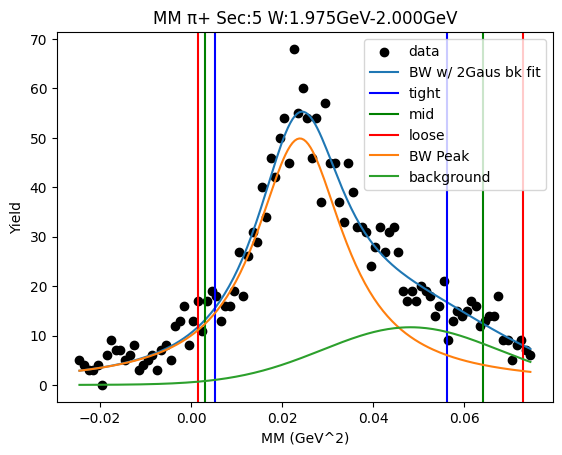

W bin: 24 2.000GeV-2.025GeV
background fit [1.21392819e+02 4.71765876e+01 7.56208734e+00 6.46899293e+00
 6.04642491e-02 9.08700094e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.00844459102328255 0.0389738119347134
Breit-Wigner Peak [5.56789657 0.15397793 0.07133164]
Gaus2 [23.45788486 77.54951519  7.3595125 ]
Gaus3 [11.20899252  0.05067325  0.01957474]
Cut Bounds [[0.00609855 0.00395845 0.00227904]
 [0.05283684 0.06004441 0.06771265]]
Cut Bounds Err [[3.24682371e-06 3.13497298e-06 2.77305217e-06]
 [9.55683131e-06 1.22097630e-05 1.51153025e-05]]


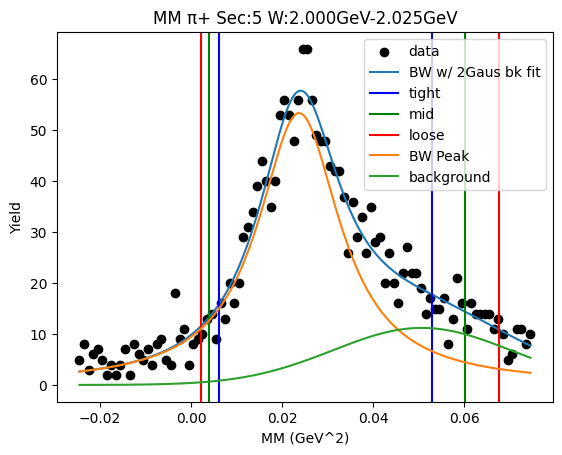

W bin: 25 2.025GeV-2.050GeV
background fit [2.34578849e+01 1.72996653e+02 6.74072012e+00 2.78943388e+00
 6.14661080e-02 9.84344479e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0021942968472901184 0.046194200511734715
Breit-Wigner Peak [5.53480828 0.15554501 0.08563479]
Gaus2 [  5.46028118 448.68873174  90.72765409]
Gaus3 [8.63539248 0.04769269 0.02280019]
Cut Bounds [[0.00415305 0.00213666 0.00078421]
 [0.06083417 0.07015401 0.08013779]]
Cut Bounds Err [[6.72279670e-05 5.78645171e-05 4.08984982e-05]
 [2.57300236e-04 3.31566829e-04 4.13436316e-04]]


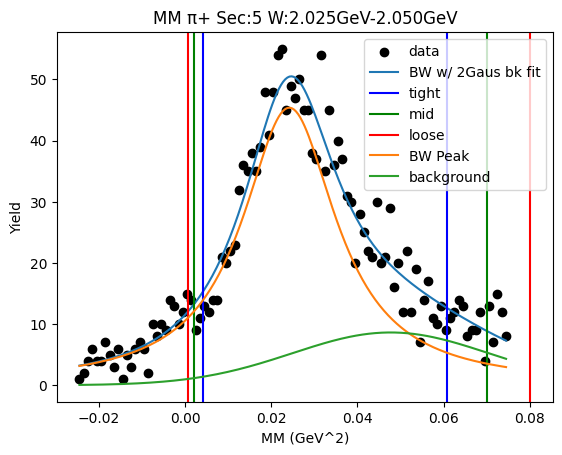

W bin: 26 2.050GeV-2.075GeV
background fit [3.14066116e+00 1.34826706e+03 2.67503391e+01 4.52380668e+00
 6.61286257e-02 1.10477979e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.004183907300749357 0.04382308499290254
Breit-Wigner Peak [4.92611852 0.15493062 0.08128056]
Gaus2 [1226.71604131  783.07796616   81.48708993]
Gaus3 [10.50731879  0.04677501  0.02219952]
Cut Bounds [[0.00468704 0.00261818 0.00114748]
 [0.05827362 0.06692209 0.0761687 ]]
Cut Bounds Err [[2.93906410e-05 2.63585288e-05 2.03576723e-05]
 [1.03632480e-04 1.33261830e-04 1.65860884e-04]]


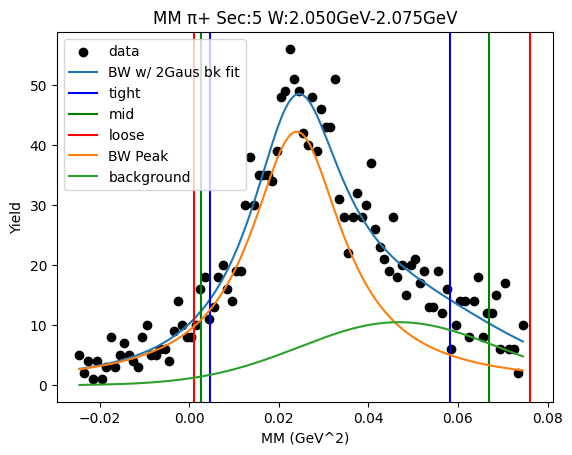

W bin: 27 2.075GeV-2.100GeV
background fit [5.62440314e+02 2.96384618e+03 5.86673562e+01 9.05699342e+00
 5.23603457e-02 3.68930835e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.006857953993586581 0.03919577758929026
Breit-Wigner Peak [5.28167709 0.15174606 0.07341415]
Gaus2 [7.33524547e+03 2.21110927e+04 5.30585717e-02]
Gaus3 [13.80123282  0.04772658  0.01544655]
Cut Bounds [[0.00542372 0.003367   0.00179825]
 [0.05282928 0.06025368 0.06816604]]
Cut Bounds Err [[2.90481334e-06 2.71979402e-06 2.30511058e-06]
 [9.06581854e-06 1.15055176e-05 1.41922154e-05]]


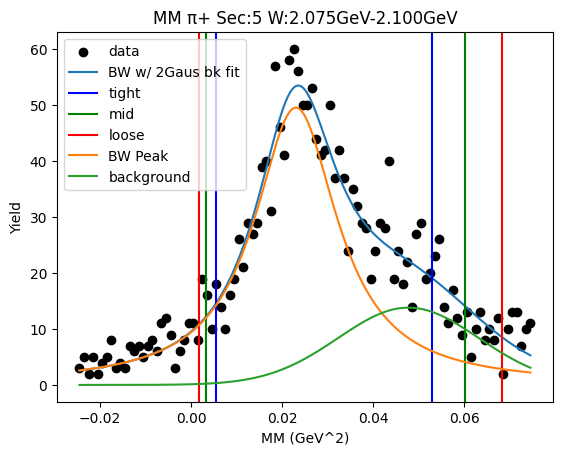

W bin: 28 2.100GeV-2.125GeV
background fit [5.31053147e+03 8.88136350e+04 3.66375269e+03 4.09987224e+00
 6.50984463e-02 8.07205400e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.0009260131369737377 0.04995684524722742
Breit-Wigner Peak [5.79785186 0.156574   0.0920895 ]
Gaus2 [ 10452.18873002 251489.4349234    7125.02770242]
Gaus3 [7.57656075 0.05008635 0.02125484]
Cut Bounds [[0.00343471 0.00152201 0.00037711]
 [0.0647914  0.07515003 0.08627647]]
Cut Bounds Err [[6.06466955e-06 4.83293131e-06 2.80256029e-06]
 [2.63402860e-05 3.39599195e-05 4.23901499e-05]]


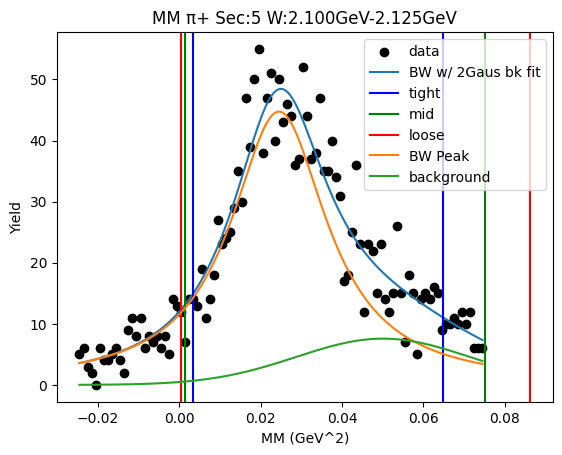

Value Error1.1
	Just skip it for now


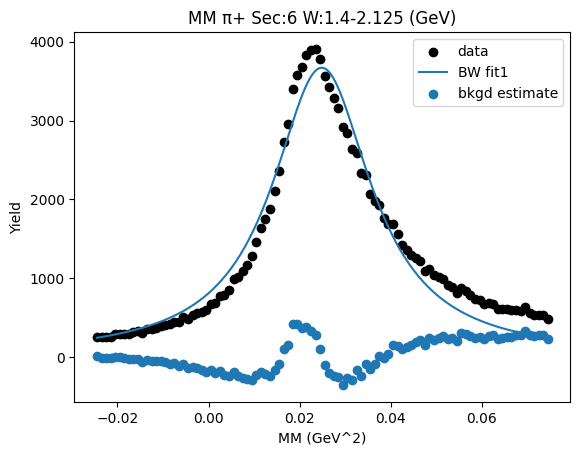

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.01026584 0.00819462 0.00635652]
 [0.04379976 0.04843532 0.05330401]]
Cut Bounds Err [[7.38831599e-07 7.90561194e-07 8.11350319e-07]
 [1.52610402e-06 1.92199506e-06 2.34951753e-06]]


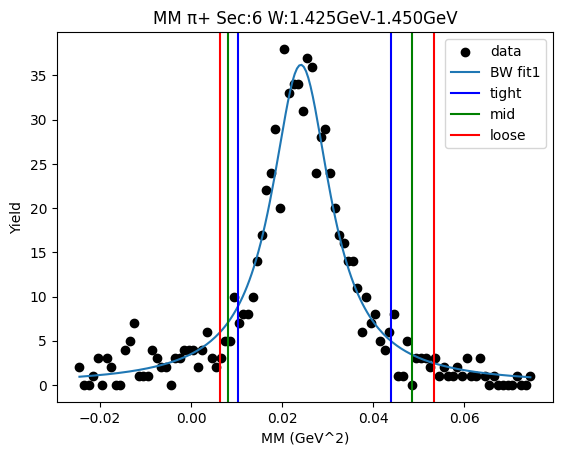

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.00890971 0.00677013 0.00492387]
 [0.04643862 0.05180481 0.05746433]]
Cut Bounds Err [[1.10858603e-06 1.15737311e-06 1.15017694e-06]
 [2.53091260e-06 3.20154774e-06 3.92925781e-06]]


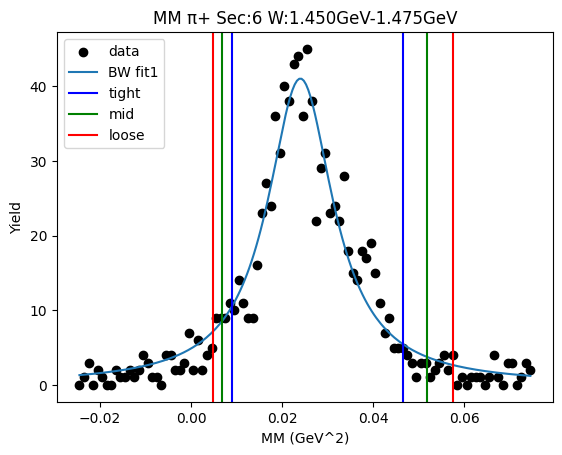

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.00842461 0.00634413 0.0045582 ]
 [0.04542942 0.05074991 0.05636494]]
Cut Bounds Err [[1.35902598e-06 1.41246068e-06 1.39515791e-06]
 [3.15588719e-06 3.99491807e-06 4.90604073e-06]]


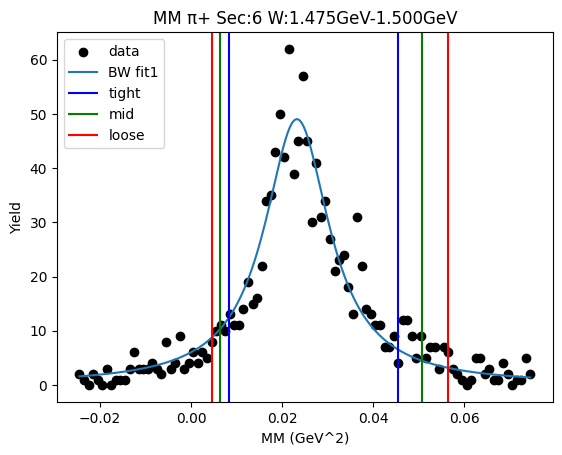

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.00961623 0.00755109 0.00573527]
 [0.04398095 0.04878875 0.05384589]]
Cut Bounds Err [[1.11710070e-06 1.18555364e-06 1.20399146e-06]
 [2.38903329e-06 3.01353586e-06 3.68911855e-06]]


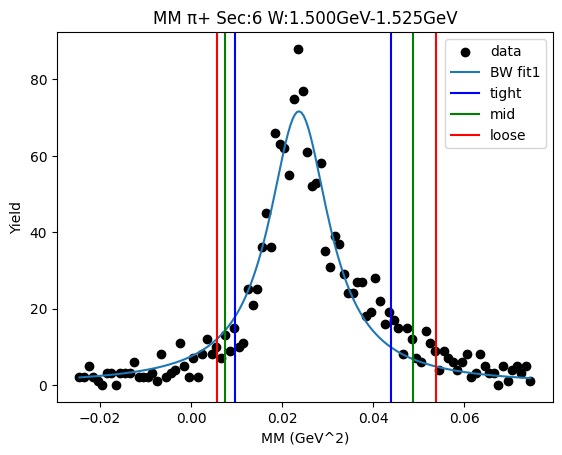

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.00938871 0.00730254 0.00547813]
 [0.04464772 0.04961335 0.05484075]]
Cut Bounds Err [[9.63630966e-07 1.01782778e-06 1.02727181e-06]
 [2.10139385e-06 2.65299676e-06 3.25028020e-06]]


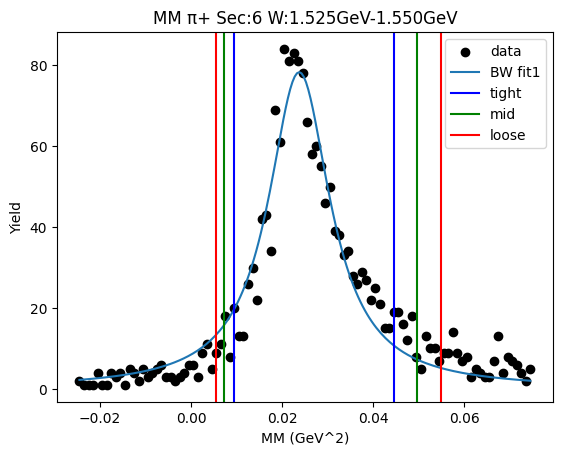

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.00884999 0.00673802 0.00491352]
 [0.04578049 0.05105462 0.05661622]]
Cut Bounds Err [[1.00883774e-06 1.05427020e-06 1.04910166e-06]
 [2.29451153e-06 2.90204011e-06 3.56116236e-06]]


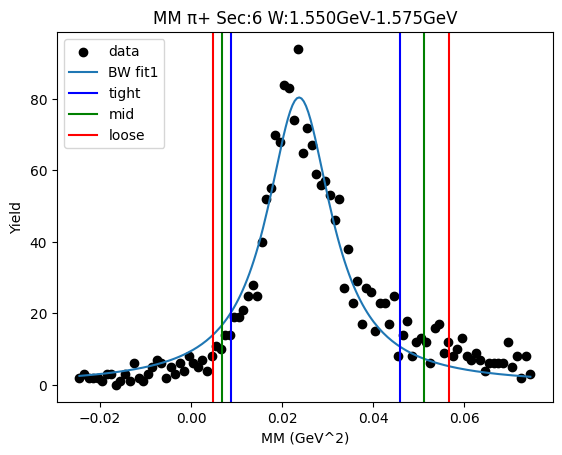

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.008557   0.00640927 0.00457136]
 [0.04707394 0.0526296  0.05849507]]
Cut Bounds Err [[9.94039474e-07 1.03035922e-06 1.01401803e-06]
 [2.33148784e-06 2.95256427e-06 3.62729443e-06]]


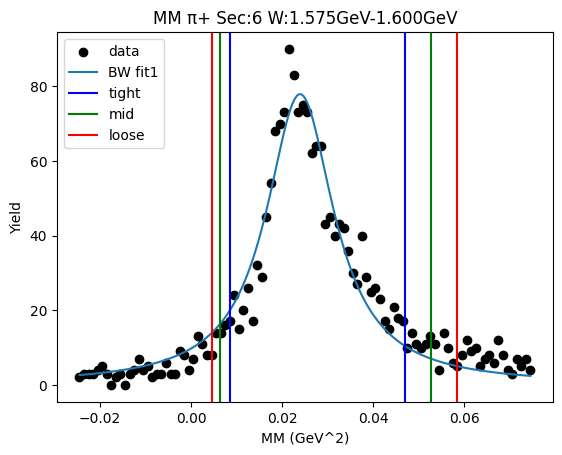

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.00773922 0.00557972 0.00377269]
 [0.04871981 0.05475643 0.06114553]]
Cut Bounds Err [[1.20081761e-06 1.22119990e-06 1.17017665e-06]
 [3.01287687e-06 3.82558739e-06 4.71094578e-06]]


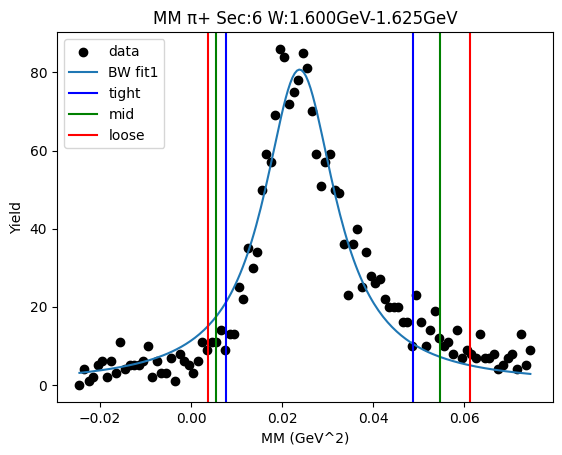

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.00711328 0.00495324 0.00318302]
 [0.05015379 0.05660186 0.06343974]]
Cut Bounds Err [[1.52338938e-06 1.52258609e-06 1.42235361e-06]
 [4.04508675e-06 5.14698067e-06 6.34992729e-06]]


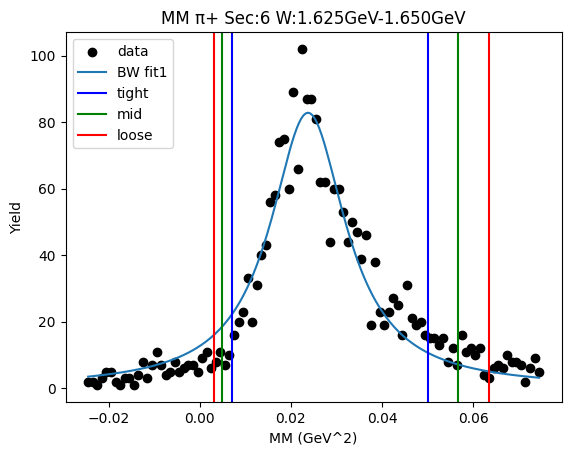

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.00778873 0.00563588 0.00383053]
 [0.04842914 0.05440438 0.06072711]]
Cut Bounds Err [[1.15836033e-06 1.18016326e-06 1.13379607e-06]
 [2.88844340e-06 3.66672290e-06 4.51436747e-06]]


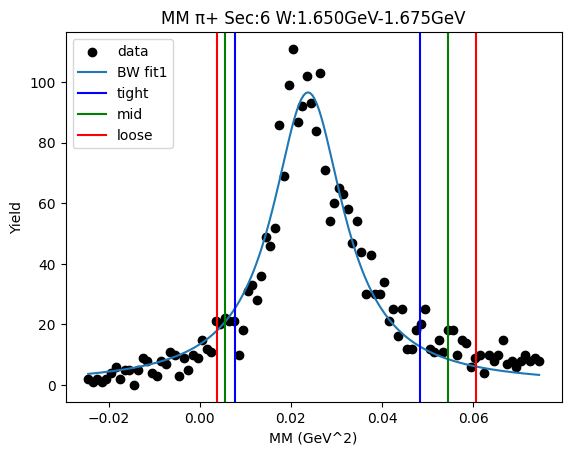

W bin: 11 1.675GeV-1.700GeV
Cut Bounds [[0.00727726 0.00513341 0.0033627 ]
 [0.0492384  0.05548678 0.06210829]]
Cut Bounds Err [[8.63539993e-07 8.68677252e-07 8.19308968e-07]
 [2.24621026e-06 2.85594703e-06 3.52110073e-06]]


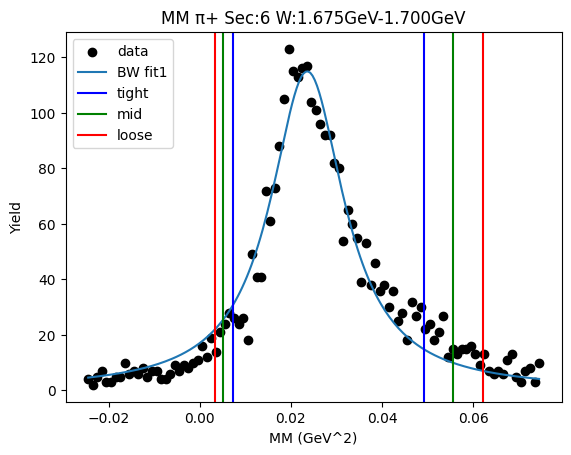

W bin: 12 1.700GeV-1.725GeV
Cut Bounds [[0.00740015 0.00521812 0.00341627]
 [0.05013136 0.05649557 0.06323997]]
Cut Bounds Err [[9.50940933e-07 9.56420945e-07 9.01816427e-07]
 [2.47507250e-06 3.14701928e-06 3.88005213e-06]]


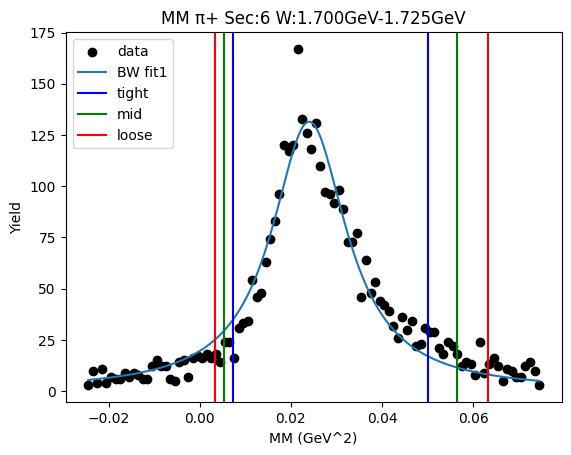

W bin: 13 1.725GeV-1.750GeV
Cut Bounds [[0.00728298 0.00501845 0.00317438]
 [0.05305383 0.05994347 0.06725357]]
Cut Bounds Err [[8.95981650e-07 8.90839475e-07 8.25658381e-07]
 [2.41825985e-06 3.07883039e-06 3.80039564e-06]]


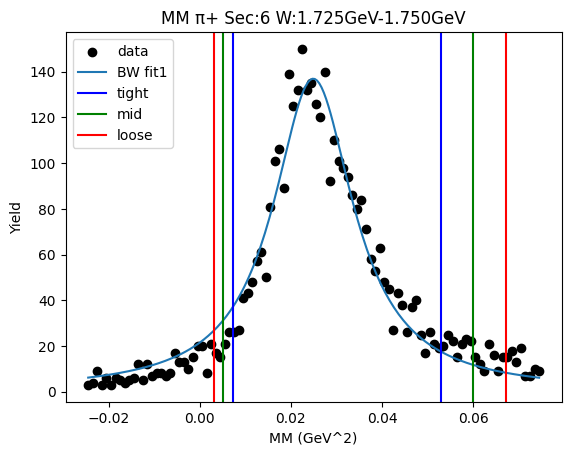

W bin: 14 1.750GeV-1.775GeV
Cut Bounds [[0.00674963 0.00449074 0.00269048]
 [0.05456331 0.06186715 0.06962962]]
Cut Bounds Err [[9.84918080e-07 9.62274508e-07 8.67994366e-07]
 [2.80033771e-06 3.57166056e-06 4.41569851e-06]]


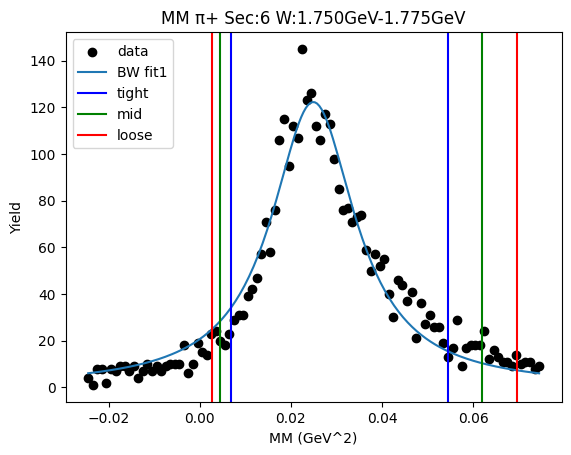

W bin: 15 1.775GeV-1.800GeV
Cut Bounds [[0.00639854 0.00410075 0.00231201]
 [0.0573739  0.06527119 0.07367752]]
Cut Bounds Err [[1.17853324e-06 1.13012683e-06 9.88919311e-07]
 [3.52905749e-06 4.50875264e-06 5.58256691e-06]]


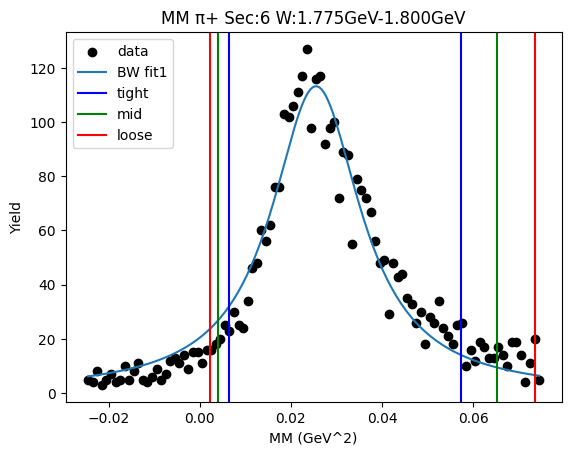

W bin: 16 1.800GeV-1.825GeV
Cut Bounds [[0.00701521 0.00470653 0.00285706]
 [0.05535836 0.06271832 0.07053748]]
Cut Bounds Err [[1.07426814e-06 1.05395946e-06 9.56965030e-07]
 [3.01775582e-06 3.84742979e-06 4.75495405e-06]]


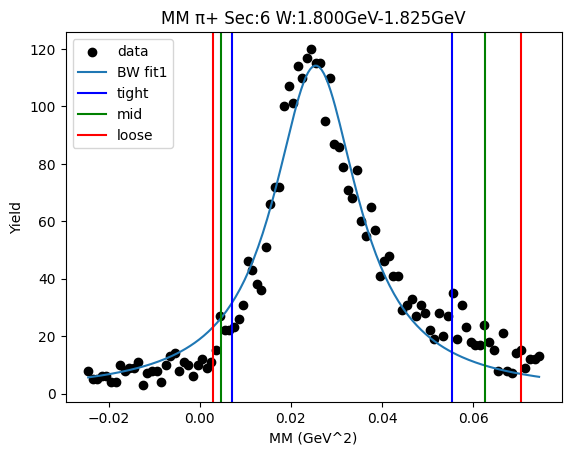

W bin: 17 1.825GeV-1.850GeV
Cut Bounds [[0.00719961 0.00488973 0.0030253 ]
 [0.05479787 0.06200765 0.06966287]]
Cut Bounds Err [[1.31959839e-06 1.30258860e-06 1.19401459e-06]
 [3.64056776e-06 4.63860428e-06 5.72962291e-06]]


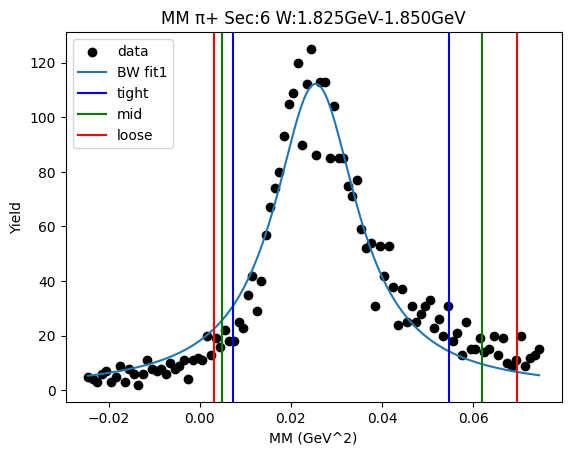

W bin: 18 1.850GeV-1.875GeV
Cut Bounds [[0.00627145 0.00401939 0.00226622]
 [0.05623092 0.06397076 0.07220948]]
Cut Bounds Err [[1.13025076e-06 1.08383100e-06 9.48421358e-07]
 [3.38437504e-06 4.32386584e-06 5.35361614e-06]]


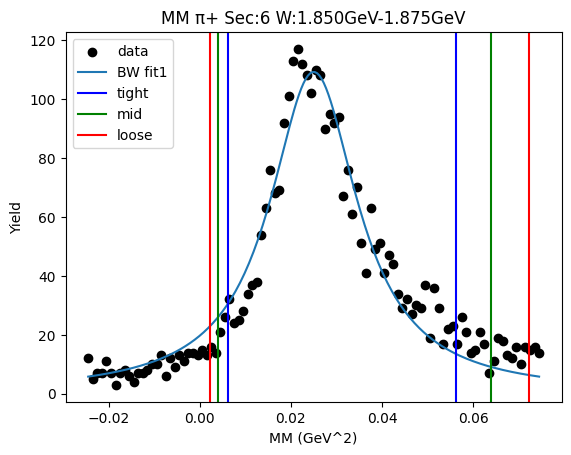

W bin: 19 1.875GeV-1.900GeV
Cut Bounds [[0.00630033 0.00408551 0.0023485 ]
 [0.0547284  0.0621992  0.0701478 ]]
Cut Bounds Err [[1.14433062e-06 1.10376678e-06 9.75246916e-07]
 [3.37268901e-06 4.30672098e-06 5.32998904e-06]]


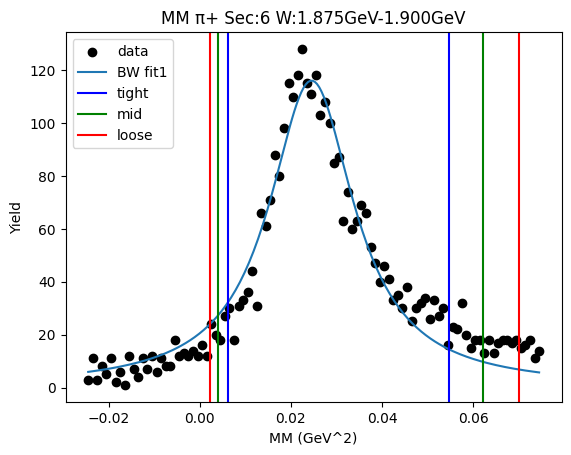

W bin: 20 1.900GeV-1.925GeV
background fit [1.27851169e+01 6.15785416e+01 1.86383037e+00 1.02040316e+01
 8.34931121e-02 2.63653194e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.01250762917657537 0.034627266210519946
Breit-Wigner Peak [9.59923347 0.15351693 0.06071743]
Gaus2 [12.78511688 61.57854158  1.86383037]
Gaus3 [2.02229026e+01 4.14804392e-02 1.85545668e-02]
Cut Bounds [[0.00790746 0.00577681 0.00397993]
 [0.04757195 0.05337419 0.05951021]]
Cut Bounds Err [[9.39945401e-06 9.64035821e-06 9.33521240e-06]
 [2.30547004e-05 2.93031849e-05 3.60979066e-05]]


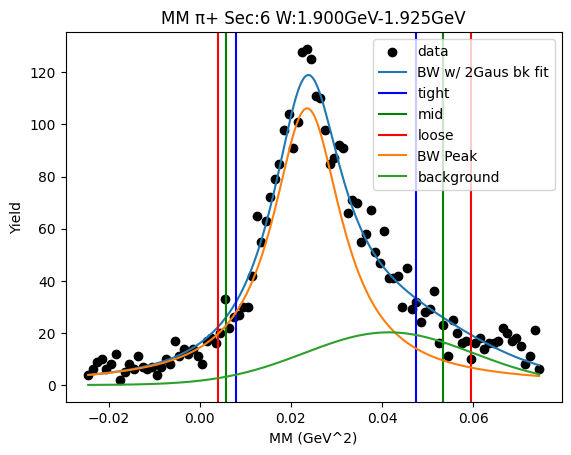

W bin: 21 1.925GeV-1.950GeV
background fit [1.01773346e-03 7.45974253e+02 6.00978092e+00 1.01527708e+01
 5.56062490e-02 8.40431339e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.012862555841934412 0.0347590845753982
Breit-Wigner Peak [8.96490237 0.15430755 0.06041044]
Gaus2 [2356.753244   2819.11785939  237.73695411]
Gaus3 [20.18576633  0.04304804  0.02061593]
Cut Bounds [[0.0081074  0.00595796 0.00413893]
 [0.04777458 0.05355858 0.05967299]]
Cut Bounds Err [[7.42022137e-06 7.63294073e-06 7.42207830e-06]
 [1.80125174e-05 2.28853487e-05 2.81818912e-05]]


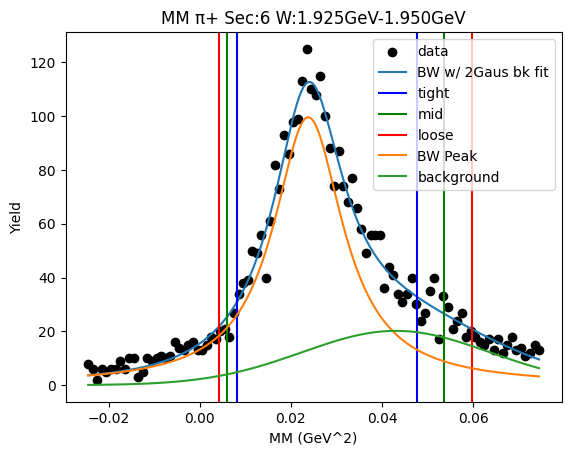

W bin: 22 1.950GeV-1.975GeV
background fit [5.52993333e+03 1.97426192e+04 1.41454246e+03 7.68101603e+00
 5.54482008e-02 1.11245837e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.01306525207994612 0.033939321763946075
Breit-Wigner Peak [8.80609364 0.15330456 0.05898315]
Gaus2 [ 5528.38457606 19743.23761058  1414.53087144]
Gaus3 [2.25006671e+01 4.10136119e-02 1.80154121e-02]
Cut Bounds [[0.00820048 0.00608508 0.00428466]
 [0.04667872 0.05225896 0.05815419]]
Cut Bounds Err [[1.18948556e-05 1.22952223e-05 1.20364309e-05]
 [2.83791170e-05 3.60316069e-05 4.43435065e-05]]


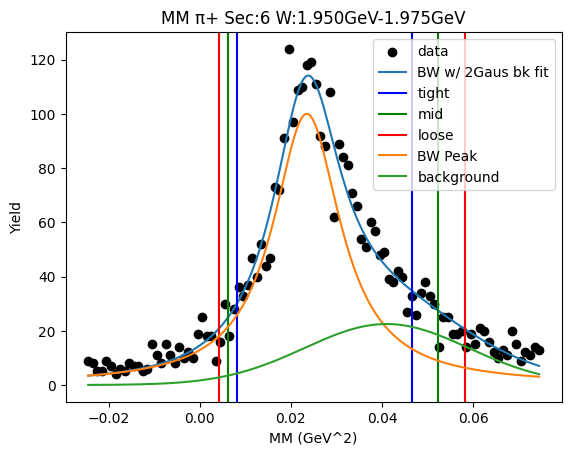

W bin: 23 1.975GeV-2.000GeV
background fit [2.72305049e+01 8.45760854e+04 2.32841229e+02 9.13249199e+00
 6.07297565e-02 1.16315867e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.011983701498358212 0.03510154951273754
Breit-Wigner Peak [9.06011345 0.15343606 0.06207233]
Gaus2 [24137.25792106 63324.48449788  1362.66538938]
Gaus3 [18.01093422  0.04573618  0.02008834]
Cut Bounds [[0.00763905 0.00550487 0.00371952]
 [0.04816728 0.05413874 0.06045905]]
Cut Bounds Err [[1.02561181e-05 1.04472367e-05 1.00186363e-05]
 [2.57536852e-05 3.27628853e-05 4.03920176e-05]]


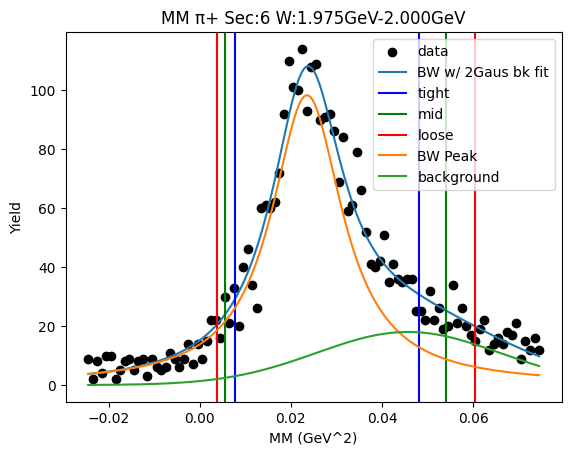

W bin: 24 2.000GeV-2.025GeV
background fit [1.27354836e+02 1.12646506e+05 1.02663680e+04 9.32769523e+00
 7.02212566e-02 1.40680339e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.009178377300761703 0.04042827794445557
Breit-Wigner Peak [9.72922055 0.15749072 0.07216867]
Gaus2 [ 75846.12338643 196369.28991446  13896.24949991]
Gaus3 [10.94272803  0.05906749  0.02388707]
Cut Bounds [[0.006515   0.004272   0.00250055]
 [0.05488051 0.06231061 0.07021227]]
Cut Bounds Err [[7.31711964e-06 7.10891373e-06 6.34462656e-06]
 [2.12369462e-05 2.71499382e-05 3.36197935e-05]]


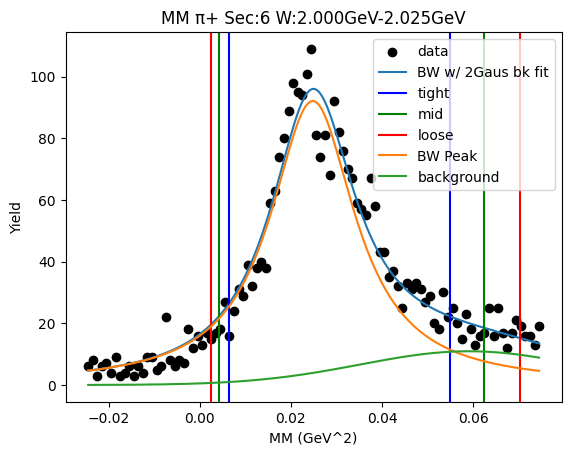

W bin: 25 2.025GeV-2.050GeV
background fit [7.58461234e+04 1.13081028e+05 1.24177266e+03 7.87051898e+00
 6.54503002e-02 1.41123001e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.005688307220291396 0.04179596803972589
Breit-Wigner Peak [9.61116243 0.15408484 0.07757541]
Gaus2 [   145.02874709 124709.78784151    765.11887029]
Gaus3 [10.02046648  0.0561755   0.02227012]
Cut Bounds [[0.00512052 0.00303077 0.00148587]
 [0.05598518 0.06406835 0.07269639]]
Cut Bounds Err [[3.94186654e-06 3.63565947e-06 2.96818599e-06]
 [1.30341100e-05 1.67158577e-05 2.07614137e-05]]


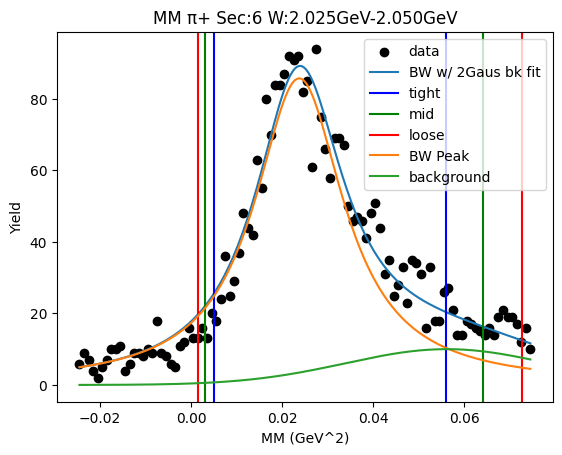

W bin: 26 2.050GeV-2.075GeV
background fit [7.25143735e-01 1.12217134e+05 6.95830115e+02 1.20116600e+01
 7.89727175e-02 1.87730875e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.011923699682587156 0.03648066192597402
Breit-Wigner Peak [8.12096029 0.1555705  0.06397521]
Gaus2 [109259.84182216 132516.1536318   14908.94565175]
Gaus3 [16.99086074  0.04678531  0.02157853]
Cut Bounds [[0.00765831 0.00546121 0.00363468]
 [0.05001003 0.05628328 0.06292709]]
Cut Bounds Err [[1.41464063e-05 1.43348884e-05 1.36434019e-05]
 [3.61499937e-05 4.60192395e-05 5.67686555e-05]]


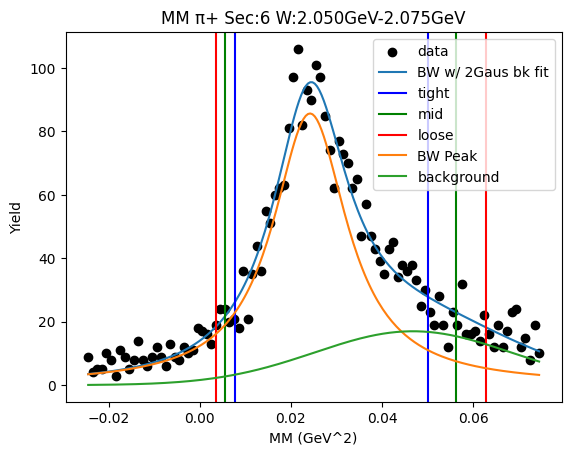

W bin: 27 2.075GeV-2.100GeV
background fit [1.09259842e+05 2.38409370e+05 2.78483190e+04 8.92343515e+00
 6.73169122e-02 1.31492311e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.008776618606086794 0.03673297029864245
Breit-Wigner Peak [7.01938096 0.15084692 0.06825974]
Gaus2 [108653.33073987 184762.13980196  22604.38446518]
Gaus3 [18.73630355  0.04576818  0.02053358]
Cut Bounds [[0.00611996 0.00405856 0.00241902]
 [0.04993601 0.05663782 0.06376148]]
Cut Bounds Err [[1.71339426e-05 1.67428370e-05 1.50798264e-05]
 [4.89429223e-05 6.25455340e-05 7.74205530e-05]]


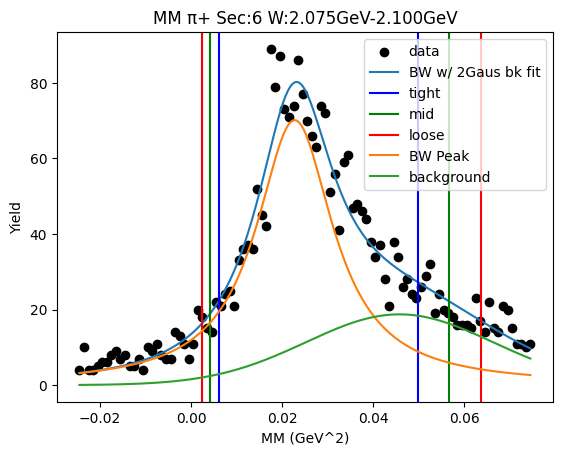

W bin: 28 2.100GeV-2.125GeV
background fit [2.65601397e+04 3.59590871e+05 1.03481934e+04 6.25161611e+00
 6.93891451e-02 1.44002832e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.006246747832204511 0.042653128394259374
Breit-Wigner Peak [8.4952862  0.15636476 0.07789564]
Gaus2 [ 31424.31409505 422746.81588157  35144.89184429]
Gaus3 [10.14497109  0.05328076  0.02148979]
Cut Bounds [[0.00540182 0.00324029 0.00162812]
 [0.05723217 0.06543671 0.07419061]]
Cut Bounds Err [[5.40037093e-06 5.01514982e-06 4.14548534e-06]
 [1.75781721e-05 2.25373509e-05 2.79837882e-05]]


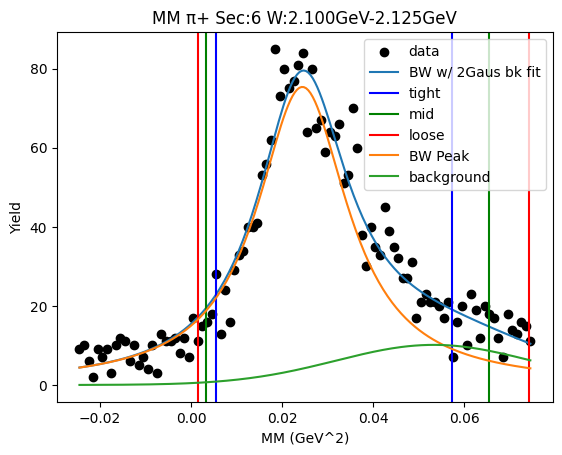

In [8]:
bkgd=True
Wlow_bin = 0
Wbin_bkgd = 20

tight = 2.5
mid = 3
loose = 3.5

a_ini=148
m_ini=0.149
g_ini=0.08
bw_ini = [a_ini,m_ini,g_ini]


gaus2_ini = [500,  0.3, 0.06287]
gaus3_ini = [706, 0.4, 0.2417]
 
bw_ini_w = [0.65, 0.15, 0.035]
gaus2_ini_w = [3.07211428, 0.3, 0.06742853]
gaus3_ini_w = [2.78458923, 0.4, 0.10165907]




# bw_ini_w = [1.01801152, 0.94626145, 0.039624]
# gaus2_ini_w = [3.07211428, 1.01332019, 0.06742853]
# gaus3_ini_w = [2.78458923, 1.26687645, 0.10165907]

bw_bounds = [[0.0,0.0,0.0],[np.inf,np.inf,np.inf]]
full_bounds = [[0.0,0.0,0.0,0.0,0.03,0.0,0.0,0.03,0.0],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf]]

bkgd_bounds = [[0.0,0.03,0.0,0.0,0.03,0.0],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf]]

bw_pars = np.zeros((6,_W_bins_+1,3))
gaus2_pars = np.zeros((6,_W_bins_+1,3))
gaus3_pars = np.zeros((6,_W_bins_+1,3))

bkgd_guess_pars = np.zeros((6,_W_bins_+1,6))


ini_pars= np.zeros(9)
for i in range(3):
    ini_pars[i] = bw_ini[i]
    ini_pars[i+3] = gaus2_ini[i]
    ini_pars[i+6] = gaus3_ini[i]

    #sec W low, high, tight, mid, loose
cut_bounds = np.zeros((6,_W_bins_+1,2,3))
cut_bounds_err = np.zeros((6,_W_bins_+1,2,3))

bw_ini_w1 = np.zeros(3)
    
for sec in range(6):
    x_r=Center_Xbins(hist_name[sec][1])
    y_r=Values_1d(hist_name[sec][1])
    plt.scatter(x_r,y_r,color='k',label='data')
    plt.title("MM {} Sec:{} W:{}-{} (GeV)".format(Particle,sec+1,_W_min_,_W_max_))
    plt.xlabel("MM (GeV^2)")
    plt.ylabel("Yield")
   
    try:
        bw_ini[0] = np.max(y_r)
        bw_ini[1] = x_r[np.argmax(y_r)]
        pars_r1, pars_cov_r1 = op.curve_fit(BW_e2,x_r,y_r,p0=bw_ini,maxfev=5000,bounds=bw_bounds)
        tmp_x1 = np.linspace(x_r[0],x_r[len(x_r)-1],200)
        plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_r1),label="BW fit1")
        tmp_y_r = [y_r[i]-BW_e2(x_r[i],*pars_r1) for i in range(len(y_r))]
        plt.scatter(x_r,tmp_y_r,label="bkgd estimate")
        
        try:
            bkgd_guess_pars[sec][_W_bins_][0] = tmp_y_r[50]
            bkgd_guess_pars[sec][_W_bins_][1] = x_r[50]
            bkgd_guess_pars[sec][_W_bins_][2] = 0.05
            bkgd_guess_pars[sec][_W_bins_][3] = tmp_y_r[90]
            bkgd_guess_pars[sec][_W_bins_][4] = x_r[90]
            bkgd_guess_pars[sec][_W_bins_][5] = 0.3
            
            bkgd_full_pars, bkgd_full_pars_cov = op.curve_fit(Gaus2,x_r,tmp_y_r,p0=bkgd_guess_pars[sec][_W_bins_],maxfev=5000,bounds=bkgd_bounds)
            
            plt.plot(tmp_x1,Gaus2(tmp_x1,*bkgd_full_pars),label="bkgd fit")
            try:
                r1_ini_pars = np.zeros(9)

                for i in range(3):
                    r1_ini_pars[i] = pars_r1[i]
                    r1_ini_pars[i+3] = gaus2_ini[i]
                    r1_ini_pars[i+6] = gaus3_ini[i]
                #r1_ini[0] = np.max(y_r)
                #r1_ini[1] - x_r[np.argmax(y_r)]
                pars_r2, pars_cov_r2 = op.curve_fit(BW_e2_Gaus2,x_r,y_r,p0=r1_ini_pars,maxfev=5000)
                plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*pars_r2),label="BW w/ 2Gaus bk fit")
                r1_bkgd_pars = np.zeros(6)
                for i in range(3):
                    bw_pars[sec][_W_bins_][i] = pars_r2[i]
                    r1_bkgd_pars[i] = pars_r2[i+3]
                    r1_bkgd_pars[i+3] = pars_r2[i+6]
                    gaus2_pars[sec][_W_bins_][i] = pars_r2[i+3]
                    gaus3_pars[sec][_W_bins_][i] = pars_r2[i+6]
                for i in range(3):
                    for j in range(2):
                        cut_bounds[sec][_W_bins_][j][i] = (pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35)*(pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35)
                        cut_bounds_err[sec][_W_bins_][j][i] = np.sqrt((2*(pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35))**2 + ((2*sign2[j]*cut_sig[i]/2.35)*(pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35))**2)
                        if j==0:
                            plt.axvline(x=cut_bounds[sec][_W_bins_][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                        else:
                            plt.axvline(x=cut_bounds[sec][_W_bins_][j][i],color=color_order[i])

    #                 cut_bounds[sec][_W_bins_][0][0] = (pars_r2[1]-tight*pars_r2[2]/2.35)*(pars_r2[1]-tight*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][0][1] = (pars_r2[1]-mid*pars_r2[2]/2.35)*(pars_r2[1]-mid*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][0][2] = (pars_r2[1]-loose*pars_r2[2]/2.35)*(pars_r2[1]-loose*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][1][0] = (pars_r2[1]+tight*pars_r2[2]/2.35)*(pars_r2[1]+tight*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][1][1] = (pars_r2[1]+mid*pars_r2[2]/2.35)*(pars_r2[1]+mid*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][1][2] = (pars_r2[1]+loose*pars_r2[2]/2.35)*(pars_r2[1]+loose*pars_r2[2]/2.35)
                plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][_W_bins_]),label="BW Peak")
                plt.plot(tmp_x1,Gaus2(tmp_x1,*r1_bkgd_pars),label="background")

    #             plt.axvline(x=cut_bounds[sec][_W_bins_][0][0],label="tight -{}\u03C3".format(tight))
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][1][0],label="tight +{}\u03C3".format(tight))
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][0][1],label="mid -{}\u03C3".format(mid),color='g')
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][1][1],label="mid +{}\u03C3".format(mid),color='g')
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][0][2],label="loose -{}\u03C3".format(loose),color='r')
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][1][2],label="loose +{}\u03C3".format(loose),color='r')
                print(pars_r2[1]*pars_r2[1]-3*pars_r2[2]*pars_r2[2],pars_r2[1]*pars_r2[1]+3*pars_r2[2]*pars_r2[2])
                print("Breit-Wigner Peak",bw_pars[sec][_W_bins_])
                print("Gaus2",gaus2_pars[sec][_W_bins_])
                print("Gaus3",gaus3_pars[sec][_W_bins_])
            except RuntimeError:
                print("Runtime Error1.2\n\tJust skip it for now")
            except ValueError:
                print("Value Error1.2\n\tJust skip it for now")
        except RuntimeError:
            print("Runtime Error1.1\n\tJust skip it for now")
        except ValueError:
            print("Value Error1.1\n\tJust skip it for now")
    except RuntimeError:
        print("Runtime Error1.0\n\tJust skip it for now")
    except ValueError:
        print("Value Error1.0\n\tJust skip it for now")
    plt.legend()
    plt.show()
    for Wbin in range(_W_bins_):
        if Wbin > Wlow_bin:
            print("W bin:",Wbin,W_Bin_PlotName[Wbin])
            x_w=Center_Xbins(hist_name[sec][0][Wbin])
            y_w=Values_1d(hist_name[sec][0][Wbin])
            plt.scatter(x_w,y_w,color='k',label='data')
            plt.title("MM {} Sec:{} W:{}".format(Particle,sec+1,W_Bin_PlotName[Wbin]))
            plt.xlabel("MM (GeV^2)")
            plt.ylabel("Yield")
            try:
                for j in range(3):
                    if Wbin > 0 and bw_pars[sec][Wbin-1][j]!=0:
                        for i in range(3):
                            bw_ini_w1[i] = bw_pars[sec][Wbin-1][i]
                    else:
                        for i in range(3):
                            bw_ini_w1[i] = bw_ini_w[i]
                bw_ini_w1[0] = np.max(y_w)
                bw_ini_w1[1] = x_r[np.argmax(y_w)]
                pars_w1, pars_cov_w1 = op.curve_fit(BW_e2,x_w,y_w,p0=bw_ini_w1,maxfev=5000,bounds=bw_bounds)
                #tmp_x_w1 = np.linspace(x_w[0],x_w[len(x_w)-1],200)
                #plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_w1),label="BW fit1")
                #print("initial bw fit: ",pars_w1)
                if Wbin >= Wbin_bkgd:
                    tmp_y_w = [y_w[i]-BW_e2(x_w[i],*pars_w1) for i in range(len(y_w))]
                    bkgd_fit_x = Bounds_on_Y(x_w,0.03,0.07)
                    bkgd_fit_y = Bounds_on_X_From_Y(tmp_y_w,x_w,0.03,0.07)
                    #plt.scatter(bkgd_fit_x,bkgd_fit_y,label="bkgd estimate")
                    if gaus2_pars[sec][Wbin-1][0] ==0:
                        bkgd_guess_pars[sec][Wbin][0] = np.max(bkgd_fit_y)
                        bkgd_guess_pars[sec][Wbin][1] = 1.0
                        bkgd_guess_pars[sec][Wbin][2] = 0.06
                        bkgd_guess_pars[sec][Wbin][3] = tmp_y_w[80]
                        bkgd_guess_pars[sec][Wbin][4] = 1.4
                        bkgd_guess_pars[sec][Wbin][5] = 0.2
                    else:
                        bkgd_guess_pars[sec][Wbin][0] = gaus2_pars[sec][Wbin-1][0]
                        bkgd_guess_pars[sec][Wbin][1] = gaus2_pars[sec][Wbin-1][1]
                        bkgd_guess_pars[sec][Wbin][2] = gaus2_pars[sec][Wbin-1][2]
                        bkgd_guess_pars[sec][Wbin][3] = gaus3_pars[sec][Wbin-1][0]
                        bkgd_guess_pars[sec][Wbin][4] = gaus3_pars[sec][Wbin-1][1]
                        bkgd_guess_pars[sec][Wbin][5] = gaus3_pars[sec][Wbin-1][2]
                    
                    
                    
                    #plt.plot(tmp_x1,Gaus2(tmp_x1,*bkgd_guess_pars[sec][Wbin]),label="bkgd guess")
                    try:
                        
                        
                        
                        
                        
                        
                        
                        bkgd_pars_w, bkgd_pars_cov_w = op.curve_fit(Gaus2,bkgd_fit_x,bkgd_fit_y,p0=bkgd_guess_pars[sec][Wbin],bounds=bkgd_bounds)
                        #plt.plot(tmp_x1,Gaus2(tmp_x1,*bkgd_pars_w),label="bkgd fit1")
                        print("background fit",bkgd_pars_w)
                        try:
                            w1_ini_pars = np.zeros(9)

                            for i in range(3):
                                w1_ini_pars[i] = pars_w1[i]
                                if Wbin > 0:
                                    if gaus2_pars[sec][Wbin-1][i] != 0.0:
                                        w1_ini_pars[i+3] = gaus2_pars[sec][Wbin-1][i]
                                        w1_ini_pars[i+6] = gaus3_pars[sec][Wbin-1][i]
                                    else:
                                        w1_ini_pars[i+3] = gaus2_ini_w[i]
                                        w1_ini_pars[i+6] = gaus3_ini_w[i]
                                else:
                                    w1_ini_pars[i+3] = gaus2_ini_w[i]
                                    w1_ini_pars[i+6] = gaus3_ini_w[i]
                           # print("w1_ini_pars:",w1_ini_pars)
                            #w1_ini_pars[0] = np.max(y_w)
                            #w1_ini_pars[1] = x_r[np.argmax(y_w)]
                            for i in range(6):
                                w1_ini_pars[i+3] = bkgd_pars_w[i]
#                             w1_ini_pars[4] = x_w[50]
#                             w1_ini_pars[6] = y_w[90]
#                             w1_ini_pars[7] = x_w[90]
                            #print("post W1_ini_pars",w1_ini_pars)
#                             print(x_w)
#                             print(y_w)
                            #plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*w1_ini_pars),label="Guess on the 2 gaus bkgd")
                            #plt.scatter(x_w,y_w,color='c',label='data again')
                            print(full_bounds)
                            pars_w2, pars_cov_w2 = op.curve_fit(BW_e2_Gaus2,x_w,y_w,p0=w1_ini_pars,maxfev=50000,bounds=full_bounds)
                            plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*pars_w2),label="BW w/ 2Gaus bk fit")
                            
                            w1_bkgd_pars = np.zeros(6)
                            for i in range(3):
                                bw_pars[sec][Wbin][i] = pars_w2[i]
                                w1_bkgd_pars[i] = pars_w2[i+3]
                                w1_bkgd_pars[i+3] = pars_w2[i+6]
                                gaus2_pars[sec][Wbin][i] = pars_w2[i+3]
                                gaus3_pars[sec][Wbin][i] = pars_w2[i+6]
                            for i in range(3):
                                for j in range(2):
                                    cut_bounds[sec][Wbin][j][i] = (pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35)*(pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35)
                                    cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w2[1][1]*2*(pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35))**2 + (pars_cov_w2[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35))**2)
                                    if j==0:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                    else:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
    #                             cut_bounds[sec][Wbin][0][0] = (pars_w2[1]-tight*pars_w2[2]/2.35)*(pars_w2[1]-tight*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][0][1] = (pars_w2[1]-mid*pars_w2[2]/2.35)*(pars_w2[1]-mid*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][0][2] = (pars_w2[1]-loose*pars_w2[2]/2.35)*(pars_r2[1]-loose*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][1][0] = (pars_w2[1]+tight*pars_w2[2]/2.35)*(pars_r2[1]+tight*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][1][1] = (pars_w2[1]+mid*pars_w2[2]/2.35)*(pars_r2[1]+mid*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][1][2] = (pars_w2[1]+loose*pars_w2[2]/2.35)*(pars_r2[1]+loose*pars_w2[2]/2.35)
                            plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][Wbin]),label="BW Peak")
                            plt.plot(tmp_x1,Gaus2(tmp_x1,*w1_bkgd_pars),label="background")

                            print(pars_w2[1]*pars_w2[1]-3*pars_w2[2]*pars_w2[2],pars_w2[1]*pars_w2[1]+3*pars_w2[2]*pars_w2[2])
                            print("Breit-Wigner Peak",bw_pars[sec][Wbin])
                            print("Gaus2",gaus2_pars[sec][Wbin])
                            print("Gaus3",gaus3_pars[sec][Wbin])
                        except RuntimeError:
                            print("Runtime Error2.1\n\tJust skip it for now")
                            for i in range(3):
                                bw_pars[sec][Wbin][i] = pars_w1[i]
                            for i in range(3):
                                for j in range(2):
                                    cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                    cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                    if j==0:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                    else:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                        except ValueError:
                            print("Value Error2.1\n\tJust skip it for now")
                            for i in range(3):
                                bw_pars[sec][Wbin][i] = pars_w1[i]
                            for i in range(3):
                                for j in range(2):
                                    cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                    cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*2*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                    if j==0:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                    else:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                    except RuntimeError:
                        print("Runtime Error2.2\n\tJust skip it for now")
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w1[i]
                        for i in range(3):
                            for j in range(2):
                                cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*2*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                if j==0:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                else:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                    except ValueError:
                        print("Value Error2.2\n\tJust skip it for now")
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w1[i]
                        for i in range(3):
                            for j in range(2):
                                cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                cut_bounds_err[sec][Wbin][j][i] = np.sqrt((2*(pars_cov_w1[1][1]*pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                if j==0:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                else:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                else:
                    plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_w1),label="BW fit1")
                    for i in range(3):
                        bw_pars[sec][Wbin][i] = pars_w1[i]
                    for i in range(3):
                        for j in range(2):
                            cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                            cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*2*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)

                            if j==0:
                                plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                            else:
                                plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
#                         cut_bounds[sec][Wbin][0][0] = (pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][0][1] = (pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][0][2] = (pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2]/2.35)*(pars_w1[1]+tight*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2]/2.35)*(pars_w1[1]+mid*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2]/2.35)*(pars_w1[1]+loose*pars_w1[2]/2.35)
#                 plt.axvline(x=cut_bounds[sec][Wbin][0][0],label="tight -{}\u03C3".format(tight))
#                 plt.axvline(x=cut_bounds[sec][Wbin][1][0],label="tight +{}\u03C3".format(tight))
#                 plt.axvline(x=cut_bounds[sec][Wbin][0][1],label="mid -{}\u03C3".format(mid),color='g')
#                 plt.axvline(x=cut_bounds[sec][Wbin][1][1],label="mid +{}\u03C3".format(mid),color='g')
#                 plt.axvline(x=cut_bounds[sec][Wbin][0][2],label="loose -{}\u03C3".format(loose),color='r')
#                 plt.axvline(x=cut_bounds[sec][Wbin][1][2],label="loose +{}\u03C3".format(loose),color='r')
            except RuntimeError:
                print("Runtime Error2.0\n\tJust skip it for now")
                
            except ValueError:
                print("Value Error2.0\n\tJust skip it for now")
            print("Cut Bounds",cut_bounds[sec][Wbin])
            print("Cut Bounds Err",cut_bounds_err[sec][Wbin])
            plt.legend()
            plt.show()
            
            

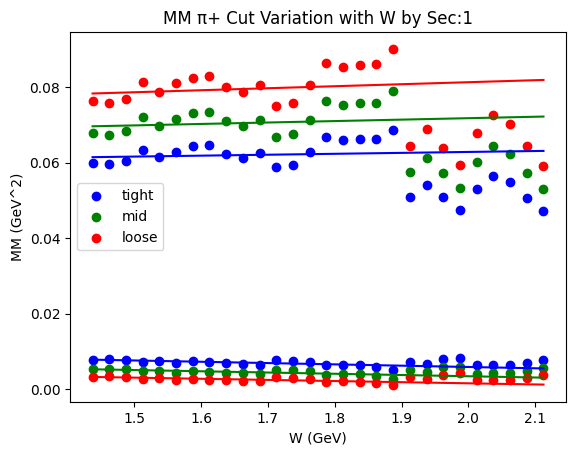

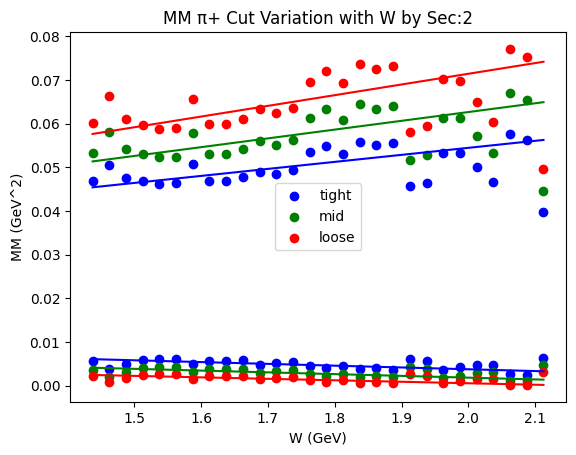

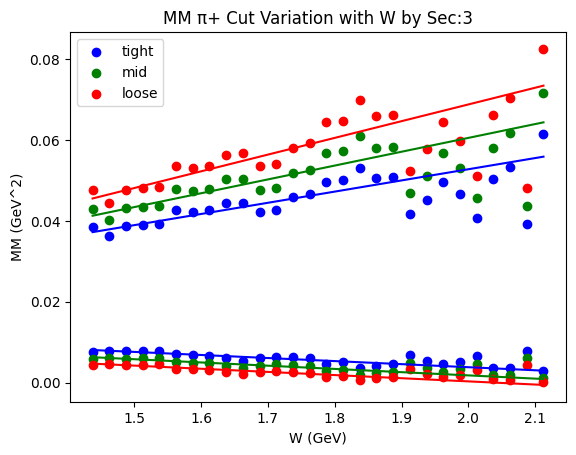

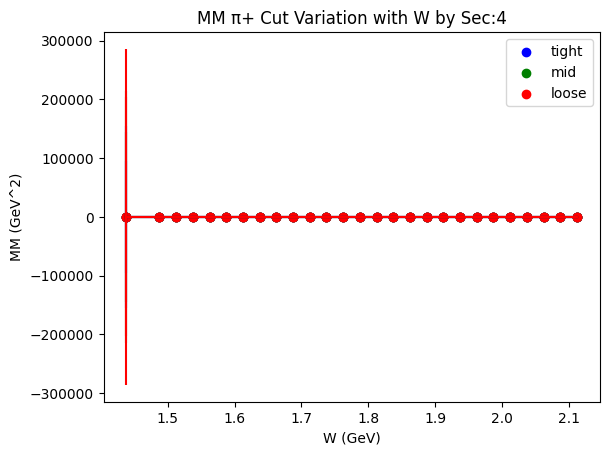

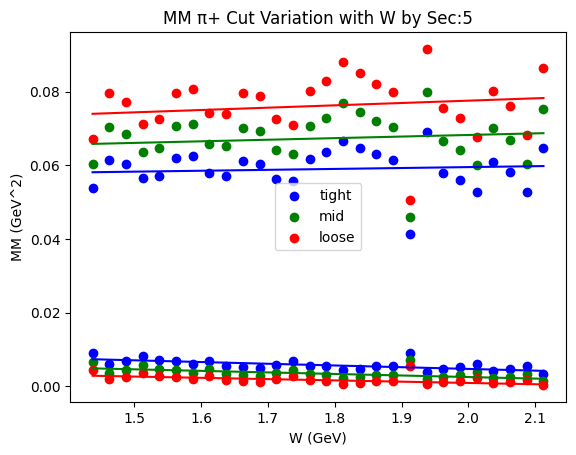

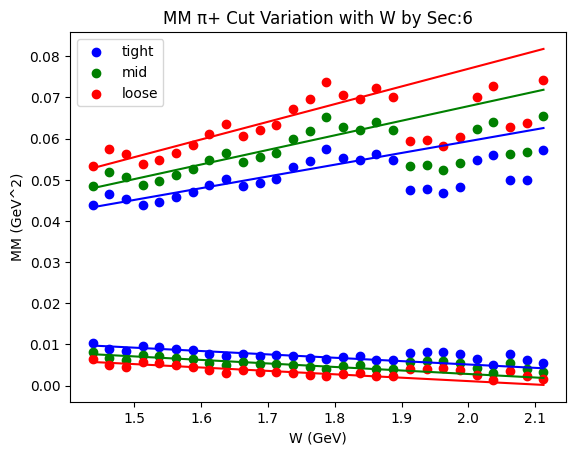

In [9]:
W_bins = [W_center(i) for i in range(_W_bins_)]

def Linear(x_,a_,b_):
    return a_ + b_*x_

lin_fit = np.zeros((6,2,3,2))

for sec in range(6):
#     y_tight_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
#     y_tight_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][0] for Wbin in range(_W_bins_)])
#     y_mid_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
#     y_mid_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][1] for Wbin in range(_W_bins_)])
#     y_loose_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
#     y_loose_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][2] for Wbin in range(_W_bins_)])
#     #x_tight = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
#     x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
    for i in range(3):
        for j in range(2):
            x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][j][i] for Wbin in range(_W_bins_)])
            y = Remove_Zeros_Y([cut_bounds[sec][Wbin][j][i] for Wbin in range(_W_bins_)])
            if j ==0:
                plt.scatter(x,y,color=color_order[i],label=cut_names[i])
                plt.errorbar(x,y,color=color_order[i],yerr=Remove_Zeros_Y([cut_bounds_err[sec][Wbin][j][i] for Wbin in range(_W_bins_)]),ls='')
            else:
                plt.scatter(x,y,color=color_order[i])
                plt.errorbar(x,y,color=color_order[i],yerr=Remove_Zeros_Y([cut_bounds_err[sec][Wbin][j][i] for Wbin in range(_W_bins_)]),ls='')
            try:
                pars, pars_cov = op.curve_fit(Linear,x,y,sigma=Remove_Zeros_Y([cut_bounds_err[sec][Wbin][j][i] for Wbin in range(_W_bins_)]),maxfev=5000)
                cont_x = np.linspace(np.min(x),np.max(x),200)
                plt.plot(cont_x,Linear(cont_x,*pars),color=color_order[i])
                lin_fit[sec][j][i][0] = pars[1]
                lin_fit[sec][j][i][1] = pars[0]
            except RuntimeError:
                print("runtime error")
            except ValueError:
                print("Value error")
#     plt.scatter(x,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
#     plt.scatter(x,y_tight_w2,color='b',)
#     plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
#     plt.scatter(x,y_mid_w2,color='g')
#     plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
#     plt.scatter(x,y_loose_w2,color='r')
#     plt.errorbar(x,y_tight_w1,color='b',yerr=cut_bounds[sec][_W_bins_][0][0])
#     plt.scatter(x,y_tight_w2,color='b',)
#     plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
#     plt.scatter(x,y_mid_w2,color='g')
#     plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
#     plt.scatter(x,y_loose_w2,color='r')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][0],_W_min_,_W_max_,color='b',label="W range tight +-{}\u03C3".format(tight))
#     plt.hlines(cut_bounds[sec][_W_bins_][1][0],_W_min_,_W_max_,color='b')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][1],_W_min_,_W_max_,color='g',label="W range mid +-{}\u03C3".format(mid))
#     plt.hlines(cut_bounds[sec][_W_bins_][1][1],_W_min_,_W_max_,color='g')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][2],_W_min_,_W_max_,color='r',label="W range loose +-{}\u03C3".format(loose))
#     plt.hlines(cut_bounds[sec][_W_bins_][1][2],_W_min_,_W_max_,color='r')
    plt.legend()
    plt.title("MM {} Cut Variation with W by Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV^2)")
    plt.show()
    
    
    
    

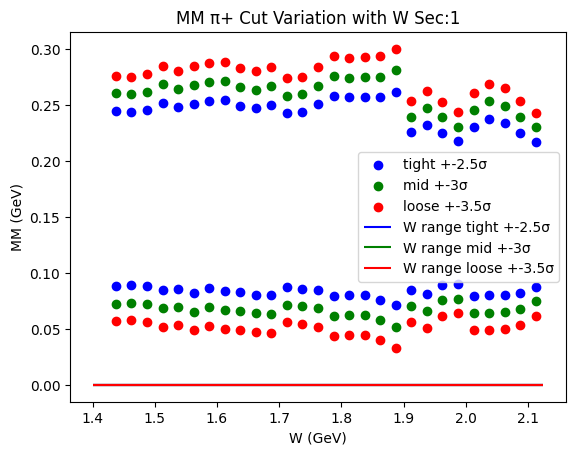

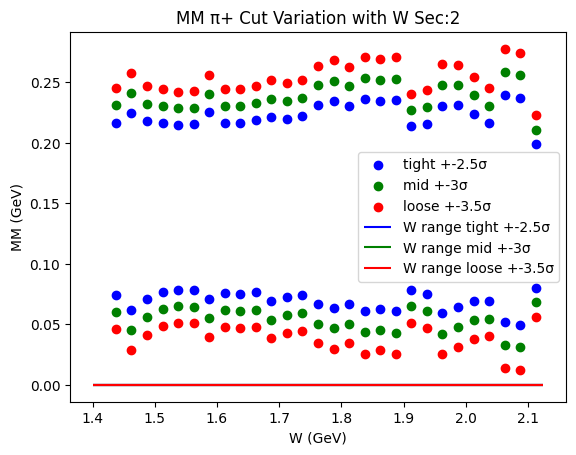

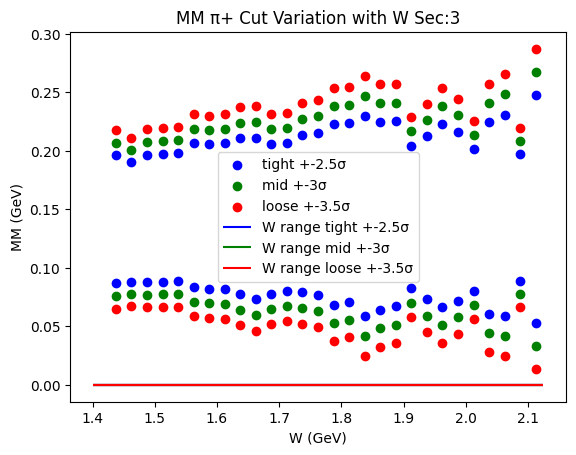

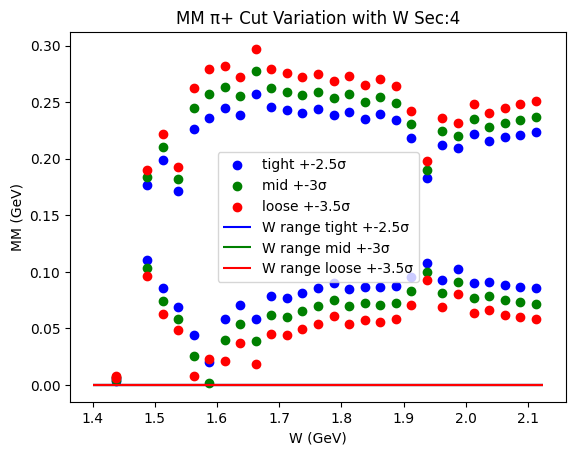

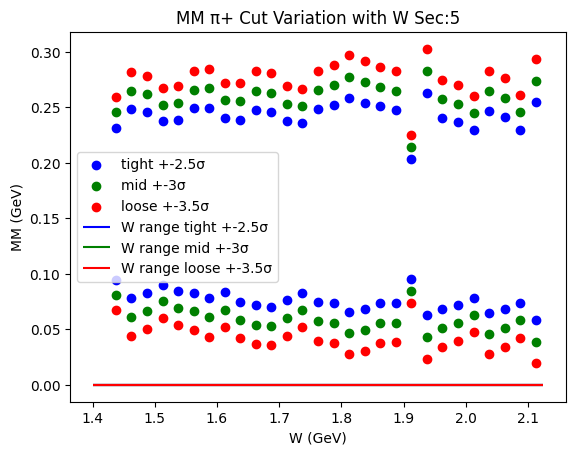

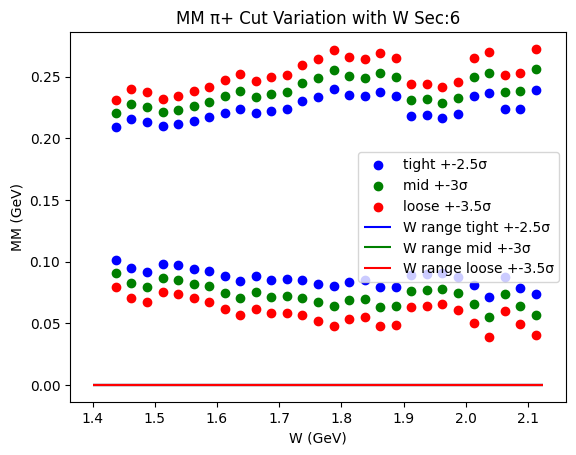

In [10]:
for sec in range(6):
    y_tight_w1 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][0])*math.sqrt(sign(cut_bounds[sec][Wbin][0][0])*cut_bounds[sec][Wbin][0][0]) for Wbin in range(_W_bins_)])
    y_tight_w2 = Remove_Zeros_Y([math.sqrt(cut_bounds[sec][Wbin][1][0]) for Wbin in range(_W_bins_)])
    y_mid_w1 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][1])*math.sqrt(sign(cut_bounds[sec][Wbin][0][1])*cut_bounds[sec][Wbin][0][1]) for Wbin in range(_W_bins_)])
    y_mid_w2 = Remove_Zeros_Y([math.sqrt(cut_bounds[sec][Wbin][1][1]) for Wbin in range(_W_bins_)])
    y_loose_w1 = Remove_Zeros_Y([math.sqrt(sign(cut_bounds[sec][Wbin][0][2])*cut_bounds[sec][Wbin][0][2]) for Wbin in range(_W_bins_)])
    y_loose_w2 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][2])*math.sqrt(cut_bounds[sec][Wbin][1][2]) for Wbin in range(_W_bins_)])
    #x_tight = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
    x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
    #x_loose = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
    plt.scatter(x,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
    plt.scatter(x,y_tight_w2,color='b',)
    plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
    plt.scatter(x,y_mid_w2,color='g')
    plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
    plt.scatter(x,y_loose_w2,color='r')
    plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][0][0]),_W_min_,_W_max_,color='b',label="W range tight +-{}\u03C3".format(tight))
    plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][1][0]),_W_min_,_W_max_,color='b')
    plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][0][1]),_W_min_,_W_max_,color='g',label="W range mid +-{}\u03C3".format(mid))
    plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][1][1]),_W_min_,_W_max_,color='g')
    plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][0][2]),_W_min_,_W_max_,color='r',label="W range loose +-{}\u03C3".format(loose))
    plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][1][2]),_W_min_,_W_max_,color='r')
    plt.legend()
    plt.title("MM {} Cut Variation with W Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV)")
    plt.show()

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_59776/3464511370.py:5: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(2)*2*m_*g_*bw_gamma(m_,g_)*sign(m_)/(np.pi*np.sqrt(m_*m_+bw_gamma(m_,g_)))


<function matplotlib.pyplot.show(close=None, block=None)>

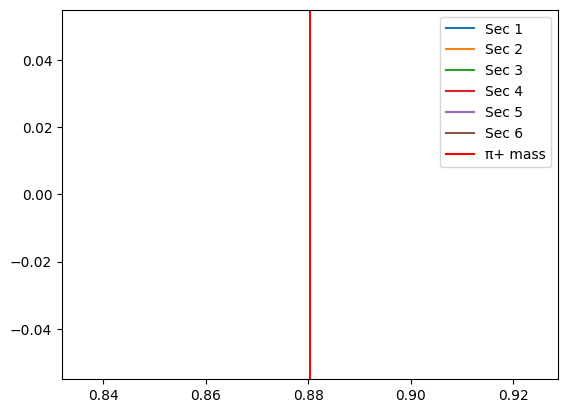

In [11]:
Wbin = _W_bins_
m_par = 0.938272088
for sec in range(6):
    plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][Wbin]),label="Sec {}".format(sec+1))
plt.axvline(x=m_par*m_par,label="{} mass".format(Particle),color='r')
plt.legend()
plt.show

In [12]:
print("MM^2 "+Particle+" Cut Bounds [sec][low/high][tight/mid/loose][slope,intercept]")
for sec in range(6):
    for side in range(2):
        for t in range(3):
            for p in range(2):
                if p ==0:
                    if t == 0:
                        if side ==0:
                            if sec==0:
                                print("{\t{\t{\t{",lin_fit[sec][side][t][p],end=",")
                            else:
                                print("\t{\t{\t{",lin_fit[sec][side][t][p],end=",")
                        else:
                            print("\t\t{\t{",lin_fit[sec][side][t][p],end=",")
                    else:
                        print("{",lin_fit[sec][side][t][p],end=",")
                elif p==1:
                    if t == 2:
                        if side == 1:
                            if sec == 5:
                                print(lin_fit[sec][side][t][p],"}}}}")
                            else:
                                print(lin_fit[sec][side][t][p],"}}},")
                        else: 
                            print(lin_fit[sec][side][t][p],"}},")
                    else:
                        print(lin_fit[sec][side][t][p],end="},")
                else: 
                     print(lin_fit[sec][side][t][p],end=",")


MM^2 π+ Cut Bounds [sec][low/high][tight/mid/loose][slope,intercept]
{	{	{	{ -0.0034522590628906944,0.01274233356937489},{ -0.003290515257155717,0.009961896962022255},{ -0.002998840889738747,0.007509266688499602 }},
		{	{ 0.0024562675322495403,0.05790194750983792},{ 0.003820961007665004,0.06411764048047269},{ 0.005321295873377947,0.07065065983304765 }}},
	{	{	{ -0.004114906805874148,0.011969619611077967},{ -0.004040111701988629,0.009900163268197188},{ -0.0033758638449333063,0.007289746336630658 }},
		{	{ 0.016076234372805667,0.022311248022167947},{ 0.020107854550613834,0.022446929496168874},{ 0.024500072594741053,0.022428028811724617 }}},
	{	{	{ -0.007572570638692617,0.018937804104889804},{ -0.008002320034728406,0.017771961075712425},{ -0.0078076235357755295,0.01590085814396391 }},
		{	{ 0.027673476562179316,-0.0025502208067125685},{ 0.03424862694448143,-0.00794107947128134},{ 0.04137566796363238,-0.013916969429303839 }}},
	{	{	{ 0.007884371775524389,-0.007016176351121479},{ 0.01670893

In [13]:
# print("MM^2 "+Particle+" Cut Bounds [sec][low/high][tight/mid/loose]")
# for sec in range(6):
#     for side in range(2):
#         for t in range(3):
#             if t == 0:
#                 if side ==0:
#                     if sec==0:
#                         print("{\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                     else:
#                         print("\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                 else:
#                     print("\t\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#             elif t == 2:
#                 if side == 1:
#                     if sec == 5:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}}}")
#                     else:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}},")
#                 else: 
#                     print(cut_bounds[sec][_W_bins_][side][t],"},")
#             else: 
#                 print(cut_bounds[sec][_W_bins_][side][t],end=",")



In [14]:
# print("MM^2 "+Particle+" Linear Cut Bounds [sec][low/high][tight/mid/loose]")
# for sec in range(6):
#     for side in range(2):
#         for t in range(3):
#             if t == 0:
#                 if side ==0:
#                     if sec==0:
#                         print("{\t{\t{","\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")
#                     else:
#                         print("\t{\t{","\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")
#                 else:
#                     print("\t{","\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")
#             elif t == 2:
#                 if side == 1:
#                     if sec == 5:
#                         print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}","}}}")
#                     else:
#                         print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}","}},")
#                 else: 
#                     print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}","},")
#             else: 
#                 print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")